# MACHINE LEARNING A-Z WITH PYTHON

## DRIVE CONNECTION

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## DATA PREPROCESSING

### PART 1 : DATA PREPROCESSING

#### A) IMPORTING LIBRARIES :  

In [ ]:
# Importing basic Libraries : 

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

- **Numpy** : Numerical Python
- **Matplotlib** : For visualization charts with (pyplot) module.
- **Pandas** : Useful library for preprocessing the dataset.

#### B) IMPORTING DATASET :  

In [ ]:
dataset = pd.read_csv('/content/drive/MyDrive/Machine Learning A-Z Datasets/Data.csv')
dataset

,Country,Age,Salary,Purchased
0,France,44.0,72000.0,No
1,Spain,27.0,48000.0,Yes
2,Germany,30.0,54000.0,No
3,Spain,38.0,61000.0,No
4,Germany,40.0,NaN,Yes
5,France,35.0,58000.0,Yes
6,Spain,NaN,52000.0,No
7,France,48.0,79000.0,Yes
8,Germany,50.0,83000.0,No
9,France,37.0,67000.0,Yes


In [ ]:
dataset.describe()

,Age,Salary
count,9.000000,9.000000
mean,38.777778,63777.777778
std,7.693793,12265.579662
min,27.000000,48000.000000
25%,35.000000,54000.000000
50%,38.000000,61000.000000
75%,44.000000,72000.000000
max,50.000000,83000.000000


Splitting The Data : 

In [ ]:
X = dataset.iloc[:,:-1]
X

,Country,Age,Salary
0,France,44.0,72000.0
1,Spain,27.0,48000.0
2,Germany,30.0,54000.0
3,Spain,38.0,61000.0
4,Germany,40.0,NaN
5,France,35.0,58000.0
6,Spain,NaN,52000.0
7,France,48.0,79000.0
8,Germany,50.0,83000.0
9,France,37.0,67000.0


- **X** : for the Feature Columns.


In [ ]:
# X = dataset.iloc[:,:-1].values
# X

In [ ]:
Y = dataset.iloc[:,-1]
Y

0     No
1    Yes
2     No
3     No
4    Yes
5    Yes
6     No
7    Yes
8     No
9    Yes
Name: Purchased, dtype: object

- **Y** : for the Dependent Columns.


In [ ]:
# Y = dataset.iloc[:,-1].values
# Y

#### C) TAKING CARE OF MISSING DATASET : 

In [ ]:
# importing Libraries : 

from sklearn.impute import SimpleImputer


- **Simple Imputer** :  It is a classs from the library **Scikit Learn**.
- Then we will create an **Object** on the **Simple Imputer Class**.
- This object will allow us to replace the **Missing values** with the **Average/Median/Mode** Values.

In [ ]:
X.replace(np.nan, X.mean(), inplace = True)

<ipython-input-10-423b4ad2e560>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  X.replace(np.nan, X.mean(), inplace = True)


In [ ]:
X = X.round(1)

In [ ]:
X

,Country,Age,Salary
0,France,44.0,72000.0
1,Spain,27.0,48000.0
2,Germany,30.0,54000.0
3,Spain,38.0,61000.0
4,Germany,40.0,63777.8
5,France,35.0,58000.0
6,Spain,38.8,52000.0
7,France,48.0,79000.0
8,Germany,50.0,83000.0
9,France,37.0,67000.0


In [ ]:
imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean')


- **Imputer** will be the **Object** of the **Simple Imputer Class**.
- Now the **Class** is assined to **Object**.
- Now we are going to pass the **arguments** in order to **replace** indeed, the **missing data** be either **Mean/Median/Mode**.
- **missing_values** : at first we need to specify which missing values we want to replace, so therefore we pass this arguments.
- There we pass **np.nan** to say that we want to replace all the **missing/null values** in the dataset.
- **Strategy** :  The second argument that we pass to replace the value.
- This argument will be equal to **'mean'/'median'/'mode'**.
- **strategy = 'mean', 'median', 'most_frequent', 'constant'**.

In [ ]:
# imputer.fit(X[:, 1:3])

- To Apply this **Imputer Object** on the **Features Dataset**.
- Remember that **Class** contains an assembly of instructions, but also some **operations and actions** which you can apply to other **objects and variables**.These are called **Methods**.
- **imputer.fit()** : where **fit** is a **method**.
-  This **method** will exactly connect this **Imputer** to the **Matrix of the Features**.




In [ ]:
# X[:, 1:3] = imputer.transform(X[:, 1:3])

- **imputer.transform()** : **Transform** is the another **Method** that transform a dataset and apply or it will **replace** the **missing values** with the **Average/Median/Mode**.

In [ ]:
# print(X)

#### ENCODING CATEGORICAL DATA: 

**ENCODING INDEPENDENT VARIABLE :**

- It will be difficult for the machine learning moel to compute some correlations between the columns, therefore we need to turn the (string categories into numbers).
- One idea is to encode these datas into numbers as 0,1,2.., However if we do this our future machine learning model can understand that.
- France = 0, Spain  = 1, germany = 2, There is a numerical order between these datas and mostly model could interpret that these order matters.
- Where as this is not in our case, There is no relationship order between these countries.
- So we don't want our model to have such interpretation because that could cause some misinterpreted correlations between the features and the outcome that we want to predict.
- So to overcome that we actually go for the **One_Hot Encoding**.
- **One-Hot Encoding** consist of turning the counry column into three columns, because there are three different classes.
- **One-Hot Encoding** consist of creating binary vectors for each of the countries.
- for example, 
-> France = 1, 0, 0
-> Germany = 0, 1, 0
-> Spain = 0, 0, 1
- So there is not numerical orde between these countries because of having zero.


In [ ]:
# One-Hot Encoding : 

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder


- We are going to use **2 Classes**.
-  1st is the **Column Transform** a class from the **Compose Module** of once again to **Scikit learn library**.
- 2nd is the **One Hot Encoder Class** from the **Preprocessing Module** of the same **Scikit Learn** library. 
- Let's import these 2 Classes.

In [ ]:
ct = ColumnTransformer(transformers = [('encoder', OneHotEncoder(), [0])], remainder = 'passthrough')


- **ct** - at first step we are going to create object of the class of **Column Transform**.
- **ColumnTransformer** remember to create an instance of an object of a class, you have to call the class itself **ColumnTransformer.
- We are going to give 2 Arguments, 
-> 1) **transformers** -> where we will specify what kind of transformation we want to do and on which index of the coumns we want to trasnsform.
-> 2) **remainder** -> whicb will specify that we actually want to keep the columns that won't be applied, some tranformations **(age, salary)**.
- **transformers**: We will specify 3 informations, 1st the kind of Transformation **('encoder)**, 2nd What kind of Encoding we want to do **(OneHotEncoder())**, 3rd To specify the indexes of the columns we want to encode **([0])**,which is the **(country columns)**.

In [ ]:
X = ct.fit_transform(X)

In [ ]:
X

array([[1.00000e+00, 0.00000e+00, 0.00000e+00, 4.40000e+01, 7.20000e+04],
       [0.00000e+00, 0.00000e+00, 1.00000e+00, 2.70000e+01, 4.80000e+04],
       [0.00000e+00, 1.00000e+00, 0.00000e+00, 3.00000e+01, 5.40000e+04],
       [0.00000e+00, 0.00000e+00, 1.00000e+00, 3.80000e+01, 6.10000e+04],
       [0.00000e+00, 1.00000e+00, 0.00000e+00, 4.00000e+01, 6.37778e+04],
       [1.00000e+00, 0.00000e+00, 0.00000e+00, 3.50000e+01, 5.80000e+04],
       [0.00000e+00, 0.00000e+00, 1.00000e+00, 3.88000e+01, 5.20000e+04],
       [1.00000e+00, 0.00000e+00, 0.00000e+00, 4.80000e+01, 7.90000e+04],
       [0.00000e+00, 1.00000e+00, 0.00000e+00, 5.00000e+01, 8.30000e+04],
       [1.00000e+00, 0.00000e+00, 0.00000e+00, 3.70000e+01, 6.70000e+04]])

In [ ]:
X = pd.DataFrame(X)

In [ ]:
X = pd.DataFrame(ct.fit_transform(X))

**Column Transformer**: Applies Transformer to Columns of an Array or pandas DataFrame.


In [ ]:
X

,0,1,2,3,4,5
0,0.0,1.0,0.0,0.0,44.0,72000.0
1,1.0,0.0,0.0,1.0,27.0,48000.0
2,1.0,0.0,1.0,0.0,30.0,54000.0
3,1.0,0.0,0.0,1.0,38.0,61000.0
4,1.0,0.0,1.0,0.0,40.0,63777.8
5,0.0,1.0,0.0,0.0,35.0,58000.0
6,1.0,0.0,0.0,1.0,38.8,52000.0
7,0.0,1.0,0.0,0.0,48.0,79000.0
8,1.0,0.0,1.0,0.0,50.0,83000.0
9,0.0,1.0,0.0,0.0,37.0,67000.0


In [ ]:
print(X)

     0    1    2    3     4        5
0  0.0  1.0  0.0  0.0  44.0  72000.0
1  1.0  0.0  0.0  1.0  27.0  48000.0
2  1.0  0.0  1.0  0.0  30.0  54000.0
3  1.0  0.0  0.0  1.0  38.0  61000.0
4  1.0  0.0  1.0  0.0  40.0  63777.8
5  0.0  1.0  0.0  0.0  35.0  58000.0
6  1.0  0.0  0.0  1.0  38.8  52000.0
7  0.0  1.0  0.0  0.0  48.0  79000.0
8  1.0  0.0  1.0  0.0  50.0  83000.0
9  0.0  1.0  0.0  0.0  37.0  67000.0


In [ ]:
X

,0,1,2,3,4,5
0,0.0,1.0,0.0,0.0,44.0,72000.0
1,1.0,0.0,0.0,1.0,27.0,48000.0
2,1.0,0.0,1.0,0.0,30.0,54000.0
3,1.0,0.0,0.0,1.0,38.0,61000.0
4,1.0,0.0,1.0,0.0,40.0,63777.8
5,0.0,1.0,0.0,0.0,35.0,58000.0
6,1.0,0.0,0.0,1.0,38.8,52000.0
7,0.0,1.0,0.0,0.0,48.0,79000.0
8,1.0,0.0,1.0,0.0,50.0,83000.0
9,0.0,1.0,0.0,0.0,37.0,67000.0


**ENCODING DEPENDENT VARIABLE :** 

In [ ]:
# Label Encoding : 

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder

- We are going to use **2 Classes**.
-  1st is the **Column Transform** a class from the **Compose Module** of once again to **Scikit learn library**.
- 2nd is the **Label Encoder Class** from the **Preprocessing Module** of the same **Scikit Learn** library. 
- Let's import these 2 Classes.

In [ ]:
le = LabelEncoder()

- **Le** :  We are going to create object for the class, and weare going to call the class **labelEncoder**.
- Open the paranthesis, and in this case we are going to enter **"Y"**, because it is only one single vector. So it will be obvious what will be needed to encode.

In [ ]:
Y = le.fit_transform(Y)

In [ ]:
Y

array([0, 1, 0, 0, 1, 1, 0, 1, 0, 1])

In [ ]:
print(Y)

[0 1 0 0 1 1 0 1 0 1]


#### Why Should We Apply Feature-Scaling After Splitting Dataset: 

- To prevent the information leakage on the **test-set**, which we are no supposed to have until the **Training** is done.
- Because the **Test-Set** is supposed to be the **Brand-New Dataset** to evaluate the **Machine Learning Model**.

#### TRAIN TEST SPLITTING : 

- We are going to be calling a function by **scikit-learn** that contains **model-selection**, which contains itself a function called **train-test split**.
- This will create **4-separate sets**.
- We will actually create a pair of **Independent Variable** fro the **training-set** and another pair of **matrix-features** and **dependent variable** for the **test-set**.

In [ ]:
from sklearn.model_selection import train_test_split

- from **sklearn** we are acessing **model selection**, from which we are going to import the **train_test_split function**.

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 1)

- Since we already know that **train_test_split** is going to return **matrix-features**.
- So all the **Independent Variables** are splitted into **X_variables** such as **X_Train** and **X_Test**.
- And all the **Dependent Variables** are splitted into **Y_variables** such as **Y_Train** and **Y_Test**.
- **Test_Size = 0.2** means **20%** of the observations will go into the **test_set**.
- **random_state = 1** this means we wanted to split the datas randomly across the dataset. 

In [ ]:
print(X_train)

     0    1    2    3     4        5
6  1.0  0.0  0.0  1.0  38.8  52000.0
4  1.0  0.0  1.0  0.0  40.0  63777.8
0  0.0  1.0  0.0  0.0  44.0  72000.0
3  1.0  0.0  0.0  1.0  38.0  61000.0
1  1.0  0.0  0.0  1.0  27.0  48000.0
7  0.0  1.0  0.0  0.0  48.0  79000.0
8  1.0  0.0  1.0  0.0  50.0  83000.0
5  0.0  1.0  0.0  0.0  35.0  58000.0


In [ ]:
print(X_test)

     0    1    2    3     4        5
2  1.0  0.0  1.0  0.0  30.0  54000.0
9  0.0  1.0  0.0  0.0  37.0  67000.0


In [ ]:
print(Y_train)

[0 1 0 0 1 1 0 1]


In [ ]:
print(Y_test)

[0 1]


#### FEATURE SCALING : 

**FEATURE SCALING** :
- It will allow to put all the **Features** on the same scale.
- Some of the Ml models in order to avoid some of the **features to be dominated by other features** in such a way that the **dominated features are not even considered by the machine learning model**.  
- We won't have to apply the **Feature Scaling** for all the **Machine Learning Models**
- It is not required to **Scale** the **Dummy Variable**, since all the varaibles are within the **Reasonable Scale**.

##### TYPES OF SCALING : 

**STANDARDISATION** :
- xstand = (x - mean(x)/standard deviation(X)
- x -> each value of the feature.
- x(m) -> mean of the feature.
- x(s.d) -> standard deviation of the feature,
- Standard Deviation -> It is the squar root of the variance.
- This technique will put all the feature between around -3 and +3.

**NORMALISATION** :
- xnorm = (x - Min(X))/(Max(X) - Min(X))
- x -> each value of the feature.
- x(min) -> minimum value of feature.
- x(max) -> maximum value of the feature.
- This technique will put all the features between 0 and 1.



##### STANDARDISATION : 

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
sc = StandardScaler()

In [ ]:
X_train.iloc[:, 3:] = sc.fit_transform(X_train.iloc[:, 3:])

In [ ]:
X_train

,0,1,2,3,4,5
6,1.0,0.0,0.0,1.290994,-0.188783,-1.078126
4,1.0,0.0,1.0,-0.774597,-0.014522,-0.070130
0,0.0,1.0,0.0,-0.774597,0.566349,0.633562
3,1.0,0.0,0.0,1.290994,-0.304957,-0.307866
1,1.0,0.0,0.0,1.290994,-1.902350,-1.420464
7,0.0,1.0,0.0,-0.774597,1.147219,1.232653
8,1.0,0.0,1.0,-0.774597,1.437654,1.574991
5,0.0,1.0,0.0,-0.774597,-0.740610,-0.564620


In [ ]:
X_test.iloc[:, 3:] = sc.transform(X_test.iloc[:, 3:])

In [ ]:
X_test

,0,1,2,3,4,5
2,1.0,0.0,1.0,-0.774597,-1.466698,-0.906957
9,0.0,1.0,0.0,-0.774597,-0.450175,0.205640


- **FIT** : 
- Method computes the **Mean** and the **Standard Deviation** of all the value.
- **TRANSFORM** : 
- Method will apply **Formula** by **Transforming** the each values in the **Dataset**. 

----

##REGRESSION

### INTRODUCTION

**What is Regresion ?**
- **Regression** is the process of **predicting** a **continuous value**.
- In **regression** there are **two types** of **variables** :
 - Y - **Dependent Variable**
 - X - **Independent Varaible**
- **Dependent Variable :** It is the **Final** or **Target** that we try to **predict**.
- **Independent Varaible :** They can be seen as **causes** of the **state** or **input**.

**There are 2 types of Regression Models :**
- **Simple Regression :** 
 - Only **One Independent Variable** is used to measure the **Dependent Vairable**. 
 - It can be either **Linear** or **Non-Linear**.
 - **Example :** Predicting **Co2 Emission** vs **Engine Size** of all cars.
- **Multiple Regression :**
 - More than **One Independent Variable** is used to measure the **Dependent Variable**.
 - It can be either **Linear** or **Non Linear**.
 - **Example :** Predicting **Co2 Emission** vs **Engine Size** and **Cylinder** of all cars.

**Application of Regression :**
- Sales Forecasting
- Satisfaction analysis
- Price Estimation
- Employment Income

**Regression Algorithms :**
- Simple Linear Regression
- Multiple Linear Regression
- Polynomial Regression
- Support Vector Regression
- Decision Tree Regression
- Random forest Regression
- Ridge Regression
- Lasso Regression
- KNN (K-Nearest Neighbors) Regression
- Neural Network Regression
- Bayesian Linear Regression
- Poisson Regression
- Stepwise Regression
- Fast Forest Quantile Regression
- Boosted Decision Tree Regression

### PART 2 : SIMPLE LINEAR REGRESSION

#### INTUITION

**EQUATION :**
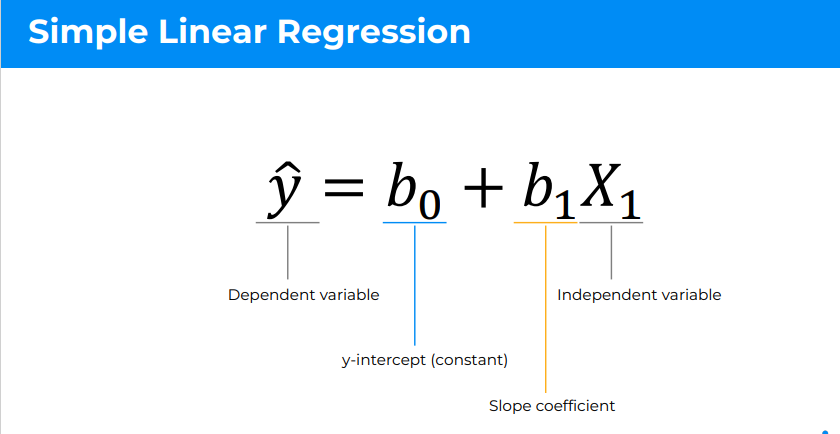

**Regression Coeff :**
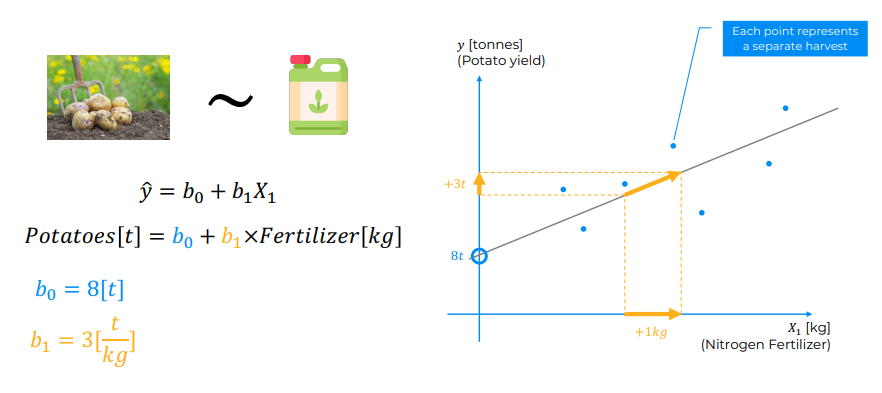

- The value of coefficient on the **independent variable** will affect on the **independent variable**.

**ORDINARY LEAST SQUARE : To Find The Best Fit Line**
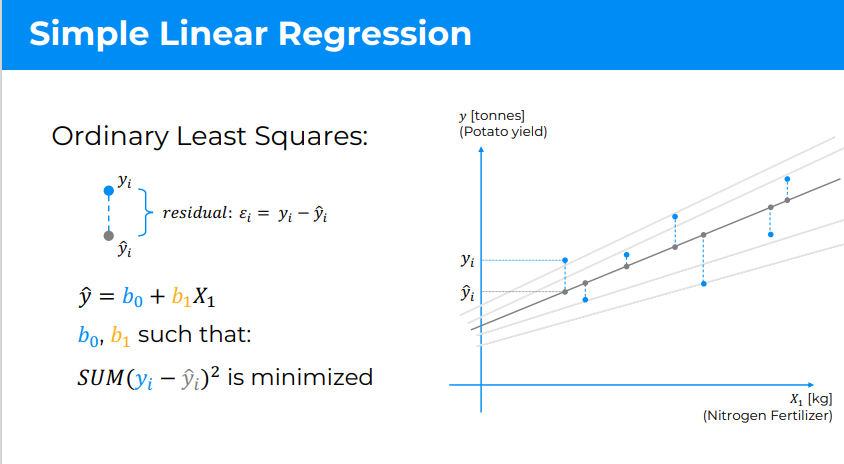

- **Yi or y** - Actual Data Points
- **Y^i or y^** - Predicted Data Points

- Random **possible fit lines** are drawn through these **data points**.
- **Best fit line** is chosen based on the **minimum value** of **residual**.

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

#### IMPORT DATASET

In [ ]:
dataset = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Salary_Data.csv")
dataset

,YearsExperience,Salary
0,1.1,39343.0
1,1.3,46205.0
2,1.5,37731.0
3,2.0,43525.0
4,2.2,39891.0
5,2.9,56642.0
6,3.0,60150.0
7,3.2,54445.0
8,3.2,64445.0
9,3.7,57189.0


In [ ]:
X = dataset.iloc[:, :-1]
Y = dataset.iloc[:, 1: ]

In [ ]:
X

,YearsExperience
0,1.1
1,1.3
2,1.5
3,2.0
4,2.2
5,2.9
6,3.0
7,3.2
8,3.2
9,3.7


In [ ]:
Y

,Salary
0,39343.0
1,46205.0
2,37731.0
3,43525.0
4,39891.0
5,56642.0
6,60150.0
7,54445.0
8,64445.0
9,57189.0


#### TRAIN TEST SPLIT:

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0)

In [ ]:
X_train

,YearsExperience
27,9.6
11,4.0
17,5.3
22,7.9
5,2.9
16,5.1
8,3.2
14,4.5
23,8.2
20,6.8


In [ ]:
Y_train

,Salary
27,112635.0
11,55794.0
17,83088.0
22,101302.0
5,56642.0
16,66029.0
8,64445.0
14,61111.0
23,113812.0
20,91738.0


In [ ]:
X_test

,YearsExperience
2,1.5
28,10.3
13,4.1
10,3.9
26,9.5
24,8.7


In [ ]:

Y_test

,Salary
2,37731.0
28,122391.0
13,57081.0
10,63218.0
26,116969.0
24,109431.0


#### TRAINING SIMPLE LINEAR REGRESSION MODEL ON THE TRAINING SET

In [ ]:
from sklearn.linear_model import LinearRegression

- Library : **Scikit Learn** as **sklearn**
- We are going to access certain **model** called **linear_model** and, 
- In that **model** we are going to access certain **class** called **LinearRegression**.

In [ ]:
LR = LinearRegression()

- create a **new variable** as **regressor** which will be the **instance** of the **LinearRegression()** object.

In [ ]:
LR.fit(X_train, Y_train)

LinearRegression()

- Now take the object **regressor** and add the method called **fit()**.
- Now pass the **X_train**, **Y_train** inside the method. to train the **model**.

#### PREDICTING THE TEST RESULTS

In [ ]:
y_pred = LR.predict(X_test)

In [ ]:
Y_pred = pd.DataFrame(y_pred, columns = ["Salary Predicted"])
Y_pred

,Salary Predicted
0,40748.961841
1,122699.622956
2,64961.657170
3,63099.142145
4,115249.562855
5,107799.502753


#### COMPARING PREDICTED AND ACTUAL VALUES

In [ ]:
Data = X_test.join(Y_test)
Data

,YearsExperience,Salary
2,1.5,37731.0
28,10.3,122391.0
13,4.1,57081.0
10,3.9,63218.0
26,9.5,116969.0
24,8.7,109431.0


In [ ]:
Comparing_Data = pd.DataFrame(np.array(Data), columns = ["Years of Experience", "Actual Salary"])
Comparing_Data

,Years of Experience,Actual Salary
0,1.5,37731.0
1,10.3,122391.0
2,4.1,57081.0
3,3.9,63218.0
4,9.5,116969.0
5,8.7,109431.0


In [ ]:
Comparing_Data.join(Y_pred)

,Years of Experience,Actual Salary,Salary Predicted
0,1.5,37731.0,40748.961841
1,10.3,122391.0,122699.622956
2,4.1,57081.0,64961.657170
3,3.9,63218.0,63099.142145
4,9.5,116969.0,115249.562855
5,8.7,109431.0,107799.502753


#### VISUALISING THE TRAINING SET RESULTS

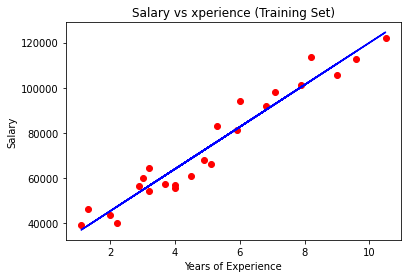

In [ ]:
plt.scatter(X_train, Y_train, color = "red")
plt.plot(X_train, LR.predict(X_train), color = 'blue')
plt.title("Salary vs xperience (Training Set)")
plt.xlabel("Years of Experience")
plt.ylabel("Salary")
plt.show()

- at **scatter** method we are plotting the **actual data points** on the graph.
- at **plot** method we are plotting the **predicted values** of the **regression**. 

#### VISUALISING THE TEST SET RESULTS

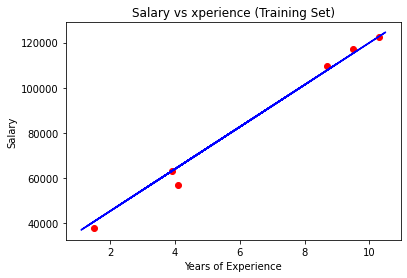

In [ ]:
plt.scatter(X_test, Y_test, color = "red")
plt.plot(X_train, LR.predict(X_train), color = 'blue')
plt.title("Salary vs xperience (Training Set)")
plt.xlabel("Years of Experience")
plt.ylabel("Salary")
plt.show()

- Similarly we are using **scatter** method to plot the **actual data values** in the **Test Set**.
- and using **plot** method we are plotting the **Predicted Regression Line** in the **Test Set**.
- here we are using the same same **coordinates** of **training** for the **plot** method, because we are looking how the same **algorithm** in the **Train Set** is working on the **Test Set**.

#### GETTING THE COEFFIECIENTS OF THE REGRESSION LINE

In [ ]:
print("Slope = ", LR.coef_)
print("Intercept =", LR.intercept_)

Slope =  [[9312.57512673]]
Intercept = [26780.09915063]


#### MAKING SINGLE PREDICTION (EXAMPLE EMPLOYEE OF 12 YEARS EXPERIENCE)

In [ ]:
print(LR.predict([[12]]))

[[138531.00067138]]


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


### PART 3 : MULTIPLE LINEAR REGRESSION

#### INTUITION

**EQUATION :**
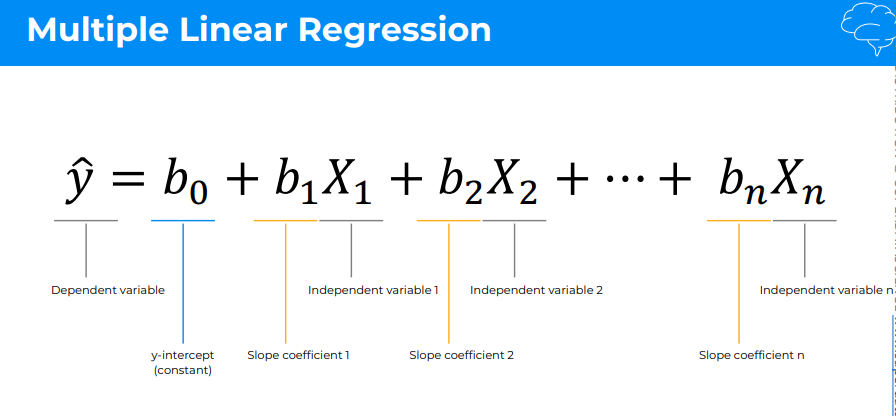

**MULTIPLE LINEAR REGRESSION COEFF :**
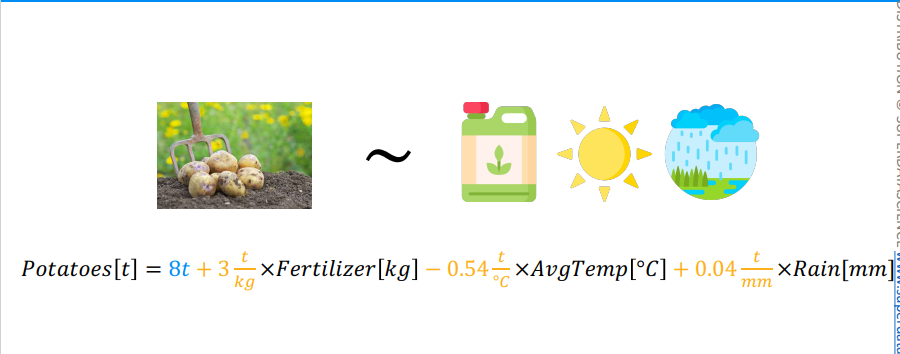

**ASSUPTION CHECK :**
- Do we really need to check on the **assumptions** of the **linear regression** ?
 - Not necessary, because if the **columns** in the **dataset** not having the **linear relationship** then it so **obvious** that the **model** is going to give **poor accuracy**.


**DUMMY  VARIABLE TRAP :**
- Do we have to **manually avoid** the **dummy varable trap** ?
 - Not necessary, because the **in-built class** that we are oing to call in the **multiple linea regresion** will **automatically** avoid the clash of **dummy variable**.

**CLASS OF MULTIPLE LINEAR REGRESSION :**
- The **class** that we are about to use to **build** and **train** this **multiple linear  regression model** is actually the exactly same **class** as for the **simple linear regression model**.
- It will just **recognize** that there are **several features** and therefore that we are doing **multiple linear regression**, but rest will be the exactly same.
- It will be **trained** to understand the **correlations** between all your **features**.

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/50_Startups.csv")
data

,R&D Spend,Administration,Marketing Spend,State,Profit
0,165349.20,136897.80,471784.10,New York,192261.83
1,162597.70,151377.59,443898.53,California,191792.06
2,153441.51,101145.55,407934.54,Florida,191050.39
3,144372.41,118671.85,383199.62,New York,182901.99
4,142107.34,91391.77,366168.42,Florida,166187.94
5,131876.90,99814.71,362861.36,New York,156991.12
6,134615.46,147198.87,127716.82,California,156122.51
7,130298.13,145530.06,323876.68,Florida,155752.60
8,120542.52,148718.95,311613.29,New York,152211.77
9,123334.88,108679.17,304981.62,California,149759.96


In [ ]:
X = data.iloc[:, :-1]
X

,R&D Spend,Administration,Marketing Spend,State
0,165349.20,136897.80,471784.10,New York
1,162597.70,151377.59,443898.53,California
2,153441.51,101145.55,407934.54,Florida
3,144372.41,118671.85,383199.62,New York
4,142107.34,91391.77,366168.42,Florida
5,131876.90,99814.71,362861.36,New York
6,134615.46,147198.87,127716.82,California
7,130298.13,145530.06,323876.68,Florida
8,120542.52,148718.95,311613.29,New York
9,123334.88,108679.17,304981.62,California


In [ ]:
Y = data.iloc[:, -1]
Y.columns = ["Profit"]
Y

0     192261.83
1     191792.06
2     191050.39
3     182901.99
4     166187.94
5     156991.12
6     156122.51
7     155752.60
8     152211.77
9     149759.96
10    146121.95
11    144259.40
12    141585.52
13    134307.35
14    132602.65
15    129917.04
16    126992.93
17    125370.37
18    124266.90
19    122776.86
20    118474.03
21    111313.02
22    110352.25
23    108733.99
24    108552.04
25    107404.34
26    105733.54
27    105008.31
28    103282.38
29    101004.64
30     99937.59
31     97483.56
32     97427.84
33     96778.92
34     96712.80
35     96479.51
36     90708.19
37     89949.14
38     81229.06
39     81005.76
40     78239.91
41     77798.83
42     71498.49
43     69758.98
44     65200.33
45     64926.08
46     49490.75
47     42559.73
48     35673.41
49     14681.40
Name: Profit, dtype: float64

#### ENCODING CATEGORICAL DATA:

In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

In [ ]:
ct = ColumnTransformer(transformers = [('encoder', OneHotEncoder(), [3])], remainder = 'passthrough')
X = pd.DataFrame(ct.fit_transform(X))

In [ ]:
X.columns = ["State(New York)", "State(California)", "State(Florida)", "R&D Spend", "Administration", "Marketing Spend"]
X

,State(New York),State(California),State(Florida),R&D Spend,Administration,Marketing Spend
0,0.0,0.0,1.0,165349.20,136897.80,471784.10
1,1.0,0.0,0.0,162597.70,151377.59,443898.53
2,0.0,1.0,0.0,153441.51,101145.55,407934.54
3,0.0,0.0,1.0,144372.41,118671.85,383199.62
4,0.0,1.0,0.0,142107.34,91391.77,366168.42
5,0.0,0.0,1.0,131876.90,99814.71,362861.36
6,1.0,0.0,0.0,134615.46,147198.87,127716.82
7,0.0,1.0,0.0,130298.13,145530.06,323876.68
8,0.0,0.0,1.0,120542.52,148718.95,311613.29
9,1.0,0.0,0.0,123334.88,108679.17,304981.62


- 0 -> New York
- 1 -> California
- 2 -> Florida

#### TRAIN TEST SPLIT:

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0)

In [ ]:
X_train

,State(New York),State(California),State(Florida),R&D Spend,Administration,Marketing Spend
33,0.0,1.0,0.0,55493.95,103057.49,214634.81
35,0.0,0.0,1.0,46014.02,85047.44,205517.64
26,0.0,1.0,0.0,75328.87,144135.98,134050.07
34,1.0,0.0,0.0,46426.07,157693.92,210797.67
18,0.0,1.0,0.0,91749.16,114175.79,294919.57
7,0.0,1.0,0.0,130298.13,145530.06,323876.68
14,0.0,1.0,0.0,119943.24,156547.42,256512.92
45,0.0,0.0,1.0,1000.23,124153.04,1903.93
48,0.0,0.0,1.0,542.05,51743.15,0.00
29,0.0,0.0,1.0,65605.48,153032.06,107138.38


In [ ]:
X_test

,State(New York),State(California),State(Florida),R&D Spend,Administration,Marketing Spend
28,0.0,1.0,0.0,66051.52,182645.56,118148.20
11,1.0,0.0,0.0,100671.96,91790.61,249744.55
10,0.0,1.0,0.0,101913.08,110594.11,229160.95
41,0.0,1.0,0.0,27892.92,84710.77,164470.71
2,0.0,1.0,0.0,153441.51,101145.55,407934.54
27,0.0,0.0,1.0,72107.60,127864.55,353183.81
38,0.0,0.0,1.0,20229.59,65947.93,185265.10
31,0.0,0.0,1.0,61136.38,152701.92,88218.23
22,0.0,1.0,0.0,73994.56,122782.75,303319.26
4,0.0,1.0,0.0,142107.34,91391.77,366168.42


In [ ]:
Y_train

33     96778.92
35     96479.51
26    105733.54
34     96712.80
18    124266.90
7     155752.60
14    132602.65
45     64926.08
48     35673.41
29    101004.64
15    129917.04
30     99937.59
32     97427.84
16    126992.93
42     71498.49
20    118474.03
43     69758.98
8     152211.77
13    134307.35
25    107404.34
5     156991.12
17    125370.37
40     78239.91
49     14681.40
1     191792.06
12    141585.52
37     89949.14
24    108552.04
6     156122.51
23    108733.99
36     90708.19
21    111313.02
19    122776.86
9     149759.96
39     81005.76
46     49490.75
3     182901.99
0     192261.83
47     42559.73
44     65200.33
Name: Profit, dtype: float64

In [ ]:
Y_test

28    103282.38
11    144259.40
10    146121.95
41     77798.83
2     191050.39
27    105008.31
38     81229.06
31     97483.56
22    110352.25
4     166187.94
Name: Profit, dtype: float64

#### TRAINING MULTIPLE LINEAR REGRESSION MODEL ON THE TRAINING SET

In [ ]:
from sklearn.linear_model import LinearRegression
M_LR = LinearRegression()

In [ ]:
M_LR.fit(X_train, Y_train)

LinearRegression()

#### PREDICTING THE TEST RESULTS

- Since it is **impossible** to **visualize** and see the **graph plotted** on **multi-dimensions** (more than 3).
- So instead we will actually **display two vectors**,
 - **vector_1** = **target_variable (real_values/actual_values)**
 - **vector_2 = target_variable(predicted_values)**

In [ ]:
Y_pred = M_LR.predict(X_test)
Y_pred = pd.DataFrame(Y_pred, columns = ["Profit Predicted"])
Y_pred

,Profit Predicted
0,103015.201598
1,132582.277608
2,132447.738452
3,71976.098513
4,178537.482211
5,116161.242302
6,67851.692097
7,98791.733747
8,113969.435330
9,167921.065696


In [ ]:
np.set_printoptions(precision = 2)

In [ ]:
Test_Set = X_test.join(Y_test)
Test_Set

,State(New York),State(California),State(Florida),R&D Spend,Administration,Marketing Spend,Profit
28,0.0,1.0,0.0,66051.52,182645.56,118148.20,103282.38
11,1.0,0.0,0.0,100671.96,91790.61,249744.55,144259.40
10,0.0,1.0,0.0,101913.08,110594.11,229160.95,146121.95
41,0.0,1.0,0.0,27892.92,84710.77,164470.71,77798.83
2,0.0,1.0,0.0,153441.51,101145.55,407934.54,191050.39
27,0.0,0.0,1.0,72107.60,127864.55,353183.81,105008.31
38,0.0,0.0,1.0,20229.59,65947.93,185265.10,81229.06
31,0.0,0.0,1.0,61136.38,152701.92,88218.23,97483.56
22,0.0,1.0,0.0,73994.56,122782.75,303319.26,110352.25
4,0.0,1.0,0.0,142107.34,91391.77,366168.42,166187.94


In [ ]:
Test_Data = pd.DataFrame(np.array(Test_Set), columns = ["State(New York)", "State(California)", "State(Florida)", "R&D Spend", "Administration", "Marketing Spend", "Actual Profit"])
Test_Data

,State(New York),State(California),State(Florida),R&D Spend,Administration,Marketing Spend,Actual Profit
0,0.0,1.0,0.0,66051.52,182645.56,118148.20,103282.38
1,1.0,0.0,0.0,100671.96,91790.61,249744.55,144259.40
2,0.0,1.0,0.0,101913.08,110594.11,229160.95,146121.95
3,0.0,1.0,0.0,27892.92,84710.77,164470.71,77798.83
4,0.0,1.0,0.0,153441.51,101145.55,407934.54,191050.39
5,0.0,0.0,1.0,72107.60,127864.55,353183.81,105008.31
6,0.0,0.0,1.0,20229.59,65947.93,185265.10,81229.06
7,0.0,0.0,1.0,61136.38,152701.92,88218.23,97483.56
8,0.0,1.0,0.0,73994.56,122782.75,303319.26,110352.25
9,0.0,1.0,0.0,142107.34,91391.77,366168.42,166187.94


In [ ]:
Compare_Data = Test_Data.join(Y_pred)
Compare_Data

,State(New York),State(California),State(Florida),R&D Spend,Administration,Marketing Spend,Actual Profit,Profit Predicted
0,0.0,1.0,0.0,66051.52,182645.56,118148.20,103282.38,103015.201598
1,1.0,0.0,0.0,100671.96,91790.61,249744.55,144259.40,132582.277608
2,0.0,1.0,0.0,101913.08,110594.11,229160.95,146121.95,132447.738452
3,0.0,1.0,0.0,27892.92,84710.77,164470.71,77798.83,71976.098513
4,0.0,1.0,0.0,153441.51,101145.55,407934.54,191050.39,178537.482211
5,0.0,0.0,1.0,72107.60,127864.55,353183.81,105008.31,116161.242302
6,0.0,0.0,1.0,20229.59,65947.93,185265.10,81229.06,67851.692097
7,0.0,0.0,1.0,61136.38,152701.92,88218.23,97483.56,98791.733747
8,0.0,1.0,0.0,73994.56,122782.75,303319.26,110352.25,113969.435330
9,0.0,1.0,0.0,142107.34,91391.77,366168.42,166187.94,167921.065696


#### R - SQUARE

In [ ]:
from sklearn.metrics import r2_score
score = r2_score(Y_pred, Y_test)
score

0.9293749209318495

- We will look about the **R-Square** concept in the later part of this **Course Session**.

### PART 4 : POLYNOMIAL REGRESSION

#### INTUITION

**EQUATION :**
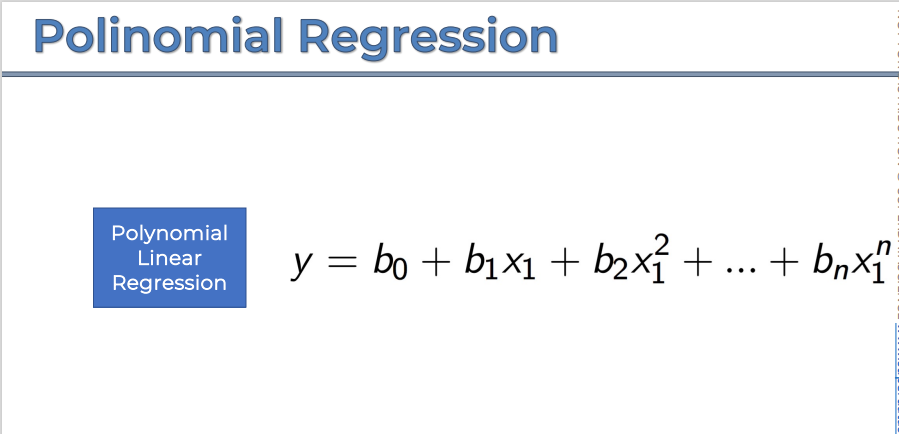

**SIMPLE LINEAR REGRESSION VS POLYNOMIAL REGRESSION : EQUATIONS**
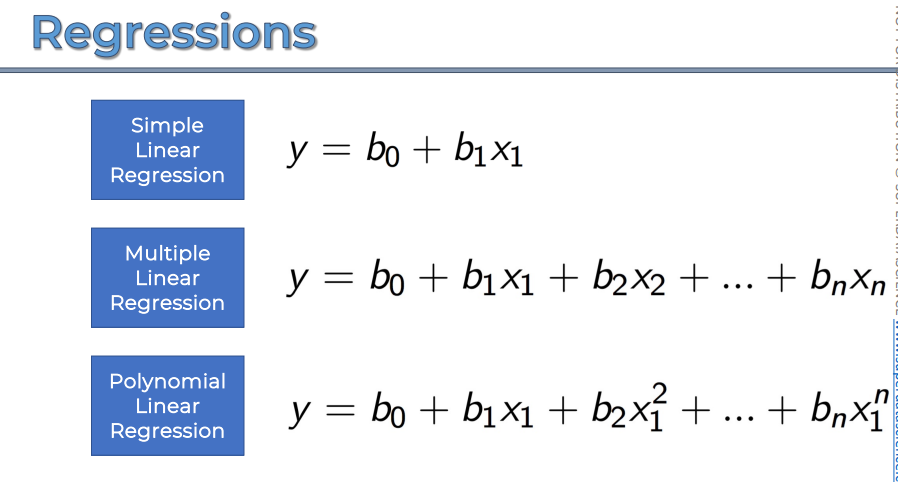

**SIMPLE LINEAR REGRESSION VS POLYNOMIAL REGRESSION : PLOTTING**

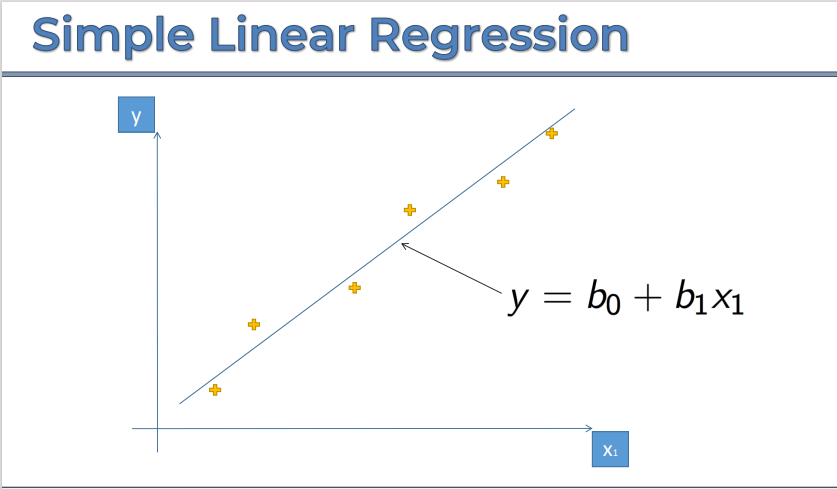

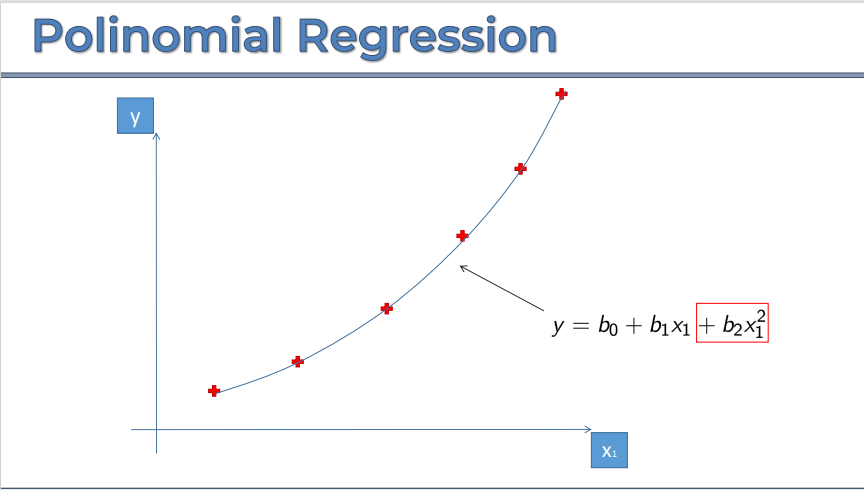

**SIMPLE LINEAR REGRESSION IS NOT BEST FIT :**
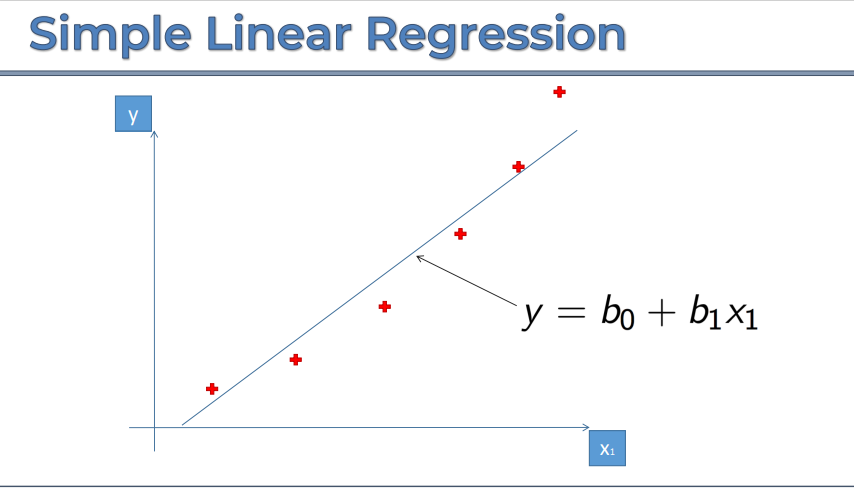

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Position_Salaries.csv")
data

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000
5,Region Manager,6,150000
6,Partner,7,200000
7,Senior Partner,8,300000
8,C-level,9,500000
9,CEO,10,1000000


In [ ]:
X = data.iloc[:, 1:-1]
X

,Level
0,1
1,2
2,3
3,4
4,5
5,6
6,7
7,8
8,9
9,10


In [ ]:
Y = data.iloc[:, -1]
Y 

0      45000
1      50000
2      60000
3      80000
4     110000
5     150000
6     200000
7     300000
8     500000
9    1000000
Name: Salary, dtype: int64

#### TRAINING LINEAR REGRESSION MODEL ON THE WHOLE DATASET

In [ ]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()

In [ ]:
LR.fit(X, Y)

LinearRegression()

#### TRAINING POLYNOMIAL REGRESSION MODEL ON THE WHOLE DATASET

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
PF = PolynomialFeatures(degree = 2)

In [ ]:
X_poly = PF.fit_transform(X)
X_poly = pd.DataFrame(X_poly)

In [ ]:
X_poly

,0,1,2
0,1.0,1.0,1.0
1,1.0,2.0,4.0
2,1.0,3.0,9.0
3,1.0,4.0,16.0
4,1.0,5.0,25.0
5,1.0,6.0,36.0
6,1.0,7.0,49.0
7,1.0,8.0,64.0
8,1.0,9.0,81.0
9,1.0,10.0,100.0


In [ ]:
PR = LinearRegression()

In [ ]:
PR.fit(X_poly, Y)

LinearRegression()

#### VISUALISING THE LINEAR REGRESSION RESULT

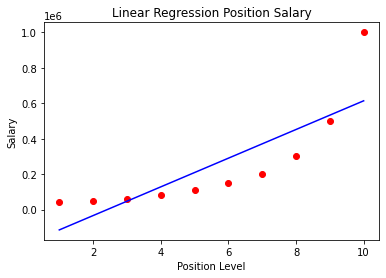

In [ ]:
plt.scatter(X, Y, color = 'red')
plt.plot(X, LR.predict(X), color = 'blue')
plt.title("Linear Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

#### VISUALISING THE POLYNOMIAL REGRESSION RESULT

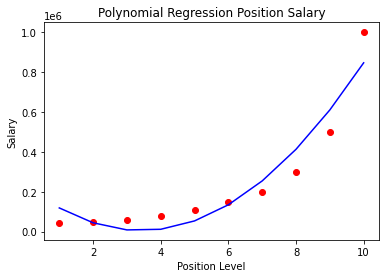

In [ ]:
plt.scatter(X, Y, color = 'red')
plt.plot(X, PR.predict(X_poly), color = 'blue')
plt.title("Polynomial Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

#### VISUALISING THE POLYNOMIAL REGRESSION RESULT (FOR HIGHER RESOLUTION AND SMOOTHER CURVE)

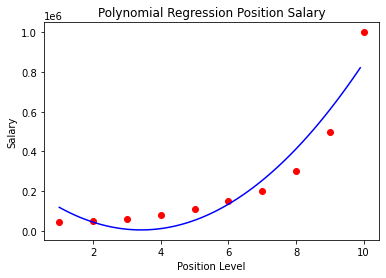

In [ ]:
X = data.iloc[:, 1:-1].values
Y = data.iloc[:, -1].values
X_poly = PF.fit_transform(X)
PR.fit(X_poly, Y)
X_grid = np.arange(min(X), max(X), 0.1)
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(X, Y, color = "red")
plt.plot(X_grid, PR.predict(PF.fit_transform(X_grid)), color = "blue")
plt.title("Polynomial Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

#### PREDICTING NEW RESULT WITH LINEAR REGRESSION

In [ ]:
LR.predict([[6.5]])

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([330378.78787879])

#### PREDICTING NEW RESULT WITH POLYNOMIAL REGRESSION

In [ ]:
PR.predict(PF.fit_transform([[6.5]]))

array([189498.10606061])

#### ALTERNATIVE PREDICTION WITH INCREASE IN DEGREE

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
PF_2 = PolynomialFeatures(degree = 4)

In [ ]:
X_poly_2 = PF_2.fit_transform(X)
X_poly_2 = pd.DataFrame(X_poly_2)
X_poly_2

,0,1,2,3,4
0,1.0,1.0,1.0,1.0,1.0
1,1.0,2.0,4.0,8.0,16.0
2,1.0,3.0,9.0,27.0,81.0
3,1.0,4.0,16.0,64.0,256.0
4,1.0,5.0,25.0,125.0,625.0
5,1.0,6.0,36.0,216.0,1296.0
6,1.0,7.0,49.0,343.0,2401.0
7,1.0,8.0,64.0,512.0,4096.0
8,1.0,9.0,81.0,729.0,6561.0
9,1.0,10.0,100.0,1000.0,10000.0


In [ ]:
PR.fit(X_poly_2, Y)

LinearRegression()

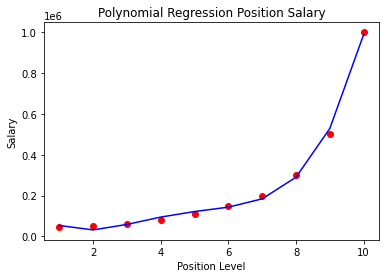

In [ ]:
plt.scatter(X, Y, color = 'red')
plt.plot(X, PR.predict(X_poly_2), color = 'blue')
plt.title("Polynomial Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

In [ ]:
PR.predict(PF_2.fit_transform([[6.5]]))

array([158862.45265155])

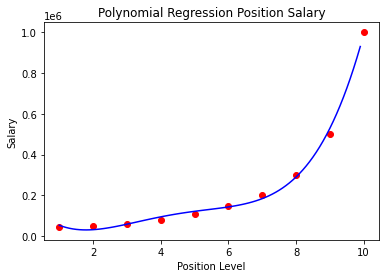

In [ ]:
X = data.iloc[:, 1:-1].values
Y = data.iloc[:, -1].values
X_poly_2 = PF_2.fit_transform(X)
PR.fit(X_poly_2, Y)
X_grid = np.arange(min(X), max(X), 0.1)
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(X, Y, color = "red")
plt.plot(X_grid, PR.predict(PF_2.fit_transform(X_grid)), color = "blue")
plt.title("Polynomial Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

### PART 5 : DECISION TREE REGRESSION

#### INTUITION

**CART :**
- **CLASSIFICATION AND REGRESSION TREES**
- 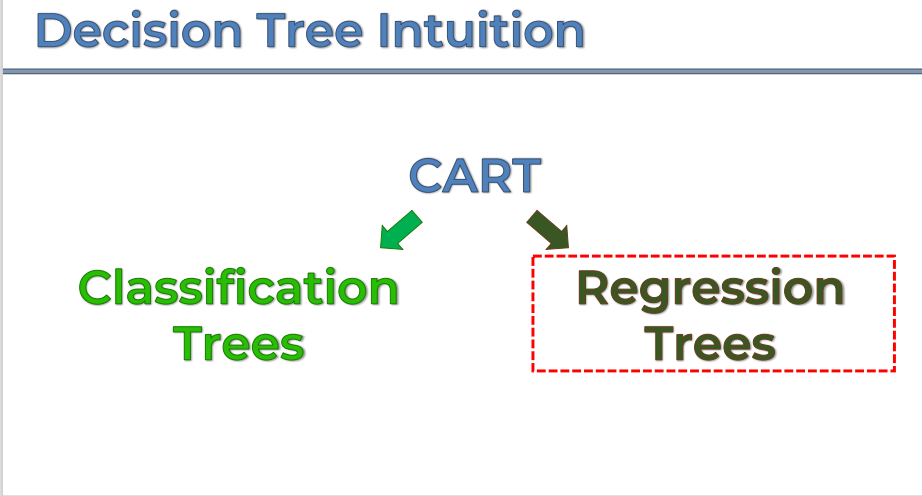

**SPLIT INTUITION :**
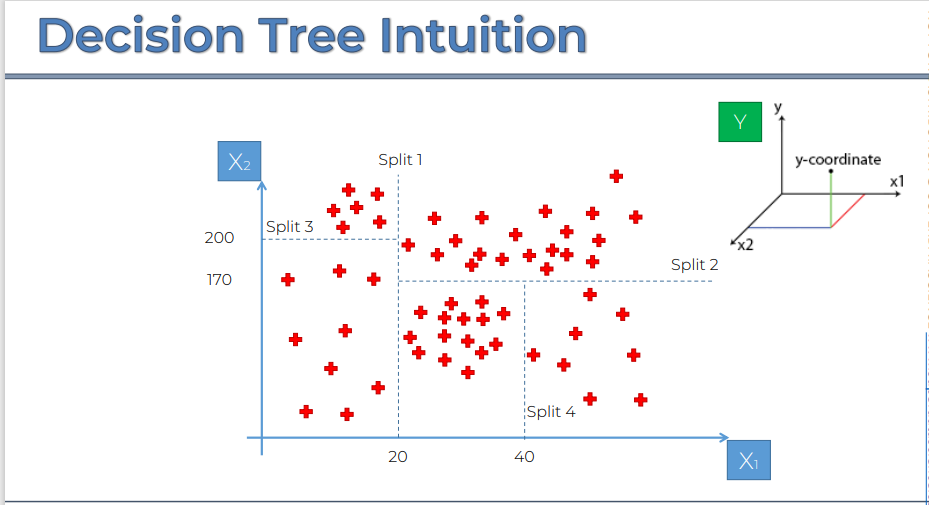

- Here is the **scatter plot** of our **dataset**.
- We have **2 Independent Variables** and therefore in this case the **Dependent Variable** is in the **3rd Dimensional**.
- So in the **Regression Trees** the **Scatter Plots** will **Spli** into **Segments** and that is **Determined** by the **Algorithm**.
- So it involves looking at something a **Term** called **Information Entropy**.
- The **Split** performed will **increase** the **information** about the **Data Points** we have.
- The **Algorithm** knows **when** to **stop** and **when** there is a cerain **minimum** for the **information** that needs to added.
- The **Algorithm** is finding the **Optimal Splits** of an **Dataset** into these **Leaves**.


**SPLIT 1 :**
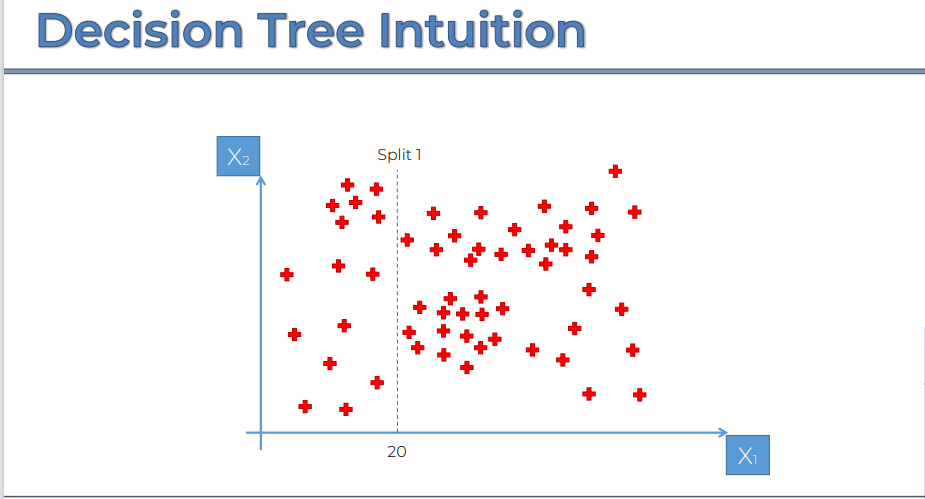

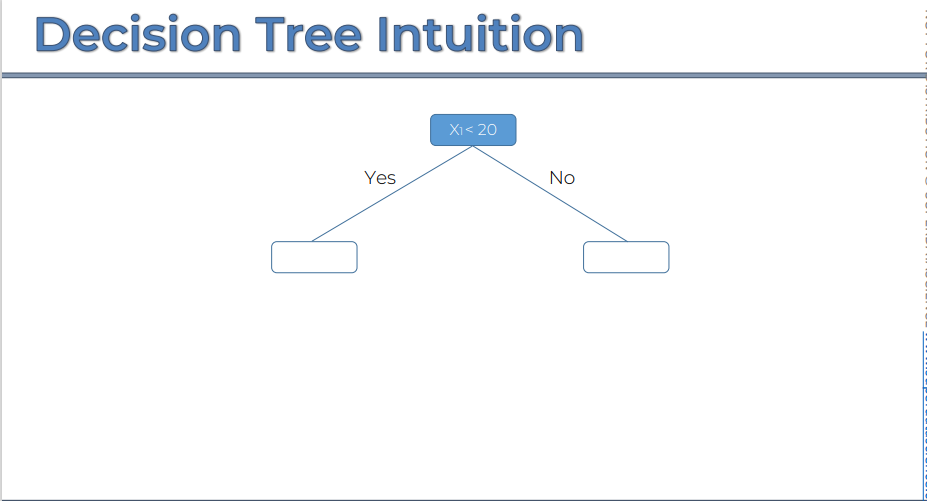

**SPLIT 2 :**
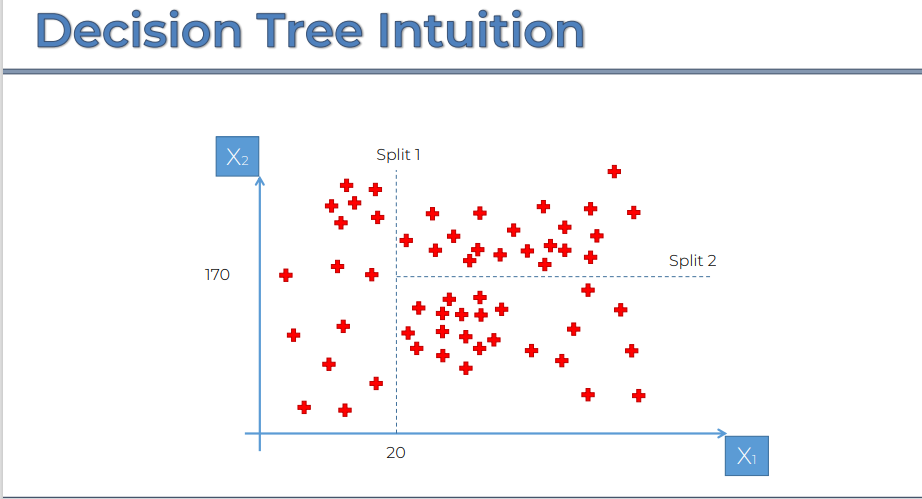

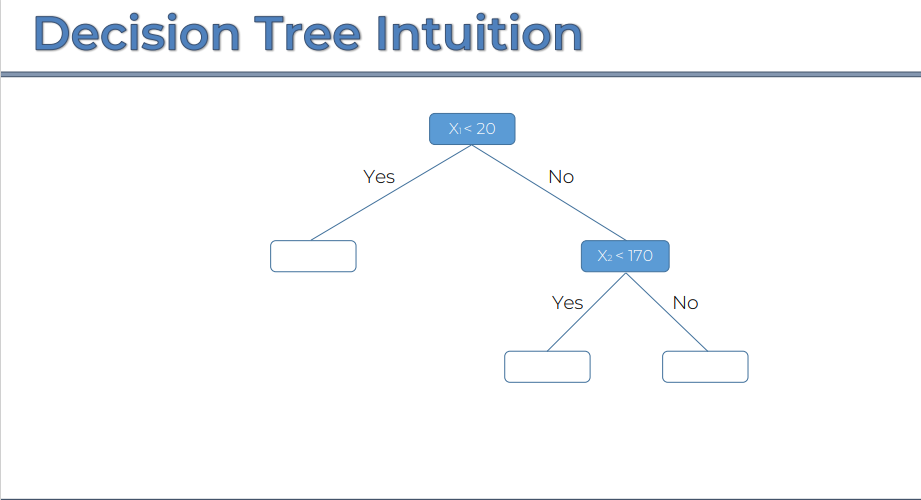

**SPLIT 3 :**
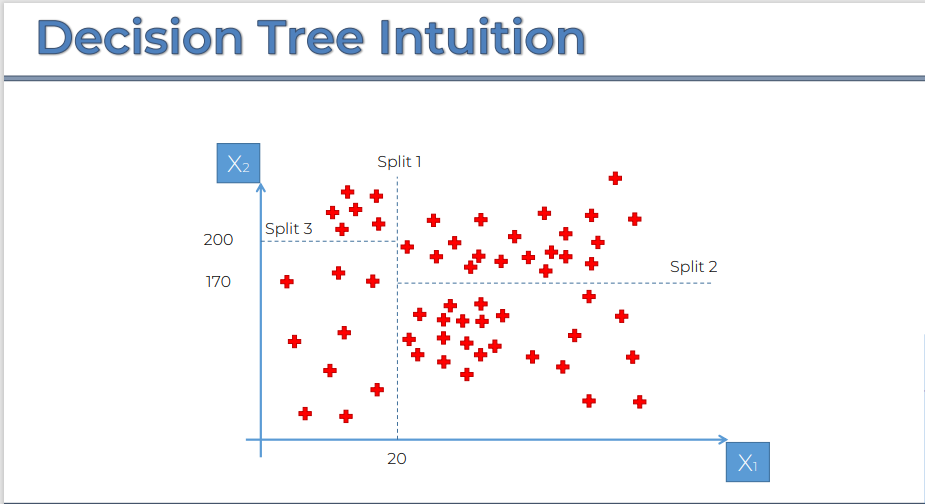

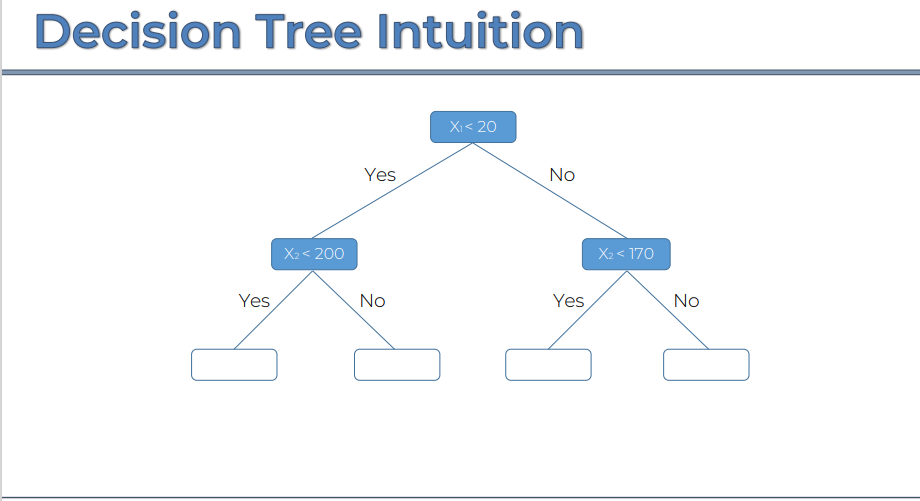

**SPLIT 4 :**
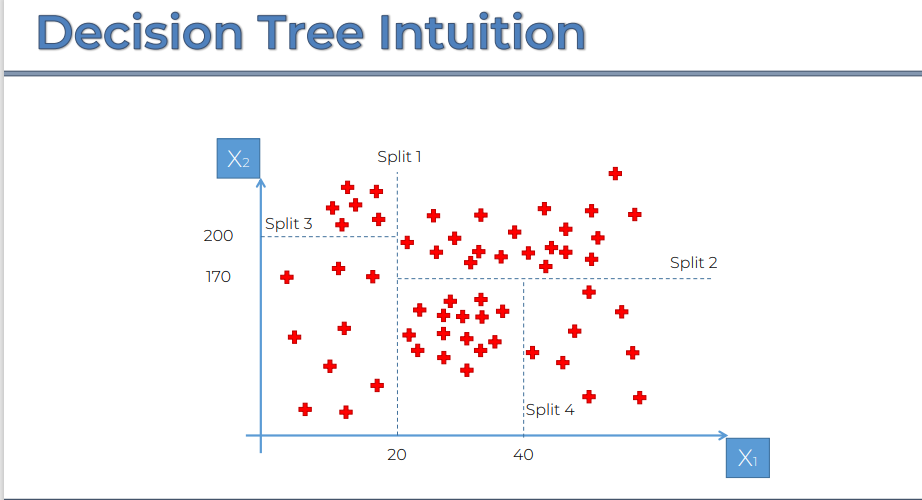

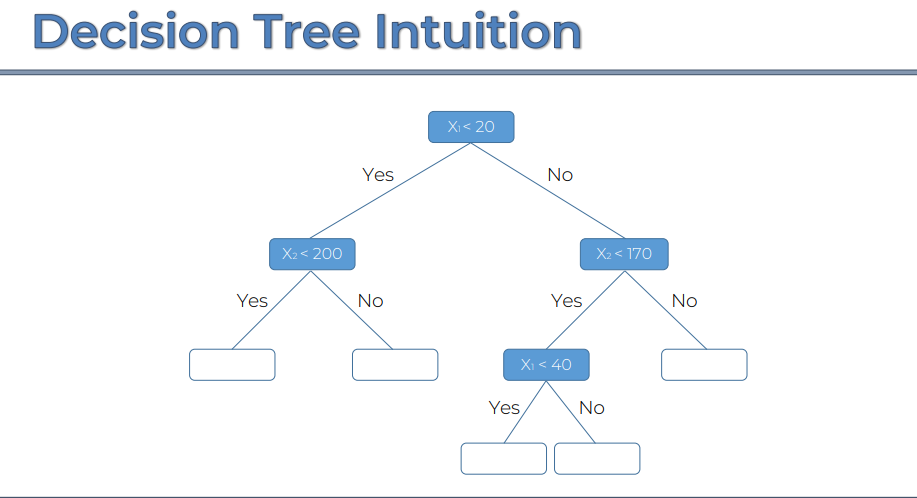

- Now le'slook at the **3rd Dimension Data** that is our **Y Dependent Variable**.
- Now how does the **Information** that we know **Falls** ito the **Terminal Leaf**.

**REGRESSION TREES PREDICTION :**
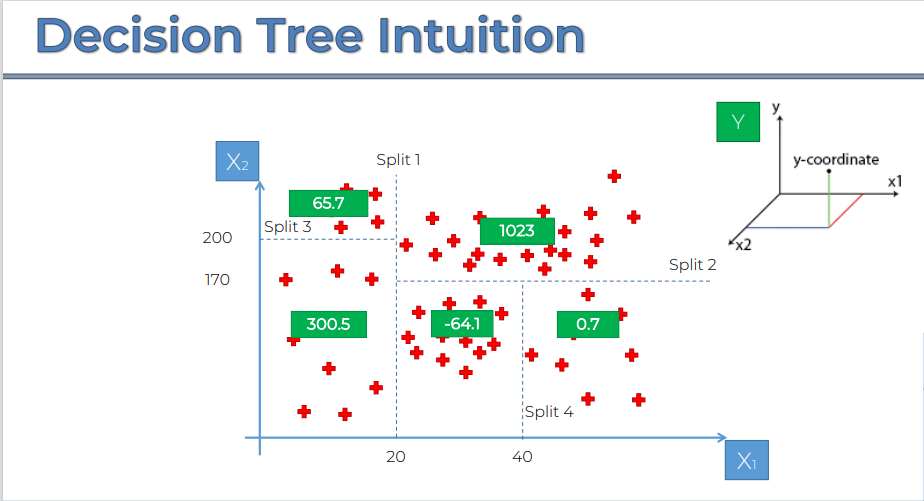

- It just takes the **Averages** of the each **Terminal Leaf**.
- So we take **Average** of **Y** for all these **Data Points** and that will be the **Value assigned** to any **New Data Point** that **Falls** on the **Terminal Leaves (Splits)**.
- For Example :
 - If **x1 = 30** and **x2 = 50**, then the **y_prediction** value will be on **-64.1**.
 - If it were to fall in any other **Terminal** then that's what the **Value** there would **Predict**.
- Just by taking **Average** of the **Splits** and **Assigns** the **New Data Point** value to it.

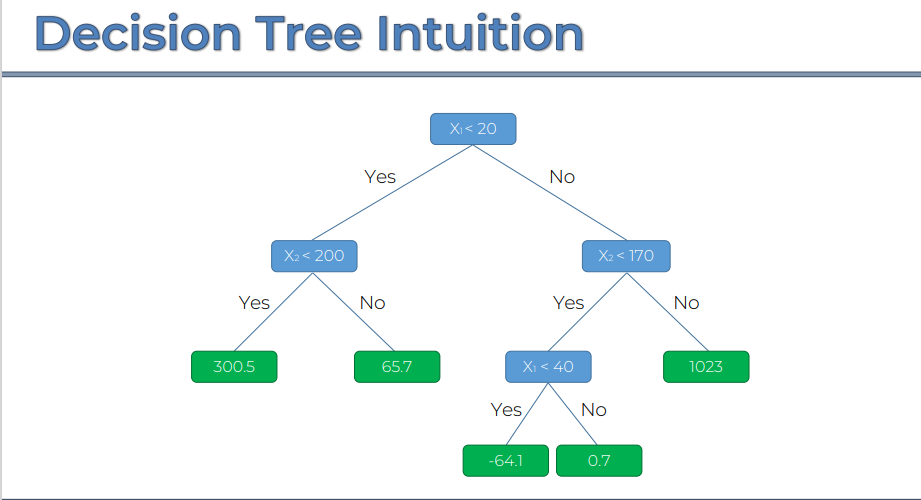

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
Data = pd.read_csv("/content/drive/MyDrive/CSV ML/Position_Salaries.csv")
Data

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000
5,Region Manager,6,150000
6,Partner,7,200000
7,Senior Partner,8,300000
8,C-level,9,500000
9,CEO,10,1000000


In [ ]:
X = Data.iloc[:, 1:-1]
X

,Level
0,1
1,2
2,3
3,4
4,5
5,6
6,7
7,8
8,9
9,10


In [ ]:
Y = Data.iloc[:, -1]
Y

0      45000
1      50000
2      60000
3      80000
4     110000
5     150000
6     200000
7     300000
8     500000
9    1000000
Name: Salary, dtype: int64

#### TRAINING DECISION TREE REGRESSION MODEL ON THE WHOLE DATASET

In [ ]:
from sklearn.tree import DecisionTreeRegressor
DT_R = DecisionTreeRegressor(random_state = 0)

In [ ]:
DT_R.fit(X, Y)

DecisionTreeRegressor(random_state=0)

#### PREDICTING A NEW RESULT

In [ ]:
DT_R.predict([[6.5]])

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


array([150000.])

#### VISUALISING THE DECISION TREE REGRESSION RESULTS

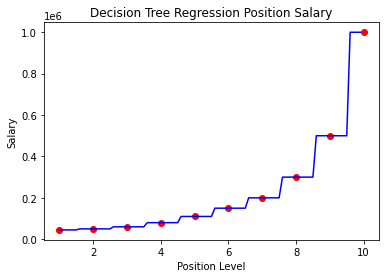

In [ ]:
X = Data.iloc[:, 1:-1].values
Y = Data.iloc[:, -1].values
DT_R.fit(X, Y)
X_grid = np.arange(min(X), max(X), 0.1)
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(X, Y, color = "red")
plt.plot(X_grid, DT_R.predict(X_grid), color = "blue")
plt.title("Decision Tree Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

### PART 6 : RANDOM FOREST REGRESSION

#### INTUITION

**ENSEMBLE LEARNING :**
- When we take **Multiple Machine Learning Algorithms** and put them together to create **One Bigger Machine Learning Algorithm**, So that the **ML Algorithm** the **final one** is actually using **leveraging**nmany different **ML Algorithm** and they can be **Same ML Algorithm** as we will see today.

**RANDOM FOREST :**
- Combines a **Lot** of **Decision Tree Method**.

**STEPS TO BUILD RANDOM FOREST REGRESSION :**
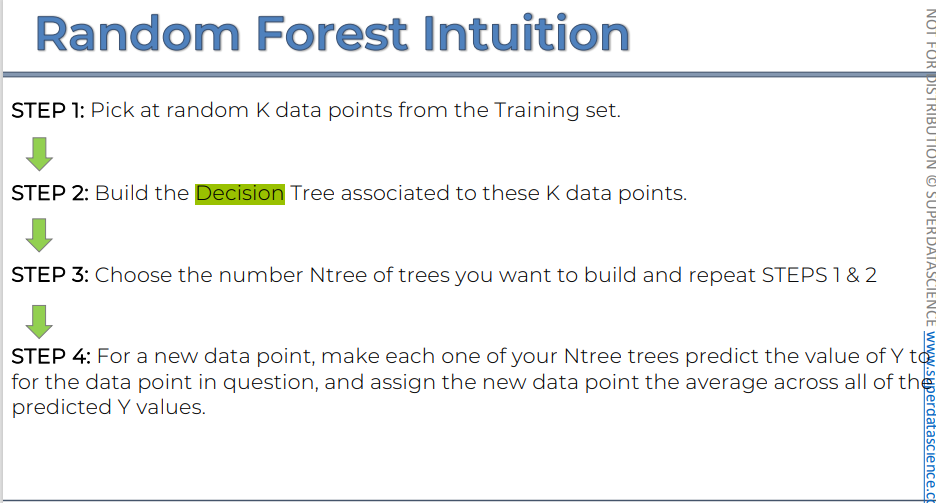

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
Data = pd.read_csv("/content/drive/MyDrive/CSV ML/Position_Salaries.csv")
Data

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000
5,Region Manager,6,150000
6,Partner,7,200000
7,Senior Partner,8,300000
8,C-level,9,500000
9,CEO,10,1000000


In [ ]:
X = Data.iloc[:, 1:-1]
X

,Level
0,1
1,2
2,3
3,4
4,5
5,6
6,7
7,8
8,9
9,10


In [ ]:
Y = Data.iloc[:, -1]
Y

0      45000
1      50000
2      60000
3      80000
4     110000
5     150000
6     200000
7     300000
8     500000
9    1000000
Name: Salary, dtype: int64

#### TRAINING RANDOM FOREST REGRESSION MODEL ON THE WHOLE DATASET

In [ ]:
from sklearn.ensemble import RandomForestRegressor
RF_R = RandomForestRegressor(n_estimators = 10, random_state = 0)

In [ ]:
RF_R.fit(X, Y)

RandomForestRegressor(n_estimators=10, random_state=0)

#### PREDICTING A NEW RESULT

In [ ]:
RF_R.predict([[6.5]])

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


array([167000.])

#### VISUALISING THE RANDOM FOREST REGRESSION RESULTS

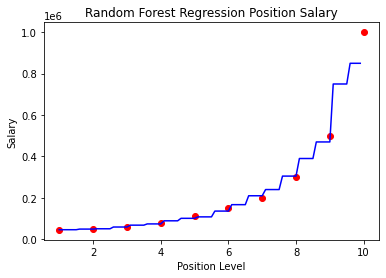

In [ ]:
X = Data.iloc[:, 1:-1].values
Y = Data.iloc[:, -1].values
RF_R.fit(X, Y)
X_grid = np.arange(min(X), max(X), 0.1)
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(X, Y, color = "red")
plt.plot(X_grid, RF_R.predict(X_grid), color = "blue")
plt.title("Random Forest Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

### PART 7 : SUPPORT VECTOR REGRESSION

#### INTUITION

- Best will be getting the **Idea** and **Knowledge** on the **Concept** of **Support Vector Machine** and **Kernel SUpport Vector Machine Classification** and then coming to the ** Support Vector Regression**.

**SUPPORT VECTOR REGRESSION :**
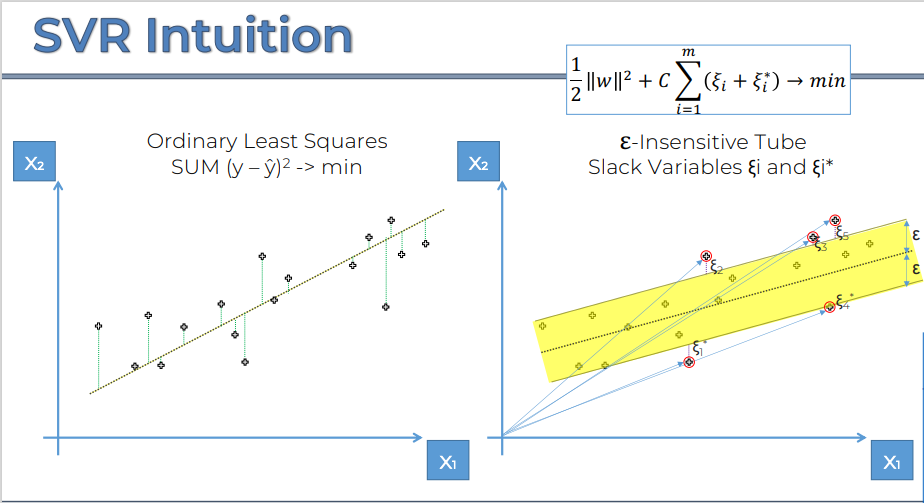

**DIFFERENCE BETWEEN LINEAR REGRESSION AND SUPPORT VECTOR REGRESSION :**
- **LINEAR REGRESSION :**
 - In **Linear Regression** the **line** is estimated by the **Ordinary Least Square Method**.
 - The **Aim** of **Linear Regression** is to **Minimize** the **Sum Of The Error**.


**SUPPORT VECTOR REGRESSION :**
- **Intensive Tube** - It is also called as ** Width of Epsilon**.
- Any **Point** value **Inside** the **Tube**, the **Error** will be **Disregarded**.
- The **Point** values in **Outside** the **Tube** will be **Taken Care** for the **Error**.
- The **Aim** of the **Algorithm** is to **Minimized** the **Value** for the the **Formula**.
- The **Slack Variables :**
 - **Ei - Error Points Above the Tube**
 - **E*i - Error Points Below the Tube**
- The **Points** present **Outside** the **Tube** are **Support Vectors**.
- They are **Supporting** or **Formation** of the **Tube**.


**NON LINEAR SVR :**
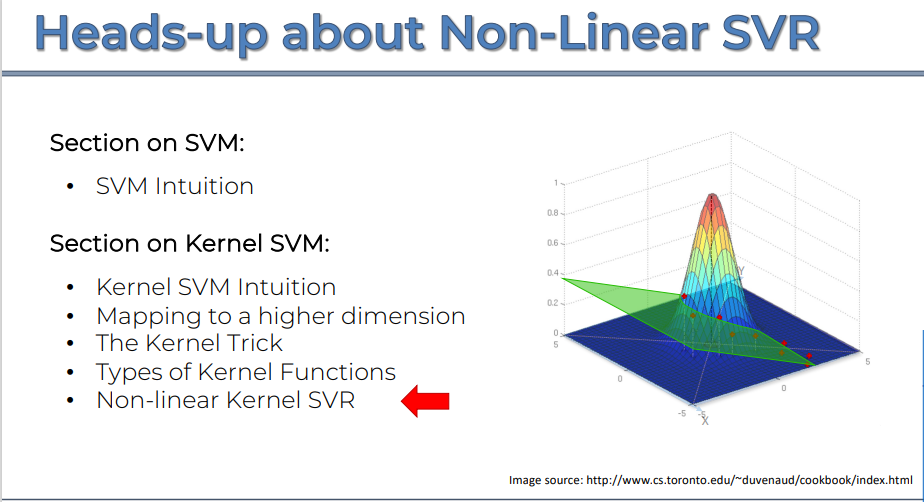
- There are also **Non Linear Model** for the **Support Vector Regression**.
- This is how it looks like.

**NON LINEAR KERNEL SVR :**

- Lets consider a dataset have points like this.
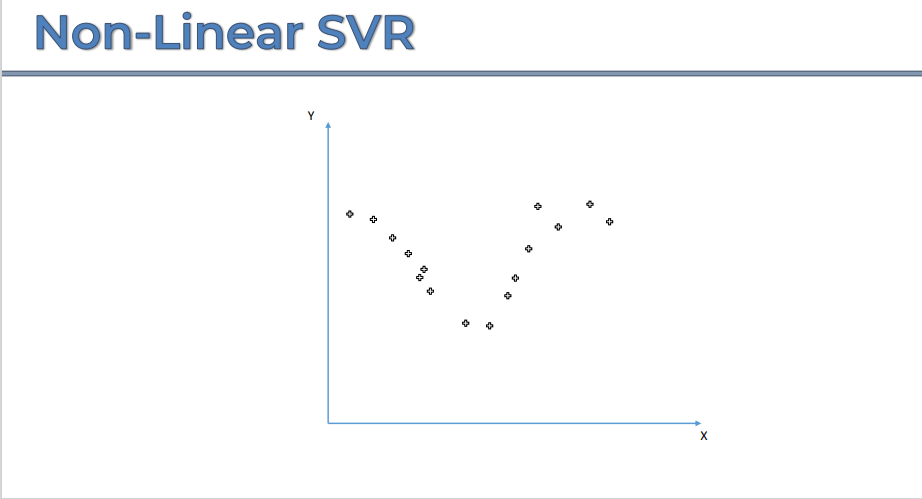

- Fitting a Linear SVR will not be fitted to the Data points.
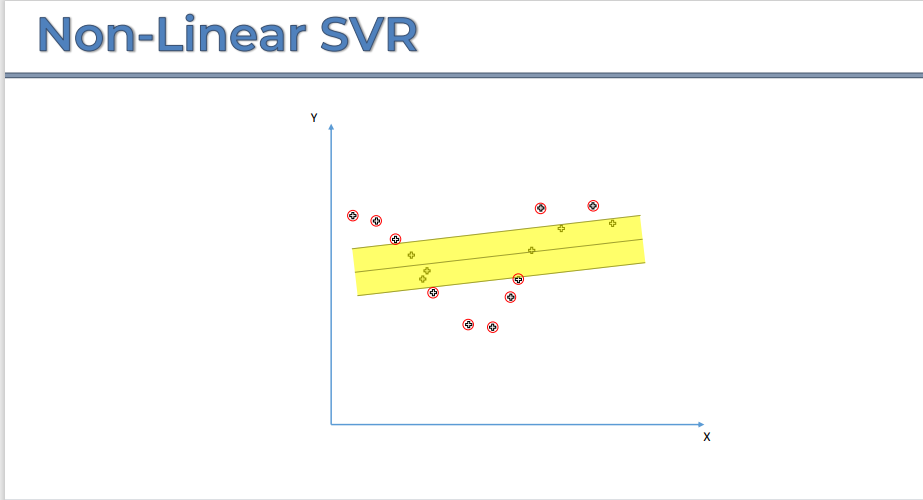

- Now lets map the dataset to the higher dimensional in step by step.
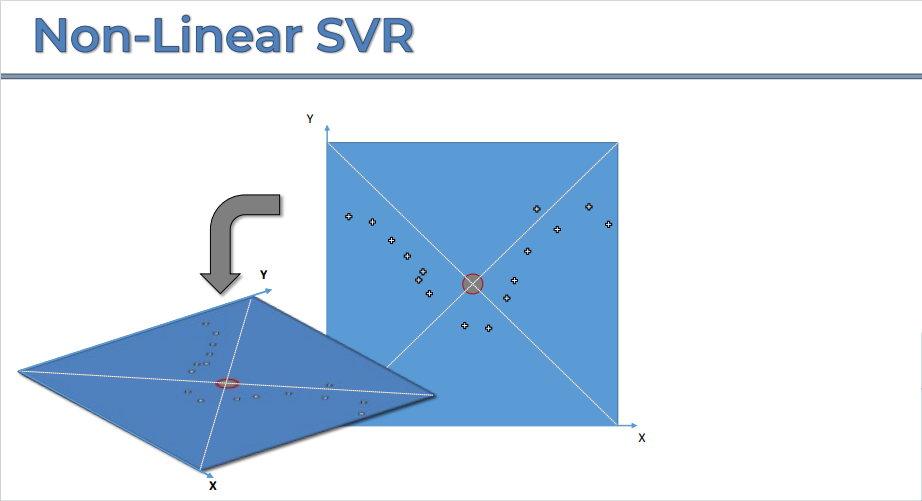

- Projecting RBF Kernel into the Dataset.
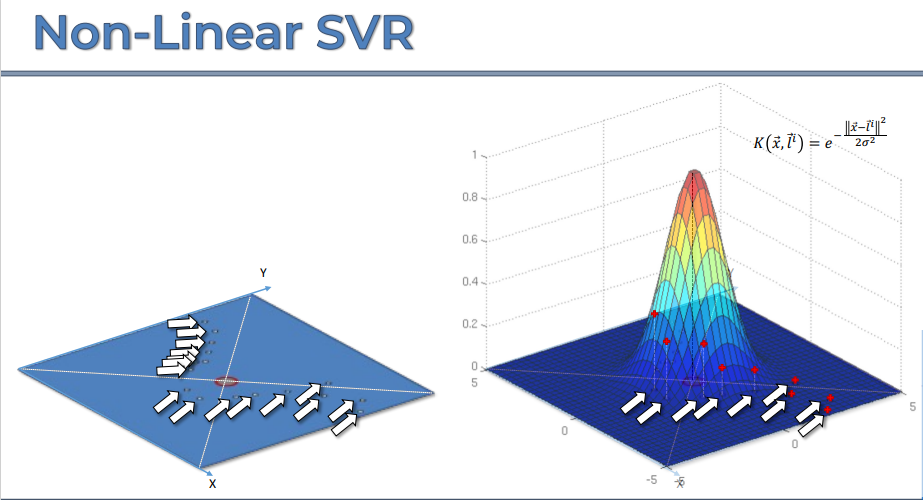

- Now after nappinf the Dataset in RBF kernel.
- We will get the hyper plane for the kernel.
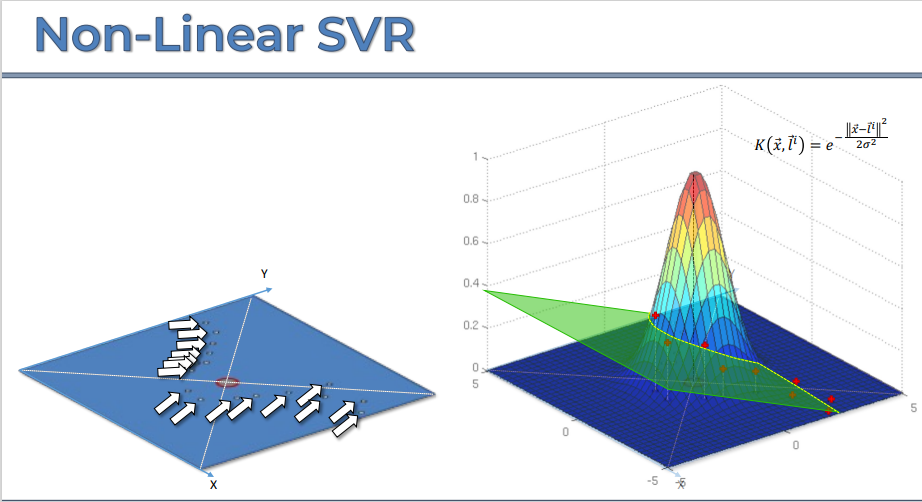

- Now we will draw the Intersect for the Hyper palne and RBF Kernel.
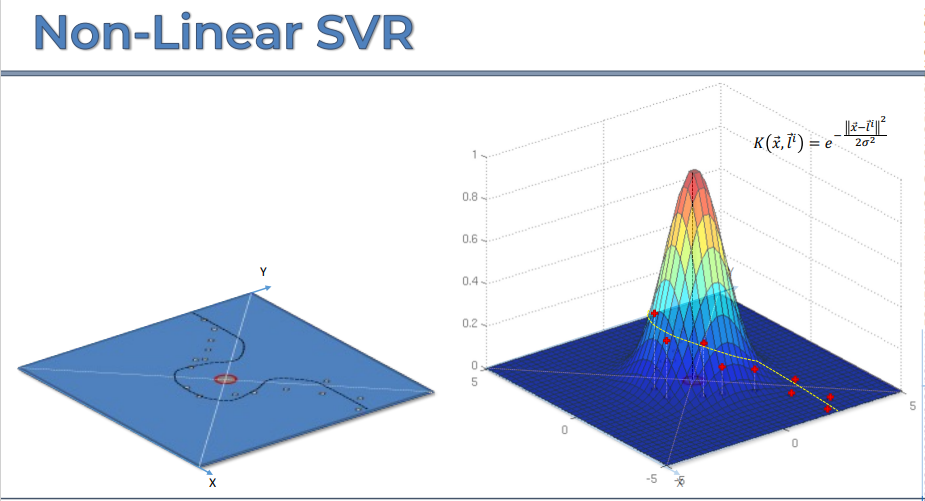

- Similar to the Linear SVR we are having the points above and below Margin plane.
- The points below Margin Plane will be considered as **E*i** error.
- The points above the Margin Plane will be considered as **Ei** error.
- And rest of the Intuition will be same as the SVM and SVR.

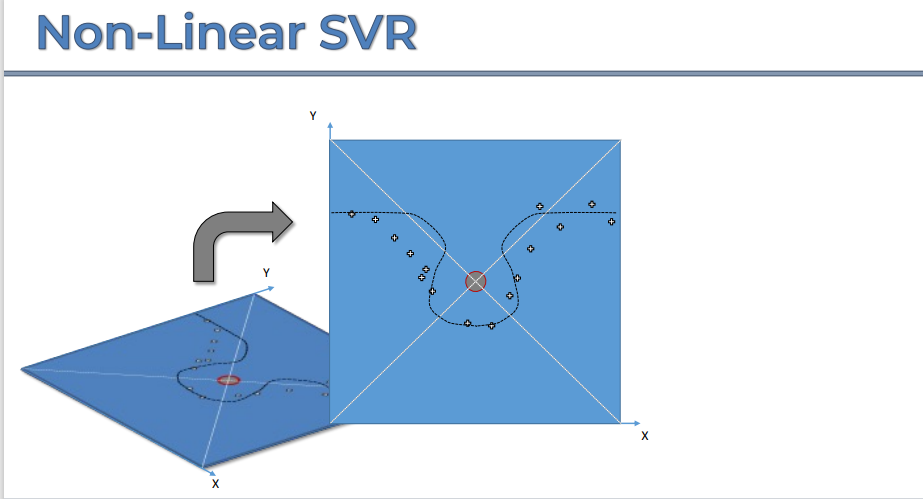

- After projecting back to the 2 dimensional spac we will get our regression plot for the Dataset.
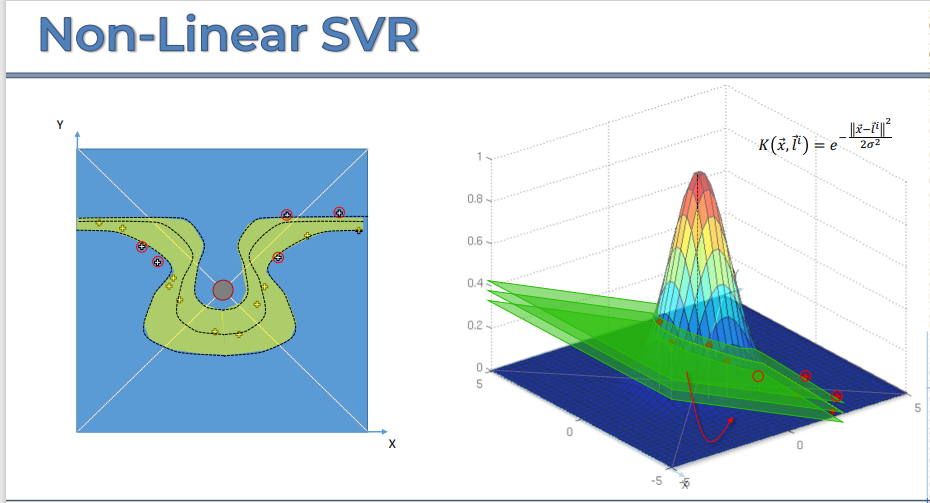

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Position_Salaries.csv")
data

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000
5,Region Manager,6,150000
6,Partner,7,200000
7,Senior Partner,8,300000
8,C-level,9,500000
9,CEO,10,1000000


In [ ]:
X = data.iloc[:, 1:-1]
X

,Level
0,1
1,2
2,3
3,4
4,5
5,6
6,7
7,8
8,9
9,10


In [ ]:
Y = data.iloc[:, -1].values
Y = Y.reshape(len(Y), 1)
Y = pd.DataFrame(Y, columns = ["Salaries"])
Y

,Salaries
0,45000
1,50000
2,60000
3,80000
4,110000
5,150000
6,200000
7,300000
8,500000
9,1000000


#### FEATURE SCALING 

- We apply **Feature Scaling**, because in **SVR Model** we don't have this **Explicit Equation** of the **Dependent Variable** with respect to the **Features**. 
- Mostly there are not those, you know **Coefficients Multiplying** each of the **Features** and therefore, not compensating with **Lower Values** for the **Features** taking **High Values**.
- **SVR model** has **implicit** equations in the **Dependent Variable** with respect to the **Features**.

In [ ]:
from sklearn.preprocessing import StandardScaler
SC_X = StandardScaler()
SC_Y = StandardScaler()

In [ ]:
X = SC_X.fit_transform(X)
X

array([[-1.5666989 ],
       [-1.21854359],
       [-0.87038828],
       [-0.52223297],
       [-0.17407766],
       [ 0.17407766],
       [ 0.52223297],
       [ 0.87038828],
       [ 1.21854359],
       [ 1.5666989 ]])

In [ ]:
Y = SC_Y.fit_transform(Y)
Y

array([[-0.72004253],
       [-0.70243757],
       [-0.66722767],
       [-0.59680786],
       [-0.49117815],
       [-0.35033854],
       [-0.17428902],
       [ 0.17781001],
       [ 0.88200808],
       [ 2.64250325]])

#### TRAINING SUPPORT VECTOR REGRESSION MODEL ON THE WHOLE DATASET

In [ ]:
from sklearn.svm import SVR
SV_R = SVR(kernel = 'rbf')

In [ ]:
SV_R.fit(X, Y)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVR()

#### PREDICTING A NEW RESULT

In [ ]:
SC_Y.inverse_transform(SV_R.predict(SC_X.transform([[6.5]])).reshape(-1, 1))

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


array([[170370.0204065]])

#### VISUALISING THE SUPPORT VECTOR REGRESSION RESULTS

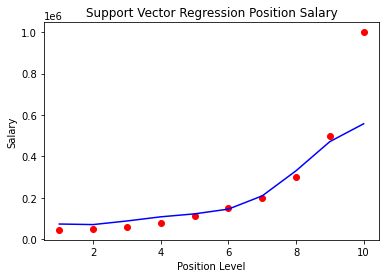

In [ ]:
plt.scatter(SC_X.inverse_transform(X), SC_Y.inverse_transform(Y), color = 'red')
plt.plot(SC_X.inverse_transform(X), SC_Y.inverse_transform(SV_R.predict(X).reshape(-1, 1)), color = 'blue')
plt.title("Support Vector Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

#### VISUALISING THE SUPPORT VECTOR REGRESSION RESULTS HIGH RESOLUTION

/usr/local/lib/python3.8/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


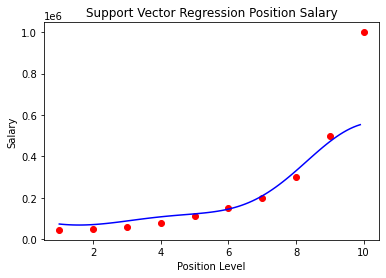

In [ ]:
X = data.iloc[:, 1:-1].values
Y = data.iloc[:, -1].values
Y = Y.reshape(len(Y), 1)
X = SC_X.fit_transform(X)
Y = SC_Y.fit_transform(Y)
SV_R.fit(X, Y)
X_grid = np.arange(min(SC_X.inverse_transform(X)), max(SC_X.inverse_transform(X)), 0.1)
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(SC_X.inverse_transform(X), SC_Y.inverse_transform(Y), color = "red")
plt.plot(X_grid, SC_Y.inverse_transform(SV_R.predict(SC_X.transform(X_grid)).reshape(-1, 1)), color = "blue")
plt.title("Support Vector Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

### PART 8 : EVALUATING REGRESSION MODELS PERFORMANCE

#### R - SQUARE METRIC

##### R - SQUARED

**R - SQUARED :**
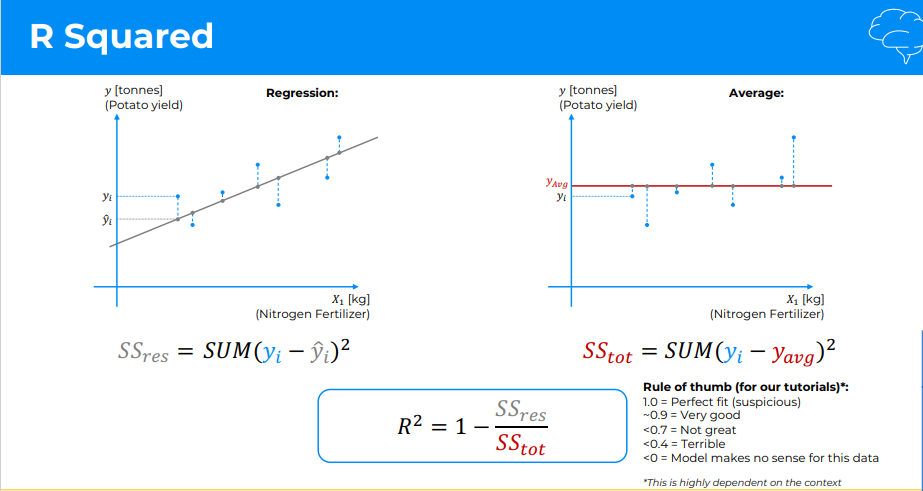

- **R-Square** is used to **evaluate** the **goodness of fit** to the **model**.
- **SSres - Residual Sum of Squares**. 
 - It is **caculated** by **Subracting** the **Actual Y - Yi** value with the **Predicted Y - Y^** value.
- **SStot - Total Sum of Squares**.
 - It is **caculated** by **Subracting** the **Actual Y - Yi** value with the **Average Y - Yavg** value.
- **SSres** is usually less that **SStot** in the most of the case.
- **R-Square** value will be something **equal** to the **value** between **0** and **1**.
- So the **lesser** the **SSres** then **greater** will be the **R-Square**.

##### R - SQUARE : CODING

In [ ]:
from sklearn.metrics import r2_score
# r2_score(Y_pred, Y_test)

##### ADJUSTED R - SQUARED

**ADJUSTED R - SQUARED :**
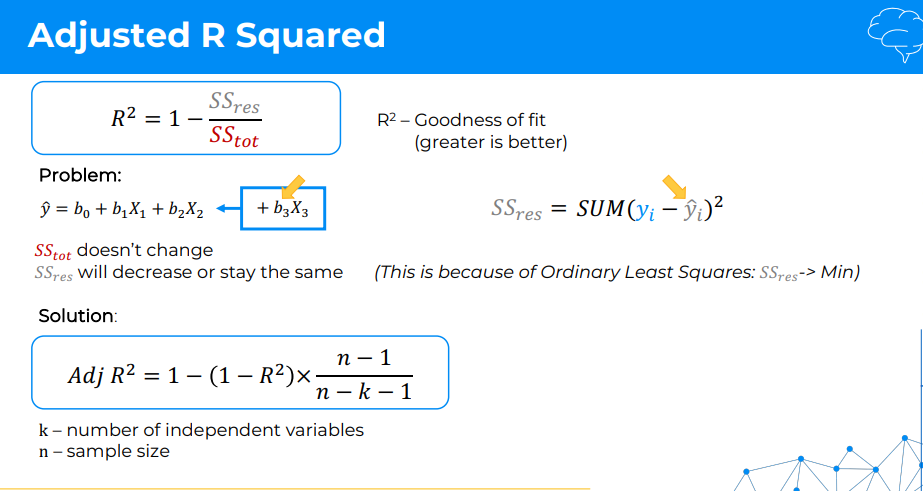

- The real problem of **R-Square** comes while adding **New Independent Variables**.
- When we add **New Variable** to the **Model**, 
 - The **SStot** will not **Change**.
 - The **SSres** will either **Decrease** or **Stay the Same**.
 - This is because the **Ordinary Least Square (OSL)** is going to look for **Coeff** of the **New Variable** that improves the **Y Prediction Value**.
 - As long it finds te better value the **SSres** will **Improve**.
 - But if the case where **OSL** cannot find the **Coeff** of the **New Variable** that improves the **Predictions**, then **OSL** will **assign** the value of **New Variable** to **0**.
 - This makes **Non Participation** of the **New Variable** in the **Method**, So this ends up in the situation where we can keep adding the **new variables** where it **does'nt adds** value to the **Algorithm**.
- **Adjusted R-Squared** is used to **solve** the **problem** faced in the **R-Squared**.
- It is about making sure that we only **add variables** when they bring **substantial improvement** to our **model**.


##### R - SQUARE and ADJUSTED R - SQUARE CODING

In [ ]:
import statsmodels.api as sm
X_addC = sm.add_constant(X)
result = sm.OLS(Y, X_addC).fit()
print(result.rsquared, result.rsquared_adj)
# 0.79180307318 0.790545085707

#### MEAN SQUARE METRIC

##### INTUITION

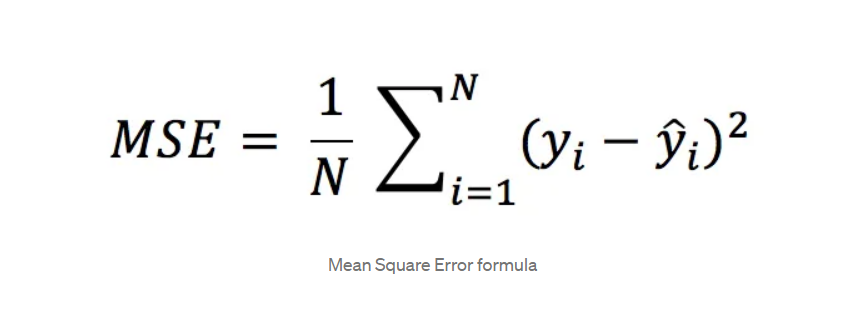

- While R Square is a relative measure of how well the model fits dependent variables.
- Mean Square Error is an absolute measure of the goodness for the fit.
- MSE is calculated by the sum of square of prediction error which is real output minus predicted output and then divide by the number of data points.
- Root Mean Square Error(RMSE) is the square root of MSE.
- It is used more commonly than MSE because firstly sometimes MSE value can be too big to compare easily.
- Secondly, MSE is calculated by the square of error, and thus square root brings it back to the same level of prediction error and makes it easier for interpretation.

##### MSE / RMSE CODING

In [ ]:
from sklearn.metrics import mean_squared_error
import math
print(mean_squared_error(Y_test, Y_predicted))
print(math.sqrt(mean_squared_error(Y_test, Y_predicted)))
# MSE: 2017904593.23
# RMSE: 44921.092965684235

### PART 9 : REGRESSION MODEL SELECTION

#### IMPORT LIBRARY

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("Copy The Data Path")
data

#### DATA INFO

In [ ]:
data.info()

In [ ]:
# Extracting Object Data :
Obj_List = [col for col in data.columns if data[col].dtype == "O"]
print("Object _Data : {}\n".format(Obj_List))

# Extracting Non-Object Data : 
Num_List = [col for col in data.columns if data[col].dtype != "O"]
print("Non-Object_Data :{}".format(Num_List))

In [ ]:
# Categorical Data

for col in data["Categorical Data"]:
  unique_vals = data[col].unique()
  print("\n{} : \n \n {} \n ---- \n".format(col, unique_vals))

In [ ]:
# Categorical Data

for col in data["Categorical Data"]:
  Value_Count = data[col].value_count()
  print("\n{} : \n \n {} \n ---- \n".format(col, Value_Count))

In [ ]:
# Visualization :

sns.countplot(data = data, x = "Column Name")
plt.title("Title of The Graph")
plt.xlabel("X Label")
plt.ylabel("Counts")
plt.show()

In [ ]:
# Visualization :

sns.countplot(data = data, y = "Column Name")
plt.title("Title of The Graph")
plt.xlabel("Counts")
plt.ylabel("Y Label")
plt.show()

#### CLEANING DATA

#### NULL TREATMENT

In [ ]:
Null_Columns = []
Null_Count = []
Null_Percentage = []
for col in data.columns:
  Null_Columns.append(col)
  Null_Count.append(data[col].isnull().sum())
  Null_Percentage.append((data[col].isnull().sum()*100/len(data[col])).round(2))

Null_Values = pd.DataFrame({"Null Columns" : Null_Columns, "Null Count" : Null_Count, "Null Percentage" : Null_Percentage})
Null_Values


In [ ]:
# # Drop Null values If Needed :

# data.dropna(subset = ["Column Names"], axis = 0, inplace = True)

In [ ]:
# # Replace Null values If Needed : 
# data.fillna(data["Column Name"].mean() or median() or mode() or Any_Number, inplace = True )

#### DUPLICATES TREATMENT

In [ ]:
data.columns.duplicated()

In [ ]:
# # Drop Dplicates If Needed :
# data.drop_duplicates(subset = ["Column Names"], inplace = True)

#### SUMMARY STATITSICS

In [ ]:
data.describe().T

#### GROUP-BY ANALYSIS

#### OUTLIER TREATMENT

#### ENCODING OBJECT DATA

#### TRAIN TEST SPLIT

In [ ]:
X = data.iloc[:, :-1]
X

In [ ]:
Y = data.iloc[:, -1]
Y

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

#### FEATURE SCALING

#### TRAINING DATASET ON REGRESSION MODELS

##### LINEAR REGRESSION 

##### RIDGE REGRESSION (L2 REGULARIZATION)

##### LASSO REGRESSION (L1 REGULARIZATION)

##### POLYNOMIAL REGRESSION

##### DECISION TREE REGRESSION

##### RANDOM FOREST REGRESSION

##### SUPPORT VECTOR REGRESSION

##### K-NEAREST NEIGHNORS REGRESSION

### PART 10 : REGRESSION PROS AND CONS 

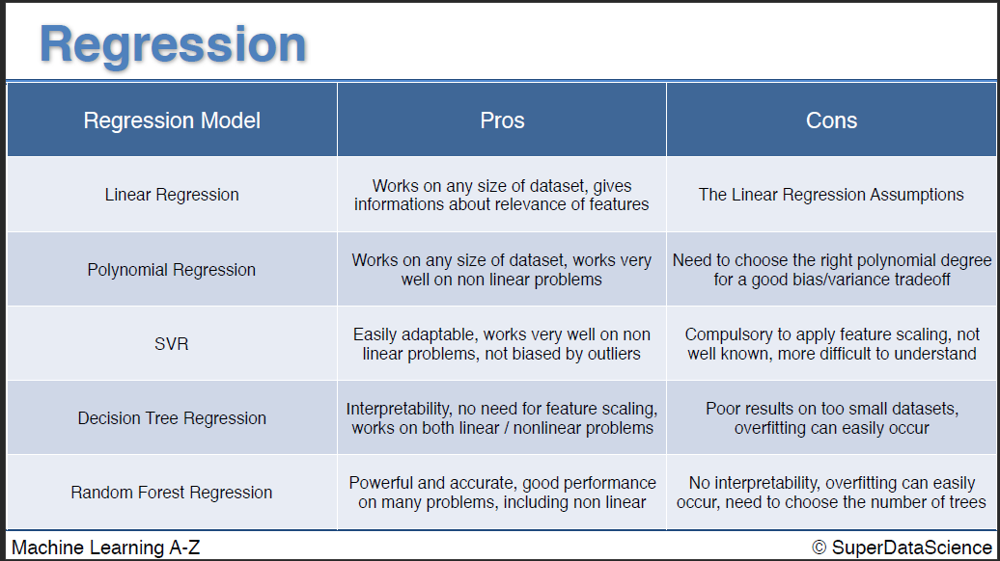

### PART 11 : REGULARIZATION METHODS

#### INTUITION

- **REGULARIZATION METHODS** are used to prevent the over-fitting the **Data** in the **Training Set**.

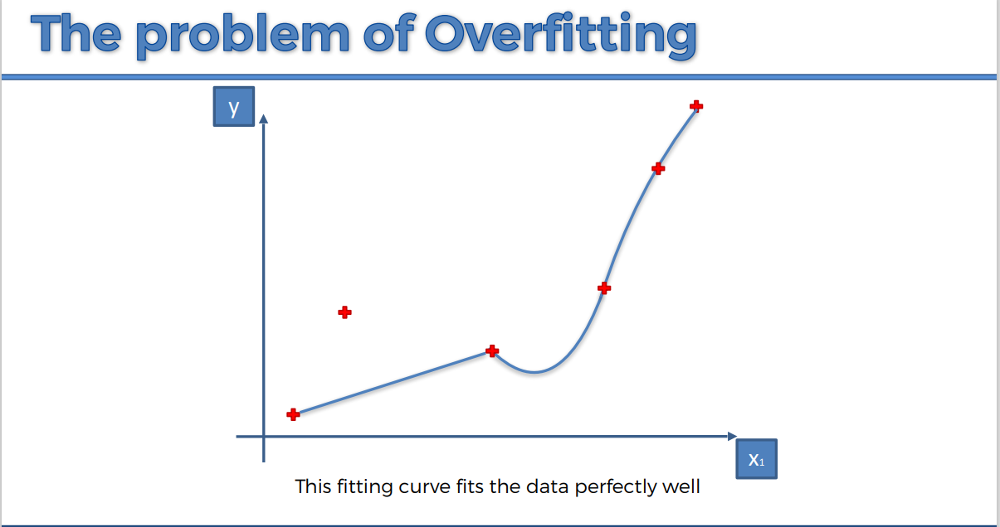

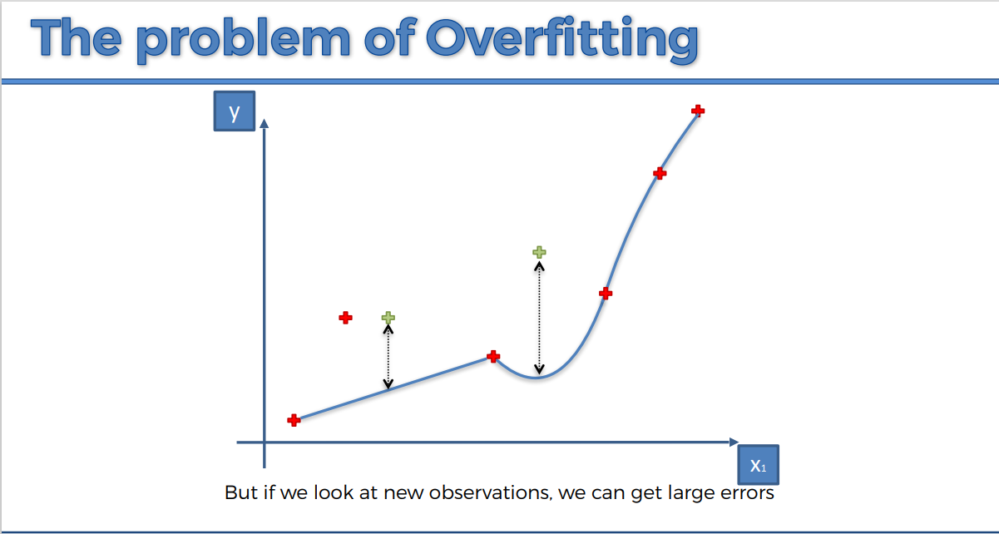

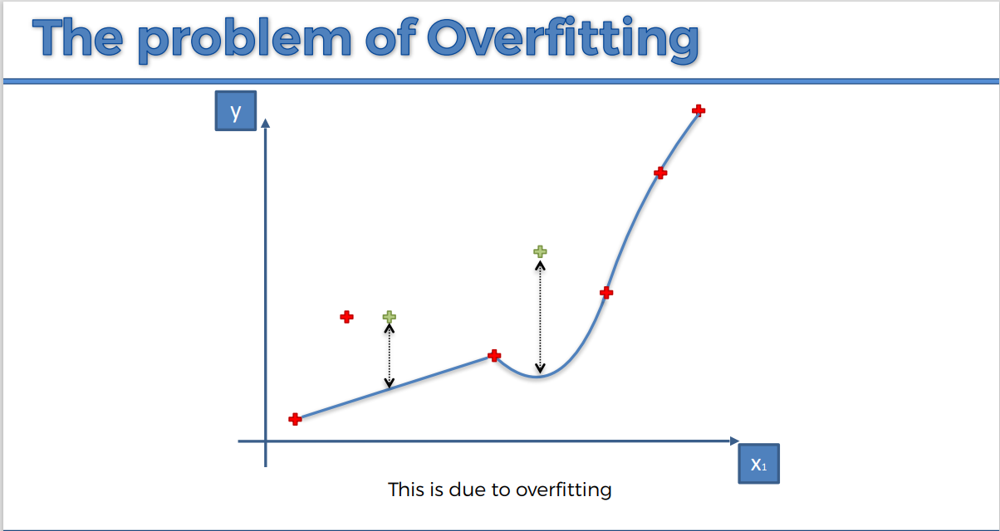

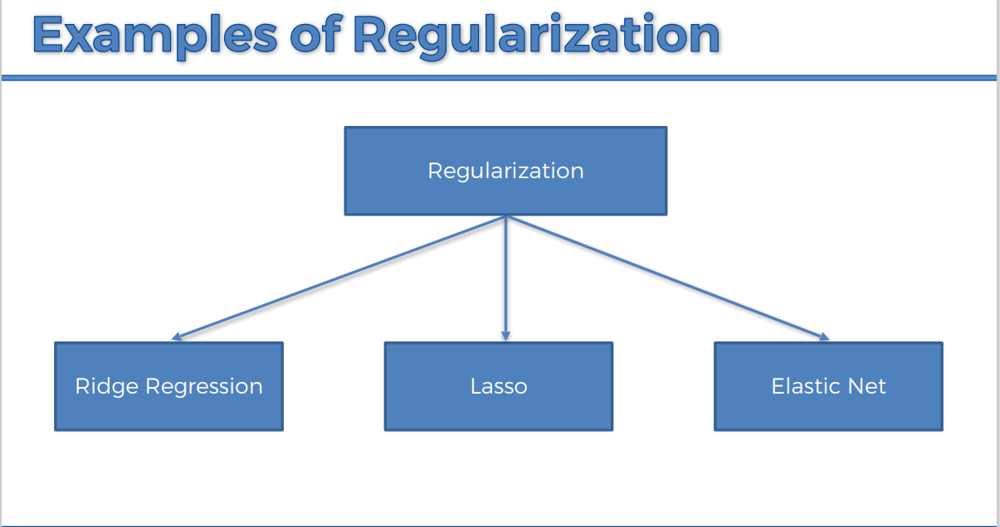

**AFTER REULARIZATION :**
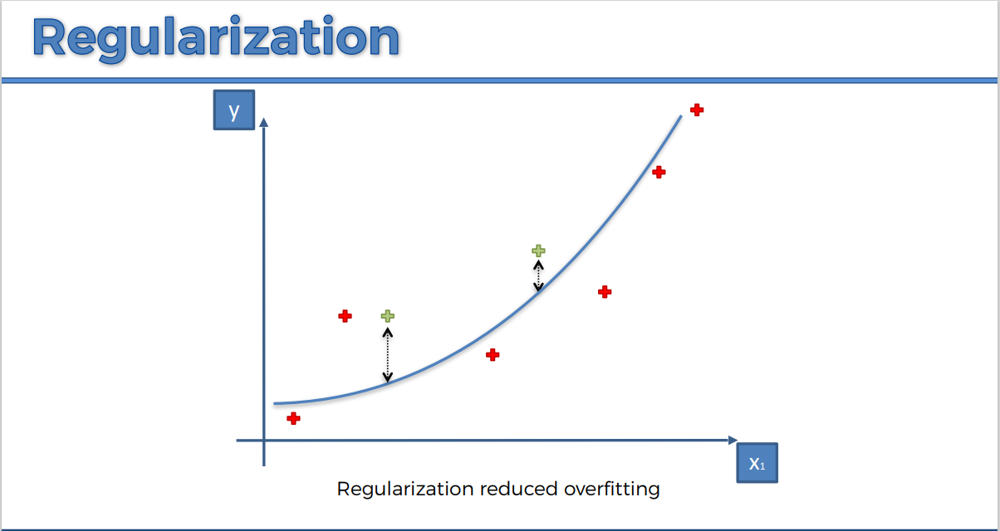

#### PART A : RIDGE REGRESSION L2 REGULARIZATION

##### INTUITION

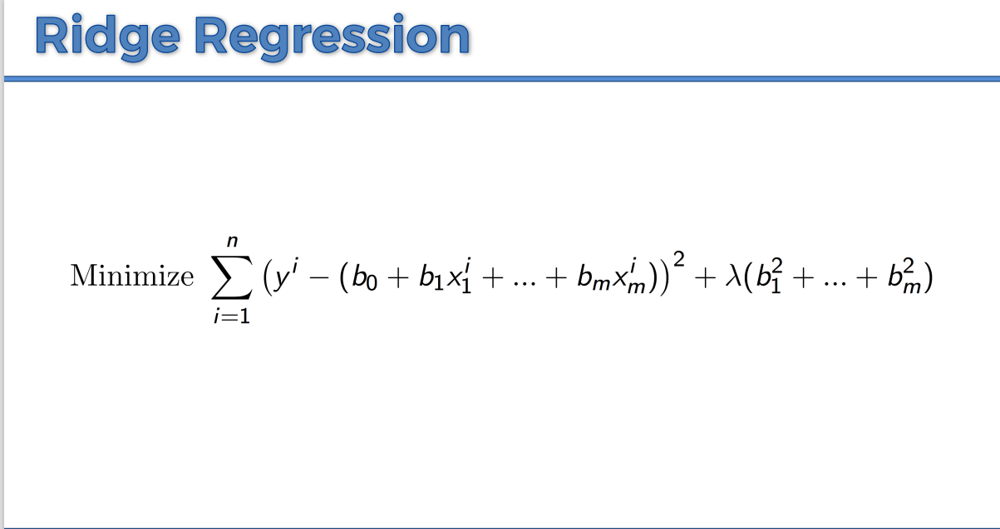

##### IMPORTING THE LIBRARIES:

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

##### IMPORTING THE DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Position_Salaries.csv")
data

,Position,Level,Salary
0,Business Analyst,1,45000
1,Junior Consultant,2,50000
2,Senior Consultant,3,60000
3,Manager,4,80000
4,Country Manager,5,110000
5,Region Manager,6,150000
6,Partner,7,200000
7,Senior Partner,8,300000
8,C-level,9,500000
9,CEO,10,1000000


In [ ]:
X = data.iloc[:, 1:-1]
X

,Level
0,1
1,2
2,3
3,4
4,5
5,6
6,7
7,8
8,9
9,10


In [ ]:
Y = data.iloc[:, -1]
Y 

0      45000
1      50000
2      60000
3      80000
4     110000
5     150000
6     200000
7     300000
8     500000
9    1000000
Name: Salary, dtype: int64

##### TRAINING LINEAR REGRESSION MODEL ON THE WHOLE DATASET

In [ ]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()

In [ ]:
LR.fit(X, Y)

LinearRegression()

##### TRAINING RIDGE REGRESSION MODEL ON THE WHOLE DATASET (L2 REGULARIZATION)

In [ ]:
from sklearn.kernel_ridge import KernelRidge
RR = KernelRidge(kernel = 'rbf')

In [ ]:
RR.fit(X, Y)

KernelRidge(kernel='rbf')

##### PREDICTING NEW RESULT WITH LINEAR REGRESSION

In [ ]:
LR.predict([[6.5]])

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([330378.78787879])

##### PREDICTING NEW RESULT WITH RIDGE REGRESSION

In [ ]:
RR.predict([[6.5]])

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KernelRidge was fitted with feature names
  warnings.warn(


array([111249.33391337])

##### VISUALISING THE LINEAR REGRESSION RESULT

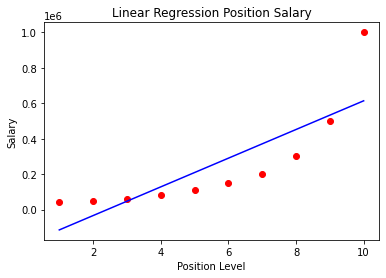

In [ ]:
plt.scatter(X, Y, color = 'red')
plt.plot(X, LR.predict(X), color = 'blue')
plt.title("Linear Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

##### VISUALISING THE RIDGE REGRESSION RESULT

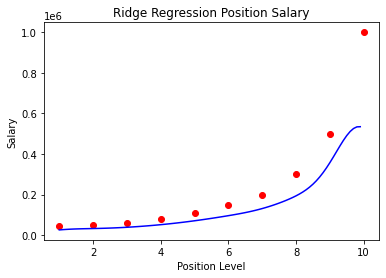

In [ ]:
X = data.iloc[:, 1:-1].values
Y = data.iloc[:, -1].values
RR.fit(X, Y)
X_grid = np.arange(min(X), max(X), 0.1)
X_grid = X_grid.reshape((len(X_grid), 1))
plt.scatter(X, Y, color = "red")
plt.plot(X_grid, RR.predict(X_grid), color = "blue")
plt.title("Ridge Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

#### PART B : LASSO REGRESSION L1 REGULARIZATION

##### INTUITION

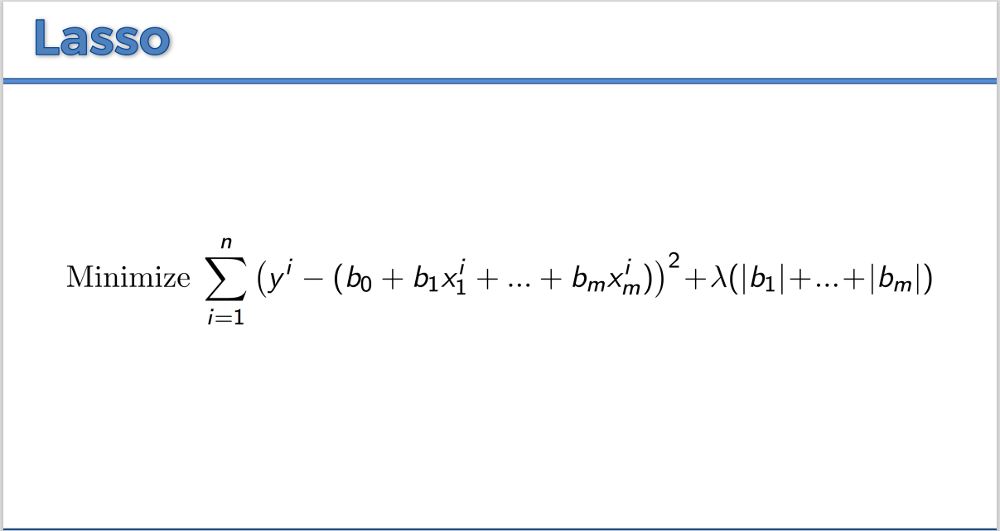

##### IMPORTING THE LIBRARIES:

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

##### IMPORTING THE DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Salary_Data.csv")
data

,YearsExperience,Salary
0,1.1,39343.0
1,1.3,46205.0
2,1.5,37731.0
3,2.0,43525.0
4,2.2,39891.0
5,2.9,56642.0
6,3.0,60150.0
7,3.2,54445.0
8,3.2,64445.0
9,3.7,57189.0


In [ ]:
X = data.iloc[:, :-1]
X

,YearsExperience
0,1.1
1,1.3
2,1.5
3,2.0
4,2.2
5,2.9
6,3.0
7,3.2
8,3.2
9,3.7


In [ ]:
Y = data.iloc[:, -1]
Y 

0      39343.0
1      46205.0
2      37731.0
3      43525.0
4      39891.0
5      56642.0
6      60150.0
7      54445.0
8      64445.0
9      57189.0
10     63218.0
11     55794.0
12     56957.0
13     57081.0
14     61111.0
15     67938.0
16     66029.0
17     83088.0
18     81363.0
19     93940.0
20     91738.0
21     98273.0
22    101302.0
23    113812.0
24    109431.0
25    105582.0
26    116969.0
27    112635.0
28    122391.0
29    121872.0
Name: Salary, dtype: float64

##### TRAINING LINEAR REGRESSION MODEL ON THE WHOLE DATASET

In [ ]:
from sklearn.linear_model import LinearRegression
LR = LinearRegression()

In [ ]:
LR.fit(X, Y)

LinearRegression()

##### TRAINING LASSO REGRESSION MODEL ON THE WHOLE DATASET (L1 REGULARIZATION)

In [ ]:
from sklearn.linear_model import Lasso

In [ ]:
Lasso_Reg = Lasso(alpha = 1)
Lasso_Reg.fit(X, Y)

Lasso(alpha=1)

In [ ]:
Lasso_Reg.score(X, Y)

0.9569566639667023

##### VISUALISING THE LINEAR REGRESSION RESULT

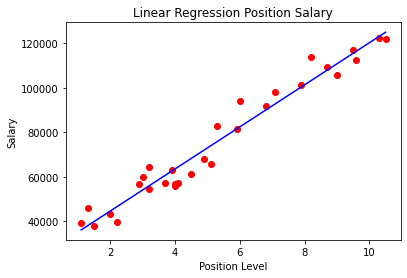

In [ ]:
plt.scatter(X, Y, color = 'red')
plt.plot(X, LR.predict(X), color = 'blue')
plt.title("Linear Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

##### VISUALISING THE LASSO REGRESSION RESULT

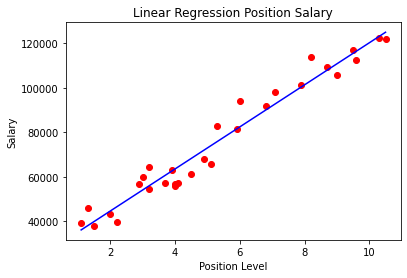

In [ ]:
plt.scatter(X, Y, color = 'red')
plt.plot(X, Lasso_Reg.predict(X), color = 'blue')
plt.title("Linear Regression Position Salary")
plt.xlabel("Position Level")
plt.ylabel("Salary")
plt.show()

##### PREDICTING NEW RESULT WITH LINEAR REGRESSION

In [ ]:
LR.predict([[6.5]])

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


array([87216.95528813])

##### PREDICTING NEW RESULT WITH LASSO REGRESSION

In [ ]:
Lasso_Reg.predict([[6.5]])

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:420: UserWarning: X does not have valid feature names, but Lasso was fitted with feature names
  warnings.warn(


array([87216.80286129])

### .
----

## CLASSIFICATION :

### INTRODUCTION

**What is Classification ?**
- It is a **machine learning** technique to **identify** the **new observation** based on the **training dataset**.

**Application :**
- **Churn Prediction :**
 - We have **customers** for the **business** and we would like to **predict** which are lkekly to **stay** and which are likely to **leave**.
 - This is also caled as **Churn Modelling**.
 - THis is vey **important** because we will be able to **predict** the **customers** who will **leave**our **business** i next **6 months**.
 - And then we can take **necessary steps** and provide them some **offer** or ask them for the **feedback** and make certai**changes** so that the **stay**.
- **Email Classification :**
 - We can **Classify** the **mails** based on the **Promotion Mail**, **Primary Mail**, **Important/Urgent Mail** and **Spam Mail**.
- **Image Classification :**
 - Images of **Dogs** and **Cats** can be **Classified** and will be able to **predict** which images are **Dogs** and Which are **Cats**.


### PART 12 : LOGISTIC REGRESSION

#### INTUITION

**EQUATION :**
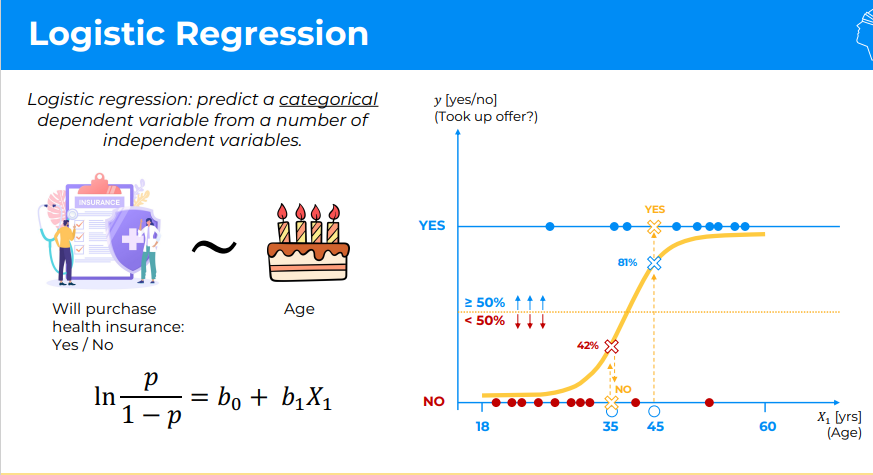

- **Logistic Regression Curve** is also known as **Sigmod Curve**.
- **p** - **Probability Value**.
- In **Logistic Regression** we **caculate** the **probability** of the **Output**.
 - The **Values** that are **Above** the **Treshold Value** belongs to the **Class Yes**.
 - The **Values** that are **Below** the **Treshold Value** belongs to the **Class No**. 

**LOGISTIC REGRESSION COEFF :**
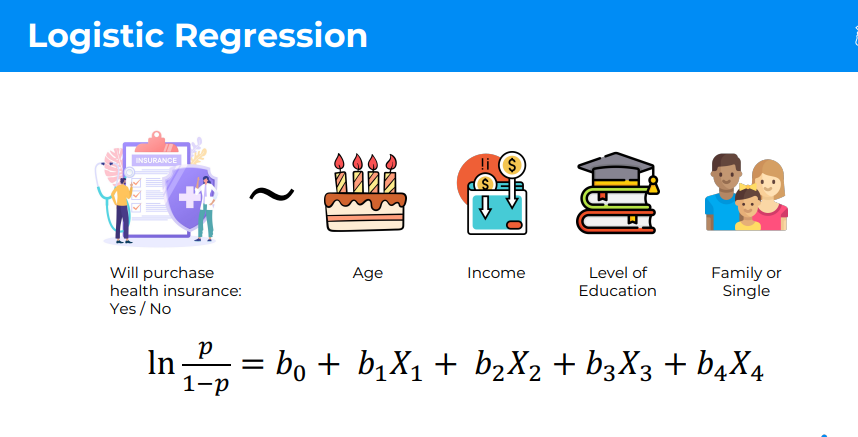

- Similar to the **Multiple Regression**.

**MAXIMUM LIKLIHOOD :**
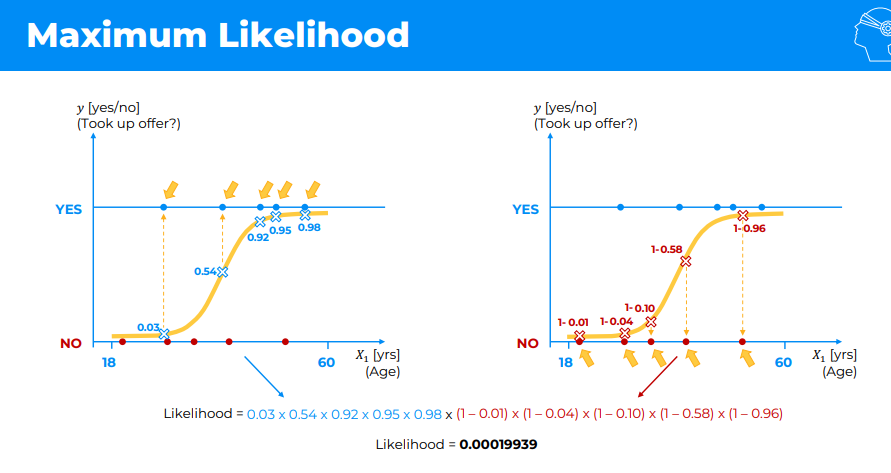

- We will start looking at each **Data Points**.
- First we will look at the **data points** of **class Yes**.
- Finding out the **data point** over that measurement what would have this **Logistic Regression Curve** that we are considering what **prediction** it would have made.
- Thus **probability** is caculated.
- Similarly we will do this for all the **data points** over the **class Yes**.
- Now Lets start taking ito consideration of **class No**.
- Same procedure is followed, and here **probability** caculation is done with **1-p**.
- And Finally the **values** that we obtained from both **class Yes** and **class No** is **multiplied**.
- the **Final Value** is called **Maximum Liklihood value**.

**MAXIMUM LIKLIKHOOD EVALUATION :**
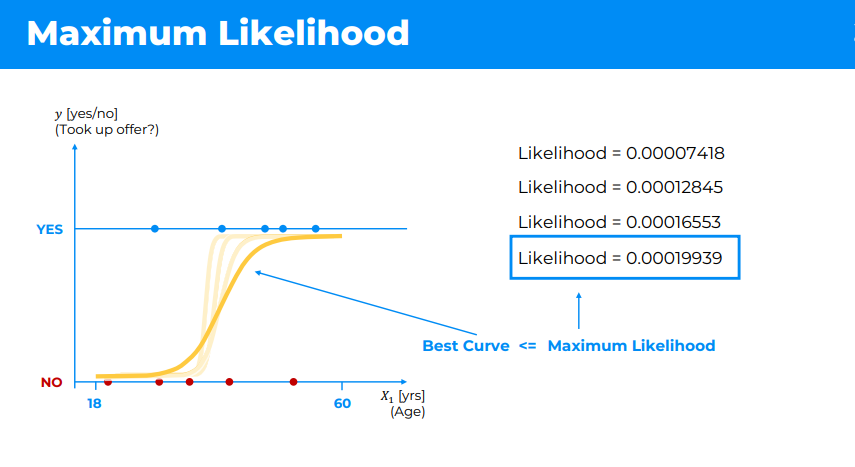

- This procedure of obtaining **maximum likliood** is repeated with **various possible fit curve**.
- **Larger** the **value** of **Maximum Liklihood** is considered as **Best Fit Curve** for the **Logistic Regression Model**.

#### IMPORTING THE LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORTING THE DATASET

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Social_Network_Ads.csv")

In [ ]:
df

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0
...,...,...,...
395,46,41000,1
396,51,23000,1
397,50,20000,1
398,36,33000,0


In [ ]:
X = df.iloc[:, :-1]
X

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000
...,...,...
395,46,41000
396,51,23000
397,50,20000
398,36,33000


In [ ]:
Y = df.iloc[:, -1]
Y

0      0
1      0
2      0
3      0
4      0
      ..
395    1
396    1
397    1
398    0
399    1
Name: Purchased, Length: 400, dtype: int64

#### TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [ ]:
X_train

,Age,EstimatedSalary
250,44,39000
63,32,120000
312,38,50000
159,32,135000
283,52,21000
...,...,...
323,48,30000
192,29,43000
117,36,52000
47,27,54000


In [ ]:
Y_train

250    0
63     1
312    0
159    1
283    1
      ..
323    1
192    0
117    0
47     0
172    0
Name: Purchased, Length: 300, dtype: int64

In [ ]:
X_test

,Age,EstimatedSalary
132,30,87000
309,38,50000
341,35,75000
196,30,79000
246,35,50000
...,...,...
146,27,96000
135,23,63000
390,48,33000
264,48,90000


In [ ]:
Y_test

132    0
309    0
341    0
196    0
246    0
      ..
146    1
135    0
390    1
264    1
364    1
Name: Purchased, Length: 100, dtype: int64

#### FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [ ]:
X_train = pd.DataFrame(sc.fit_transform(X_train), columns = ["Age", "Salary"])
X_train

,Age,Salary
0,0.581649,-0.886707
1,-0.606738,1.461738
2,-0.012544,-0.567782
3,-0.606738,1.896635
4,1.373907,-1.408584
...,...,...
295,0.977778,-1.147645
296,-0.903834,-0.770734
297,-0.210609,-0.509796
298,-1.101899,-0.451810


In [ ]:
X_test = pd.DataFrame(sc.transform(X_test), columns = ["Age", "Salary"])
X_test

,Age,Salary
0,-0.804802,0.504964
1,-0.012544,-0.567782
2,-0.309641,0.157046
3,-0.804802,0.273019
4,-0.309641,-0.567782
...,...,...
95,-1.101899,0.765902
96,-1.498028,-0.190872
97,0.977778,-1.060666
98,0.977778,0.591943


#### TRAINING LOGISTIC REGRESSION MODEL (TRAINING SET)

In [ ]:
from sklearn.linear_model import LogisticRegression
LC = LogisticRegression(random_state = 0)

In [ ]:
LC.fit(X_train, Y_train)

LogisticRegression(random_state=0)

#### PREDICTING A NEW RESULT (FROM TEST SET)

In [ ]:
print(LC.predict(sc.transform([[30, 87000]])))

[0]


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


#### PREDICTING TEST SET

In [ ]:
Y_pred = LC.predict(X_test)
Y_pred

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1])

In [ ]:
Y_pred = pd.DataFrame(Y_pred, columns = ["Purchased Predicted"])
Y_pred

,Purchased Predicted
0,0
1,0
2,0
3,0
4,0
...,...
95,0
96,0
97,0
98,1


#### COMPARING PREDICTION VS ACTUAL 

In [ ]:
Test_Set = X_test.join(pd.DataFrame(np.array(Y_test)))
Test_Set

,Age,Salary,0
0,-0.804802,0.504964,0
1,-0.012544,-0.567782,0
2,-0.309641,0.157046,0
3,-0.804802,0.273019,0
4,-0.309641,-0.567782,0
...,...,...,...
95,-1.101899,0.765902,1
96,-1.498028,-0.190872,0
97,0.977778,-1.060666,1
98,0.977778,0.591943,1


In [ ]:
Compare_Data = Test_Set.join(Y_pred)
Compare_Data

,Age,Salary,0,Purchased Predicted
0,-0.804802,0.504964,0,0
1,-0.012544,-0.567782,0,0
2,-0.309641,0.157046,0,0
3,-0.804802,0.273019,0,0
4,-0.309641,-0.567782,0,0
...,...,...,...,...
95,-1.101899,0.765902,1,0
96,-1.498028,-0.190872,0,0
97,0.977778,-1.060666,1,0
98,0.977778,0.591943,1,1


#### MAKING CONFUSION MATRIX

- The **Confusion Matrix** will show us the number of **correct predictions** and the number of **incorrect predictions** fot the **two cases : 0, 1**.

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(Y_test, Y_pred)

In [ ]:
cm

array([[65,  3],
       [ 8, 24]])

**VISUALIZING CONFUSION MATRIX :**

Text(33.0, 0.5, 'ACTUAL LABEL')

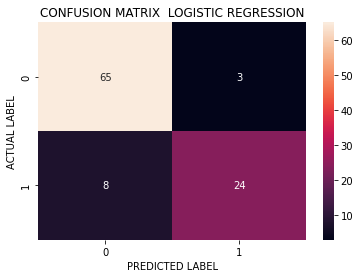

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True)
plt.title("CONFUSION MATRIX  LOGISTIC REGRESSION")
plt.xlabel("PREDICTED LABEL")
plt.ylabel("ACTUAL LABEL")

In [ ]:
accuracy_score(Y_test, Y_pred)

0.89

#### VISUALIZING THE TRAINING SET

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


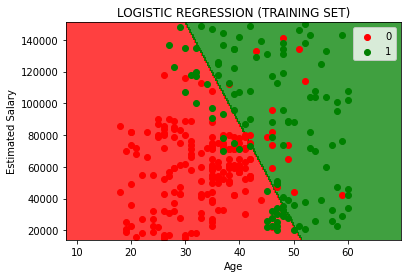

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_train), Y_train.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, LC.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("LOGISTIC REGRESSION (TRAINING SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


#### VISUALIZING THE TEST SET

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


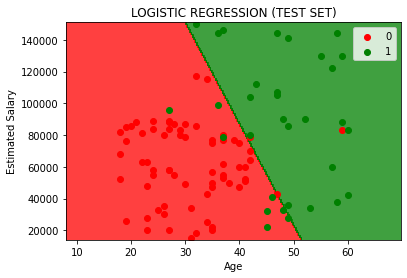

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_test), Y_test.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, LC.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("LOGISTIC REGRESSION (TEST SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


### PART 13 : KNN (K-NEAREST NEIGHBOR) - CLASSIFICATION

#### INTUITION

**AIM :** 
- The **aim of the Algorithm** is to determine the **unknown data point** to which **category** it falls.

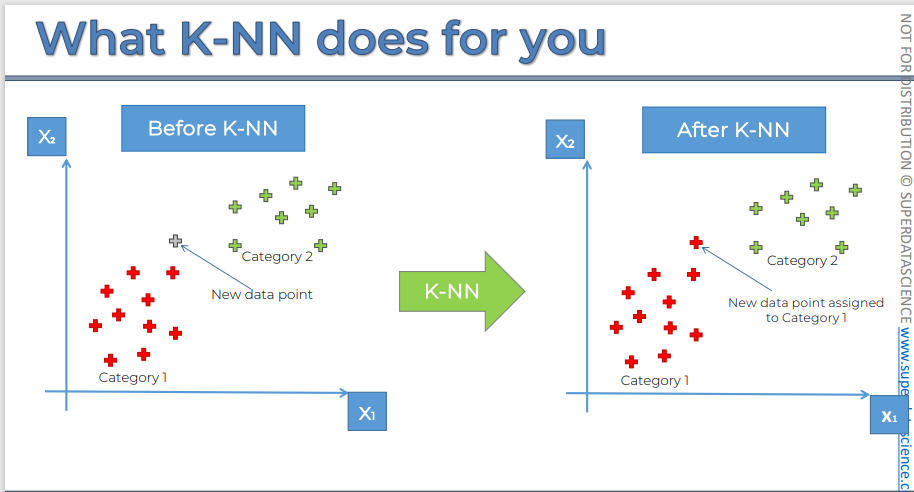

- In this case we have **two categories** that is **red category** and **green category**.
- Now the **algorithm** will determine the **category** of the **unknown data point**.
- And especiallly in this case **data point** falls on **red category**.


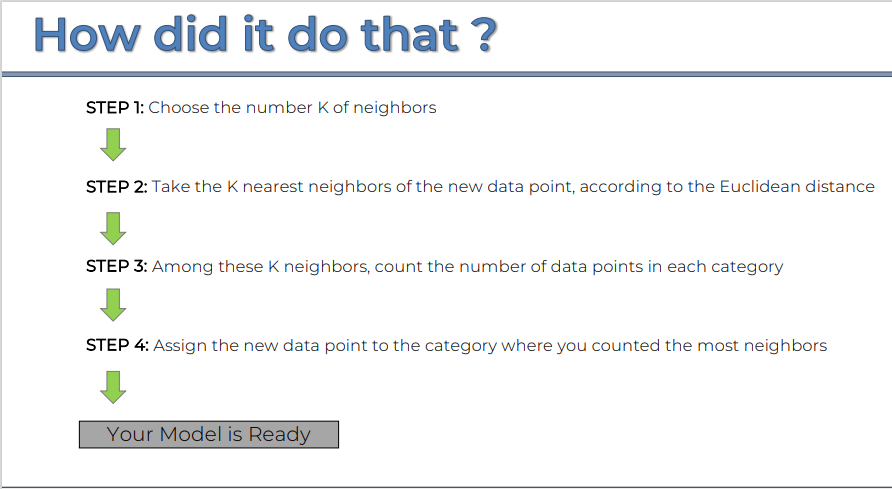

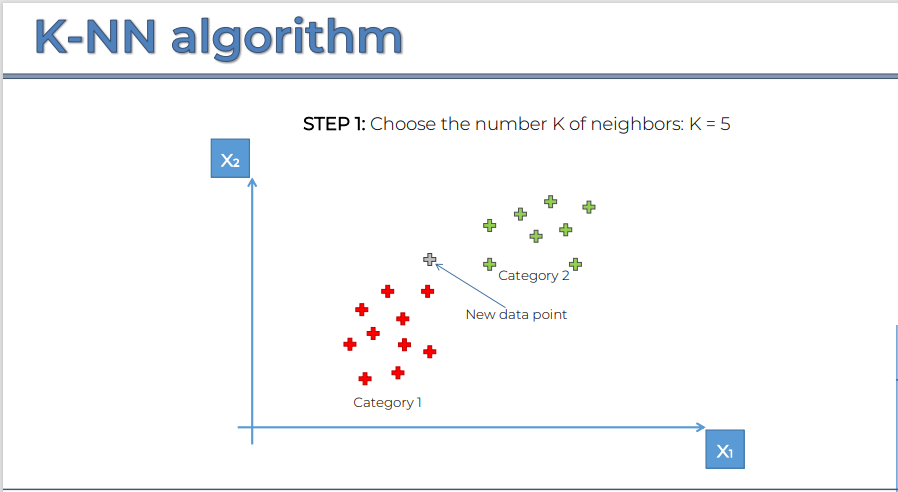

**EQUATION :**
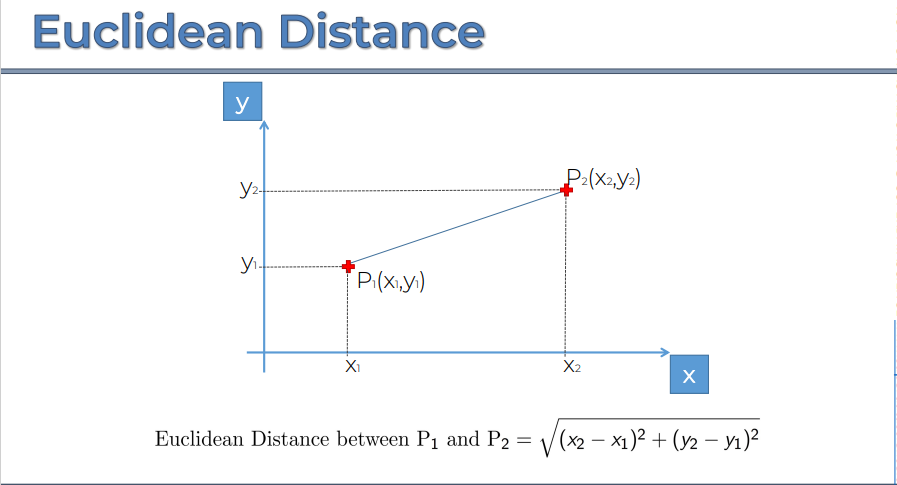

- Keeping **K = 5**, it considers **5 near points** to the **new data point**.
- Then we **count** the **data points** of the each **category** and **assigned** the **new data point** to the **category** that has **maximum count**.



 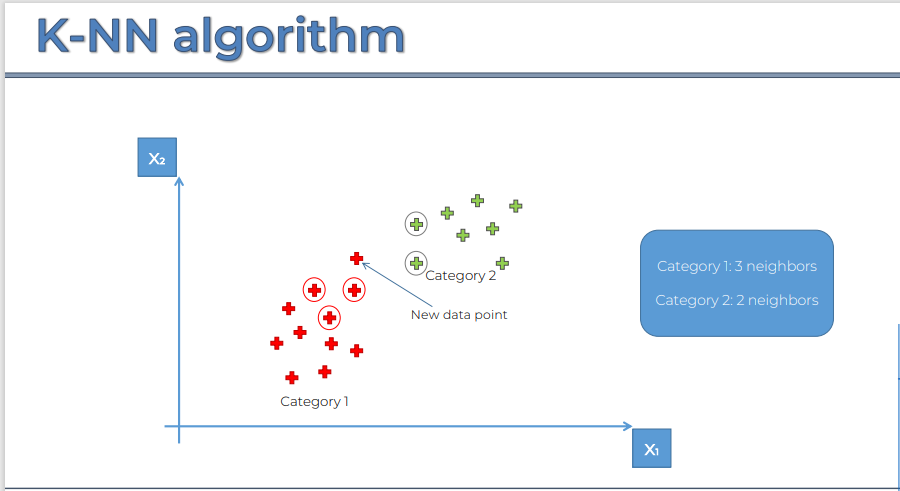

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Social_Network_Ads.csv")
data

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0
...,...,...,...
395,46,41000,1
396,51,23000,1
397,50,20000,1
398,36,33000,0


In [ ]:
X = data.iloc[:, :-1]
X

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000
...,...,...
395,46,41000
396,51,23000
397,50,20000
398,36,33000


In [ ]:
Y = data.iloc[:, -1]
Y

0      0
1      0
2      0
3      0
4      0
      ..
395    1
396    1
397    1
398    0
399    1
Name: Purchased, Length: 400, dtype: int64

#### TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [ ]:
X_train

,Age,EstimatedSalary
250,44,39000
63,32,120000
312,38,50000
159,32,135000
283,52,21000
...,...,...
323,48,30000
192,29,43000
117,36,52000
47,27,54000


In [ ]:
Y_train

250    0
63     1
312    0
159    1
283    1
      ..
323    1
192    0
117    0
47     0
172    0
Name: Purchased, Length: 300, dtype: int64

In [ ]:
X_test

,Age,EstimatedSalary
132,30,87000
309,38,50000
341,35,75000
196,30,79000
246,35,50000
...,...,...
146,27,96000
135,23,63000
390,48,33000
264,48,90000


In [ ]:
Y_test

132    0
309    0
341    0
196    0
246    0
      ..
146    1
135    0
390    1
264    1
364    1
Name: Purchased, Length: 100, dtype: int64

#### FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [ ]:
X_train = pd.DataFrame(sc.fit_transform(X_train), columns = ["Age", "Salary"])
X_train

,Age,Salary
0,0.581649,-0.886707
1,-0.606738,1.461738
2,-0.012544,-0.567782
3,-0.606738,1.896635
4,1.373907,-1.408584
...,...,...
295,0.977778,-1.147645
296,-0.903834,-0.770734
297,-0.210609,-0.509796
298,-1.101899,-0.451810


In [ ]:
X_test = pd.DataFrame(sc.transform(X_test), columns = ["Age", "Salary"])
X_test

,Age,Salary
0,-0.804802,0.504964
1,-0.012544,-0.567782
2,-0.309641,0.157046
3,-0.804802,0.273019
4,-0.309641,-0.567782
...,...,...
95,-1.101899,0.765902
96,-1.498028,-0.190872
97,0.977778,-1.060666
98,0.977778,0.591943


#### TRAINING K-NEAREST NEIGHBORS MODEL (TRAINING SET)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
KNN = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)

In [ ]:
KNN.fit(X_train, Y_train)

KNeighborsClassifier()

#### PREDICTING A NEW RESULT (FROM TEST SET)

In [ ]:
print(KNN.predict(sc.transform([[30, 87000]])))

[0]


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


#### PREDICTING TEST SET

In [ ]:
Y_pred = KNN.predict(X_test)
Y_pred

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1])

In [ ]:
Y_pred = pd.DataFrame(Y_pred, columns = ["Purchased Predicted"])
Y_pred

,Purchased Predicted
0,0
1,0
2,0
3,0
4,0
...,...
95,0
96,0
97,1
98,1


#### COMPARING THE PREDICTION VS ACTUAL

In [ ]:
Test_Set = X_test.join(pd.DataFrame(np.array(Y_test)))
Test_Set

,Age,Salary,0
0,-0.804802,0.504964,0
1,-0.012544,-0.567782,0
2,-0.309641,0.157046,0
3,-0.804802,0.273019,0
4,-0.309641,-0.567782,0
...,...,...,...
95,-1.101899,0.765902,1
96,-1.498028,-0.190872,0
97,0.977778,-1.060666,1
98,0.977778,0.591943,1


In [ ]:
Compare_Data = Test_Set.join(Y_pred)
Compare_Data

,Age,Salary,0,Purchased Predicted
0,-0.804802,0.504964,0,0
1,-0.012544,-0.567782,0,0
2,-0.309641,0.157046,0,0
3,-0.804802,0.273019,0,0
4,-0.309641,-0.567782,0,0
...,...,...,...,...
95,-1.101899,0.765902,1,0
96,-1.498028,-0.190872,0,0
97,0.977778,-1.060666,1,1
98,0.977778,0.591943,1,1


#### MAKING CONFUSION MATRIX

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(Y_test, Y_pred)
cm

array([[64,  4],
       [ 3, 29]])

**VISUALIZING CONFUSION MATRIX :**

Text(33.0, 0.5, 'ACTUAL LABEL')

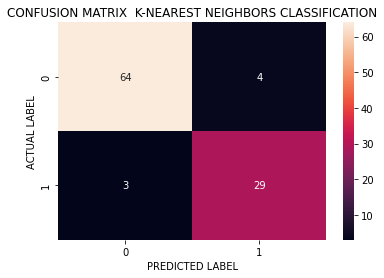

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True)
plt.title("CONFUSION MATRIX  K-NEAREST NEIGHBORS CLASSIFICATION")
plt.xlabel("PREDICTED LABEL")
plt.ylabel("ACTUAL LABEL")

In [ ]:
accuracy_score(Y_test, Y_pred)

0.93

#### VISUALIZING THE TRAINING SET

- Since **KNN Algorithm** has lots of **Computation Power** so it is ver difficult to execute the part of code, hence the resulted plot image of the codes is attached below.

In [ ]:
# from matplotlib.colors import ListedColormap
# X_set, Y_set = sc.inverse_transform(X_train), Y_train.values
# X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
#                      np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
# plt.contourf(X1, X2, KNN.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
#              alpha = 0.75, cmap = ListedColormap(('red', 'green')))

# plt.xlim(X1.min(), X1.max())
# plt.ylim(X2.min(), X2.max())

# for i, j in enumerate(np.unique(Y_set)):
#   plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

# plt.title("K-NEAREST NEIGHBORS CLASSIFICATION (TRAINING SET)")
# plt.xlabel("Age")
# plt.ylabel("Estimated Salary")
# plt.legend()
# plt.show()


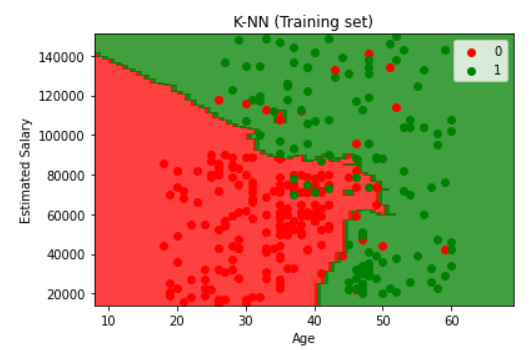

#### VISUALIZING THE TEST SET

In [ ]:
# from matplotlib.colors import ListedColormap
# X_set, Y_set = sc.inverse_transform(X_test), Y_test.values
# X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
#                      np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
# plt.contourf(X1, X2, KNN.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
#              alpha = 0.75, cmap = ListedColormap(('red', 'green')))

# plt.xlim(X1.min(), X1.max())
# plt.ylim(X2.min(), X2.max())

# for i, j in enumerate(np.unique(Y_set)):
#   plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

# plt.title("K-NEAREST NEIGHBORS CLASSIFICATION (TEST SET)")
# plt.xlabel("Age")
# plt.ylabel("Estimated Salary")
# plt.legend()
# plt.show()


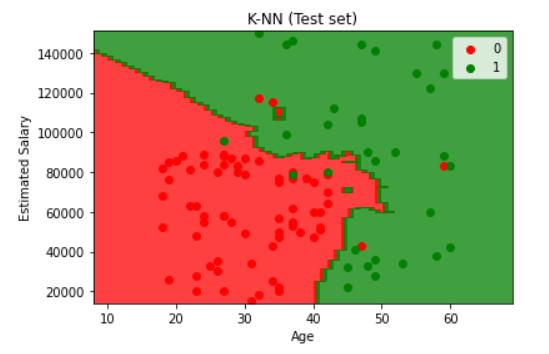

### PART 14 : DECISION TREE CLASSIFICATION

#### INTUITION

**CART : CLASSIFICATION AND REGRESSION TREES**
- 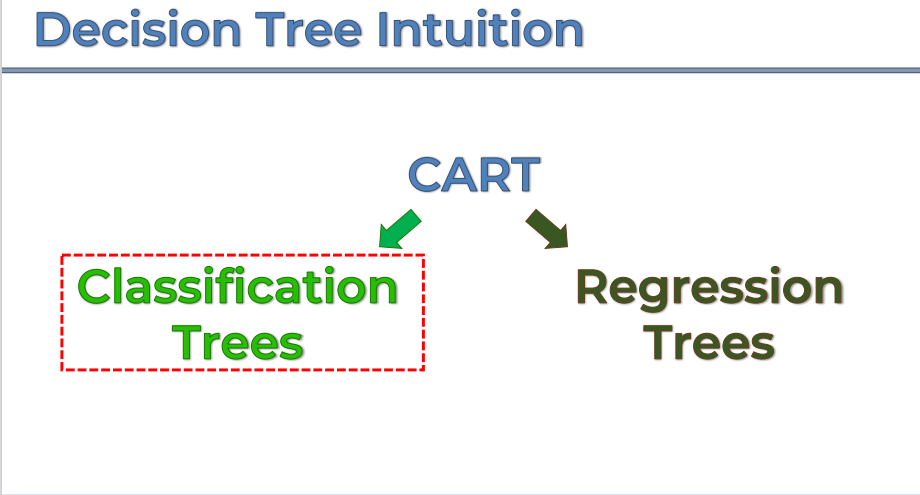

**SPLIT INTUITION :**
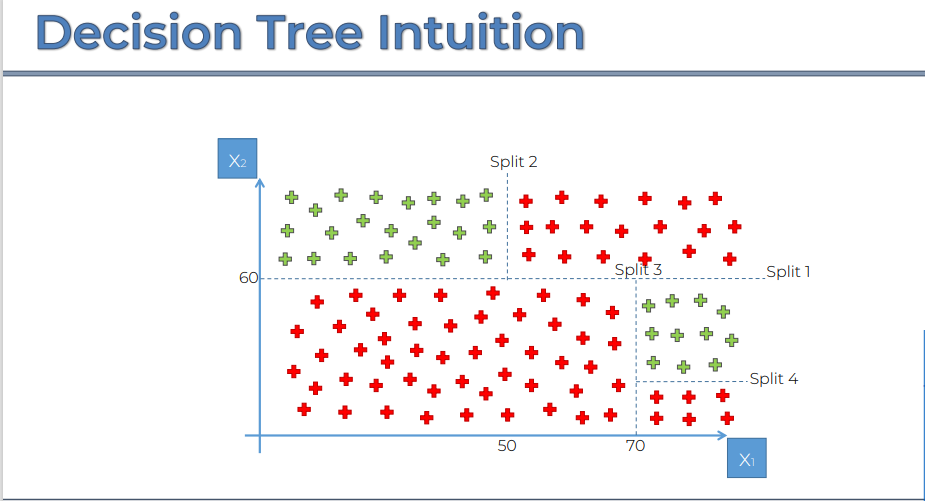

- Now we have the **Scatter Plot** of our **Dataset**.
- The **Algorithm** is going to **Split** the **Data Points** into several **Segments**.
- Basically the **Split** is doe in such a way that to **Maximize** the number of **Certain Category** in each of those **Splits**.
- In the background the **Split** is trying to **Minimize** the **Entropy**.

**SPLIT 1 :**
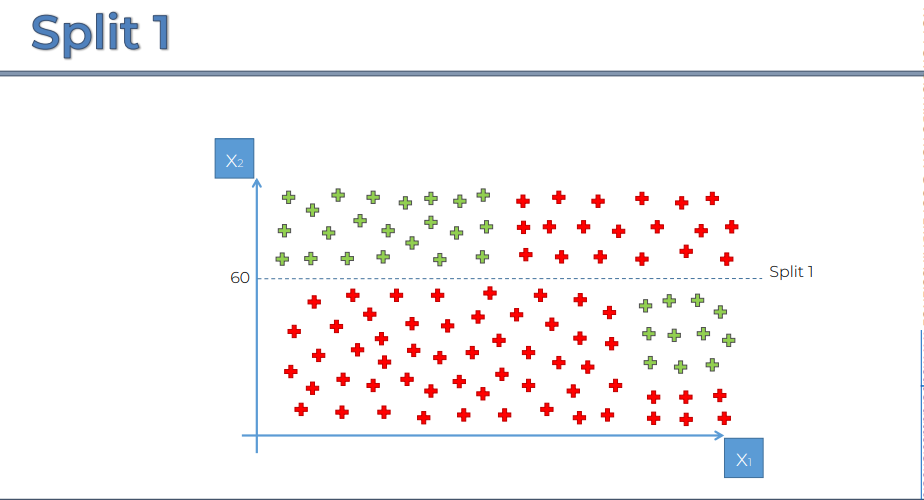

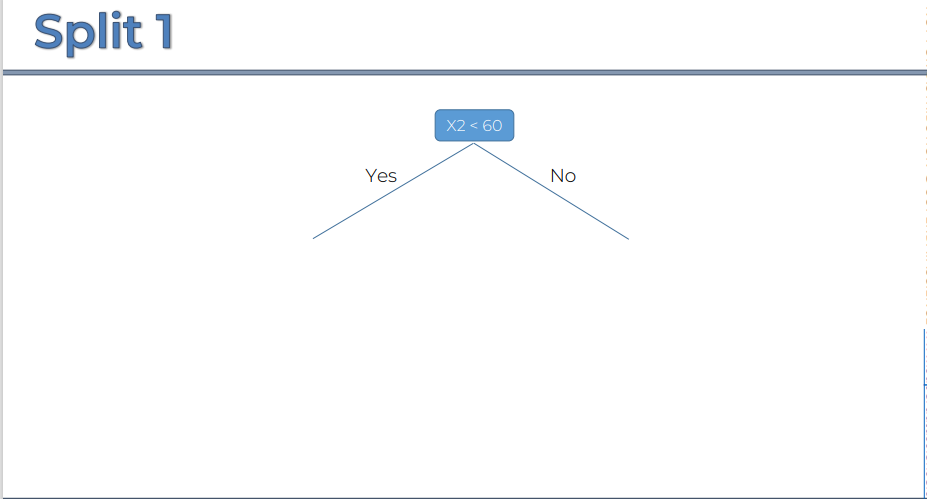

**SPLIT 2 :**
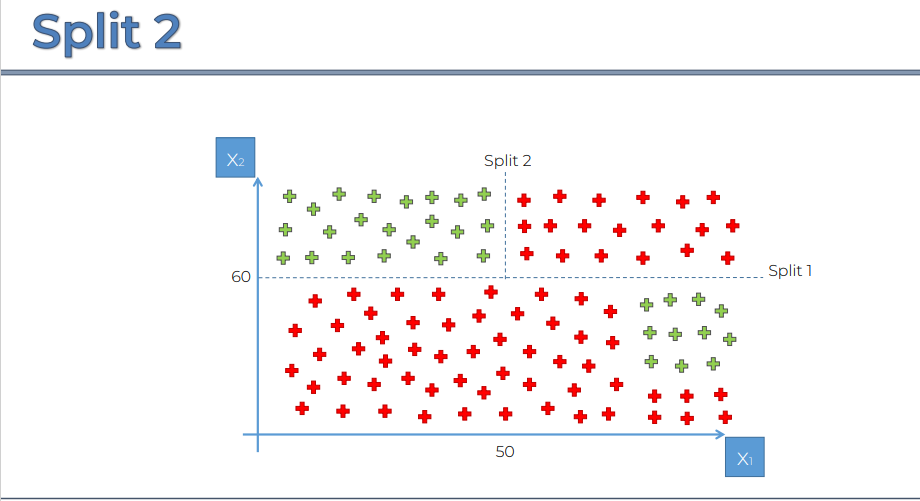

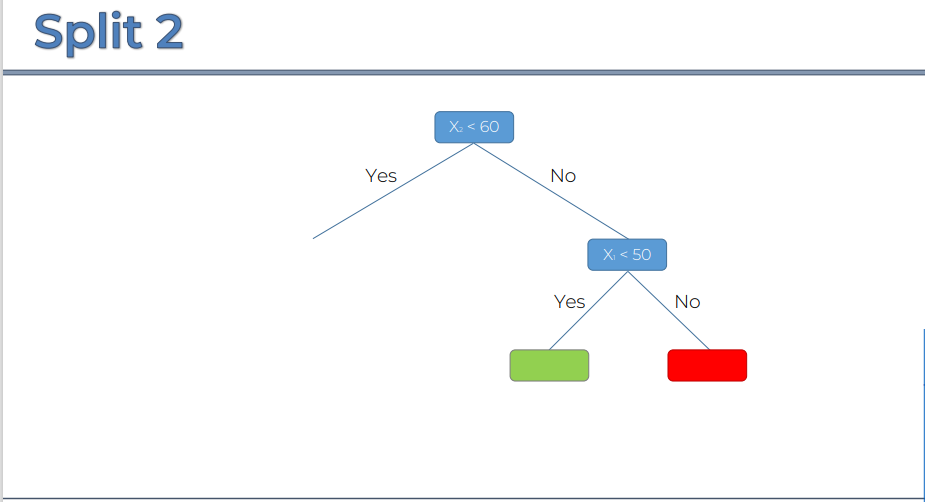

**SPLIT 3 :**
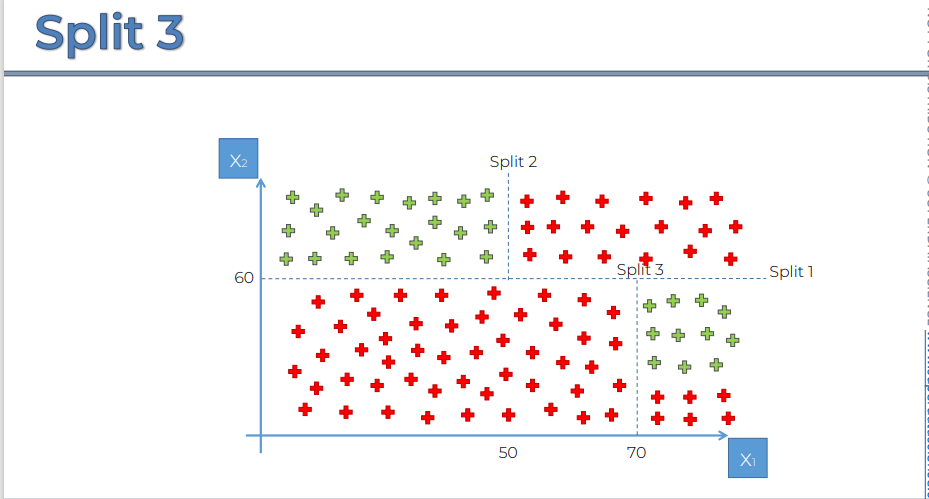

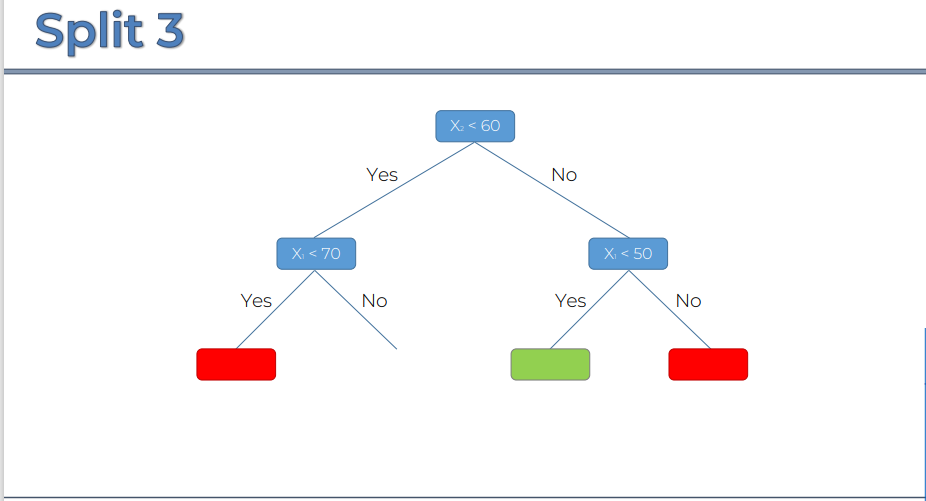

**SPLIT 4 :**
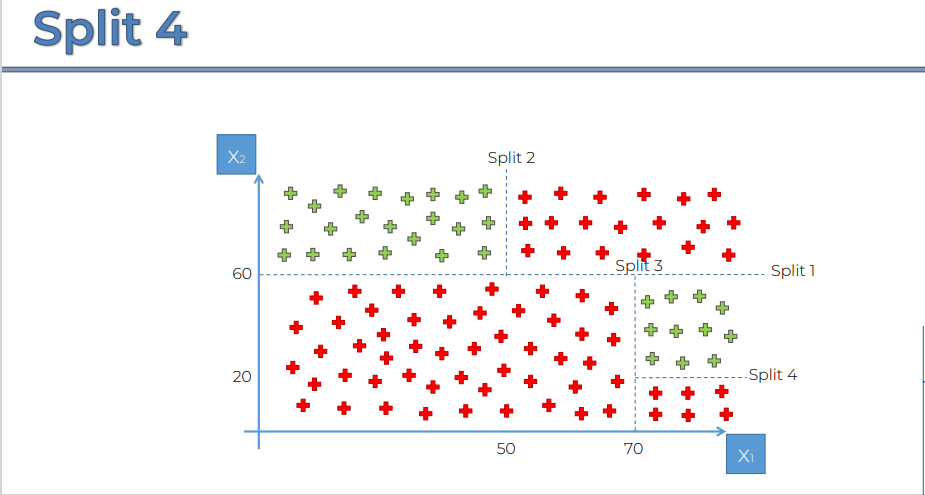

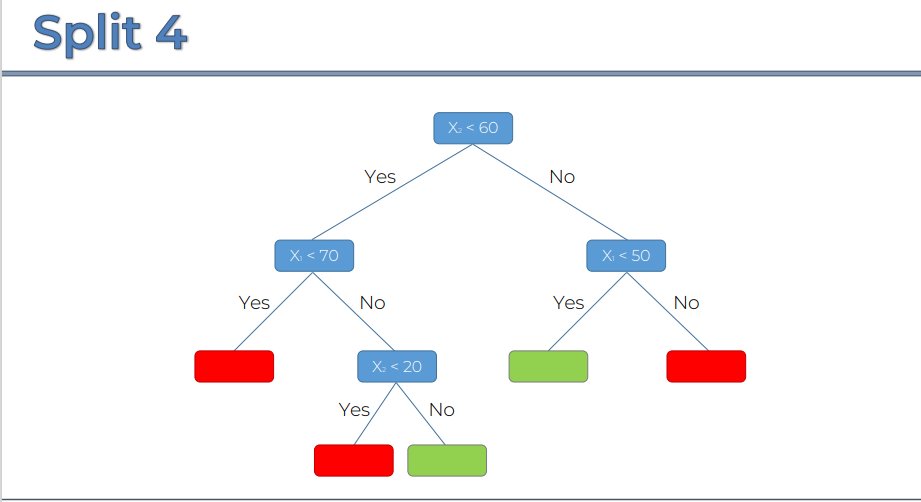

- **FEW ADD ON POINTS ABOUT DECISION TREES :**
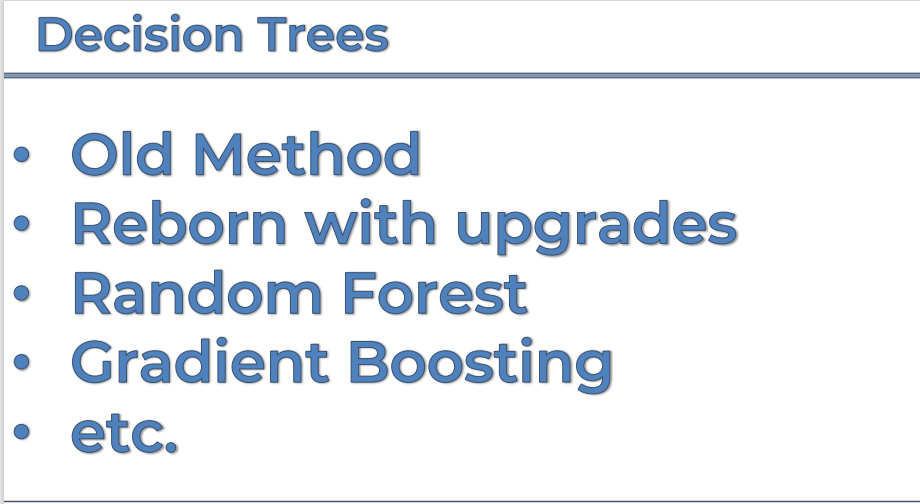

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Social_Network_Ads.csv")
data

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0
...,...,...,...
395,46,41000,1
396,51,23000,1
397,50,20000,1
398,36,33000,0


In [ ]:
X = data.iloc[:, :-1]
X

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000
...,...,...
395,46,41000
396,51,23000
397,50,20000
398,36,33000


In [ ]:
Y = data.iloc[:, -1]
Y

0      0
1      0
2      0
3      0
4      0
      ..
395    1
396    1
397    1
398    0
399    1
Name: Purchased, Length: 400, dtype: int64

#### TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [ ]:
X_train

,Age,EstimatedSalary
250,44,39000
63,32,120000
312,38,50000
159,32,135000
283,52,21000
...,...,...
323,48,30000
192,29,43000
117,36,52000
47,27,54000


In [ ]:
Y_train

250    0
63     1
312    0
159    1
283    1
      ..
323    1
192    0
117    0
47     0
172    0
Name: Purchased, Length: 300, dtype: int64

In [ ]:
X_test

,Age,EstimatedSalary
132,30,87000
309,38,50000
341,35,75000
196,30,79000
246,35,50000
...,...,...
146,27,96000
135,23,63000
390,48,33000
264,48,90000


In [ ]:
Y_test

132    0
309    0
341    0
196    0
246    0
      ..
146    1
135    0
390    1
264    1
364    1
Name: Purchased, Length: 100, dtype: int64

#### FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [ ]:
X_train = pd.DataFrame(sc.fit_transform(X_train), columns = ["Age", "Salary"])
X_train

,Age,Salary
0,0.581649,-0.886707
1,-0.606738,1.461738
2,-0.012544,-0.567782
3,-0.606738,1.896635
4,1.373907,-1.408584
...,...,...
295,0.977778,-1.147645
296,-0.903834,-0.770734
297,-0.210609,-0.509796
298,-1.101899,-0.451810


In [ ]:
X_test = pd.DataFrame(sc.transform(X_test), columns = ["Age", "Salary"])
X_test

,Age,Salary
0,-0.804802,0.504964
1,-0.012544,-0.567782
2,-0.309641,0.157046
3,-0.804802,0.273019
4,-0.309641,-0.567782
...,...,...
95,-1.101899,0.765902
96,-1.498028,-0.190872
97,0.977778,-1.060666
98,0.977778,0.591943


#### TRAINING DECISION TREE CLASSIFICATION MODEL (TRAINING SET)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
DT_C = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)

In [ ]:
DT_C.fit(X_train, Y_train) 

DecisionTreeClassifier(criterion='entropy', random_state=0)

#### PREDICTING NEW RESULT (FROM THE TEST SET)

In [ ]:
print(DT_C.predict(sc.transform([[30, 87000]])))

[0]


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


#### PREDICTING TEST SET

In [ ]:
Y_pred = DT_C.predict(X_test)
Y_pred

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1])

In [ ]:
Y_pred = pd.DataFrame(Y_pred, columns = ["Purchased Predicted"])
Y_pred

,Purchased Predicted
0,0
1,0
2,0
3,0
4,0
...,...
95,1
96,0
97,1
98,1


#### COMPARING PREDICTION VS ACTUAL

In [ ]:
Test_Set = X_test.join(pd.DataFrame(np.array(Y_test)))
Test_Set

,Age,Salary,0
0,-0.804802,0.504964,0
1,-0.012544,-0.567782,0
2,-0.309641,0.157046,0
3,-0.804802,0.273019,0
4,-0.309641,-0.567782,0
...,...,...,...
95,-1.101899,0.765902,1
96,-1.498028,-0.190872,0
97,0.977778,-1.060666,1
98,0.977778,0.591943,1


In [ ]:
Compare_Data = Test_Set.join(Y_pred)
Compare_Data

,Age,Salary,0,Purchased Predicted
0,-0.804802,0.504964,0,0
1,-0.012544,-0.567782,0,0
2,-0.309641,0.157046,0,0
3,-0.804802,0.273019,0,0
4,-0.309641,-0.567782,0,0
...,...,...,...,...
95,-1.101899,0.765902,1,1
96,-1.498028,-0.190872,0,0
97,0.977778,-1.060666,1,1
98,0.977778,0.591943,1,1


#### CONFUSION MATRIX

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(Y_test, Y_pred)
cm

array([[62,  6],
       [ 3, 29]])

**VISUALIZING CONFUSION MATRIX :**

Text(33.0, 0.5, 'ACTUAL LABEL')

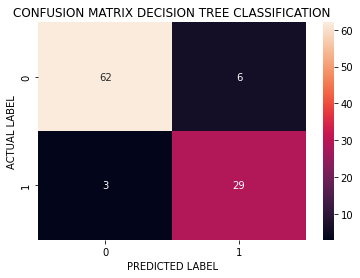

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True)
plt.title("CONFUSION MATRIX DECISION TREE CLASSIFICATION")
plt.xlabel("PREDICTED LABEL")
plt.ylabel("ACTUAL LABEL")

In [ ]:
accuracy_score(Y_test, Y_pred)

0.91

#### VISUALIZING THE TRAINING SET

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


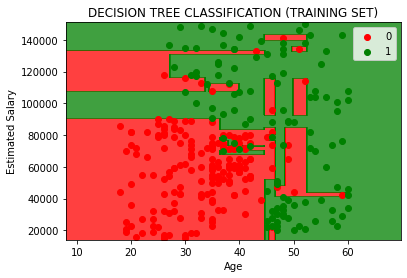

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_train), Y_train.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, DT_C.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("DECISION TREE CLASSIFICATION (TRAINING SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


#### VISUALIZING THE TEST SET

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


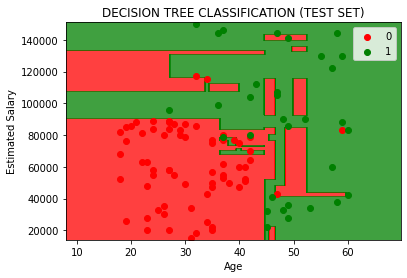

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_test), Y_test.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, DT_C.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("DECISION TREE CLASSIFICATION (TEST SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


### PART 15 : RANDOM FOREST CLASSIFICATION

#### INTUITION

**ENSEMBLE LEARNING :**
- When we take **Multiple Machine Learning Algorithms** and put them together to create **One Bigger Machine Learning Algorithm**, So that the **ML Algorithm** the **final one** is actually using **leveraging**nmany different **ML Algorithm** and they can be **Same ML Algorithm** as we will see today.

**RANDOM FOREST :**
- Combines a **Lot** of **Decision Tree Method**.

**STEPS TO BUILD RANDOM FOREST ALGORITHM :**
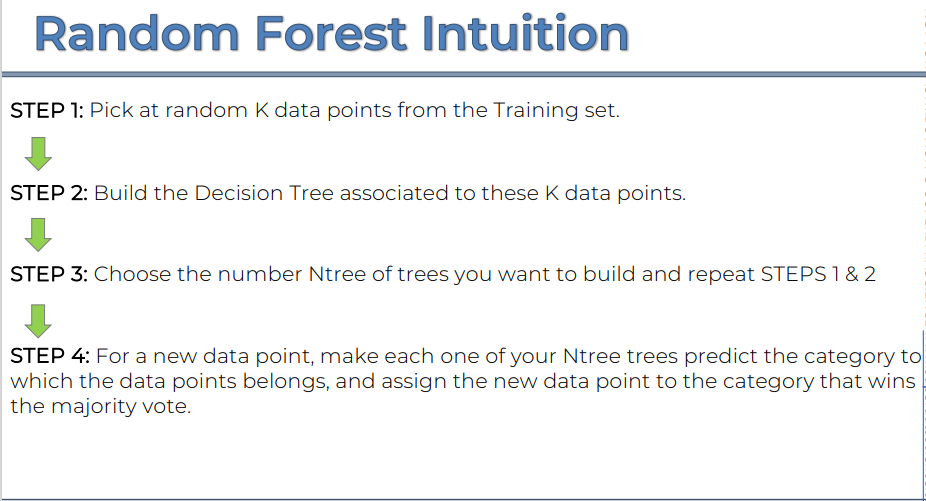

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Social_Network_Ads.csv")
data

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0
...,...,...,...
395,46,41000,1
396,51,23000,1
397,50,20000,1
398,36,33000,0


In [ ]:
X = data.iloc[:, :-1]
X

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000
...,...,...
395,46,41000
396,51,23000
397,50,20000
398,36,33000


In [ ]:
Y = data.iloc[:, -1]
Y

0      0
1      0
2      0
3      0
4      0
      ..
395    1
396    1
397    1
398    0
399    1
Name: Purchased, Length: 400, dtype: int64

#### TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [ ]:
X_train

,Age,EstimatedSalary
250,44,39000
63,32,120000
312,38,50000
159,32,135000
283,52,21000
...,...,...
323,48,30000
192,29,43000
117,36,52000
47,27,54000


In [ ]:
X_test

,Age,EstimatedSalary
132,30,87000
309,38,50000
341,35,75000
196,30,79000
246,35,50000
...,...,...
146,27,96000
135,23,63000
390,48,33000
264,48,90000


In [ ]:
Y_train

250    0
63     1
312    0
159    1
283    1
      ..
323    1
192    0
117    0
47     0
172    0
Name: Purchased, Length: 300, dtype: int64

In [ ]:
Y_test

132    0
309    0
341    0
196    0
246    0
      ..
146    1
135    0
390    1
264    1
364    1
Name: Purchased, Length: 100, dtype: int64

#### FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [ ]:
X_train = pd.DataFrame(sc.fit_transform(X_train), columns = ["Age", "Salary"])
X_train

,Age,Salary
0,0.581649,-0.886707
1,-0.606738,1.461738
2,-0.012544,-0.567782
3,-0.606738,1.896635
4,1.373907,-1.408584
...,...,...
295,0.977778,-1.147645
296,-0.903834,-0.770734
297,-0.210609,-0.509796
298,-1.101899,-0.451810


In [ ]:
X_test = pd.DataFrame(sc.transform(X_test), columns = ["Age", "Salary"])
X_test

,Age,Salary
0,-0.804802,0.504964
1,-0.012544,-0.567782
2,-0.309641,0.157046
3,-0.804802,0.273019
4,-0.309641,-0.567782
...,...,...
95,-1.101899,0.765902
96,-1.498028,-0.190872
97,0.977778,-1.060666
98,0.977778,0.591943


#### TRAINING RANDOM FOREST CLASSIFICATION MODEL (TRAINING SET)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
RF_C = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)

In [ ]:
RF_C.fit(X_train, Y_train) 

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)

#### PREDICTING NEW RESULT (FROM THE TEST SET)

In [ ]:
print(RF_C.predict(sc.transform([[30, 87000]])))

[0]


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


#### PREDICTING TEST SET

In [ ]:
Y_pred = RF_C.predict(X_test)
Y_pred

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1])

In [ ]:
Y_pred = pd.DataFrame(Y_pred, columns = ["Purchased Predicted"])
Y_pred

,Purchased Predicted
0,0
1,0
2,0
3,0
4,0
...,...
95,0
96,0
97,1
98,1


#### COMPARING PREDICTION VS ACTUAL

In [ ]:
Test_Set = X_test.join(pd.DataFrame(np.array(Y_test)))
Test_Set

,Age,Salary,0
0,-0.804802,0.504964,0
1,-0.012544,-0.567782,0
2,-0.309641,0.157046,0
3,-0.804802,0.273019,0
4,-0.309641,-0.567782,0
...,...,...,...
95,-1.101899,0.765902,1
96,-1.498028,-0.190872,0
97,0.977778,-1.060666,1
98,0.977778,0.591943,1


In [ ]:
Compare_Data = Test_Set.join(Y_pred)
Compare_Data

,Age,Salary,0,Purchased Predicted
0,-0.804802,0.504964,0,0
1,-0.012544,-0.567782,0,0
2,-0.309641,0.157046,0,0
3,-0.804802,0.273019,0,0
4,-0.309641,-0.567782,0,0
...,...,...,...,...
95,-1.101899,0.765902,1,0
96,-1.498028,-0.190872,0,0
97,0.977778,-1.060666,1,1
98,0.977778,0.591943,1,1


#### CONFUSION MATRIX

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(Y_test, Y_pred)
cm

array([[63,  5],
       [ 4, 28]])

**VISUALIZING CONFUSION MATRIX :**

Text(33.0, 0.5, 'ACTUAL LABEL')

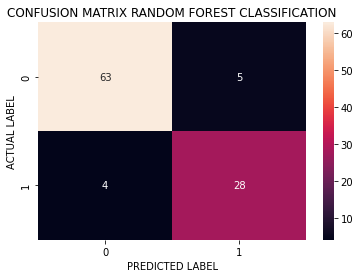

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True)
plt.title("CONFUSION MATRIX RANDOM FOREST CLASSIFICATION")
plt.xlabel("PREDICTED LABEL")
plt.ylabel("ACTUAL LABEL")

In [ ]:
accuracy_score(Y_test, Y_pred)

0.91

#### VISUALIZING THE TRAINING SET

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


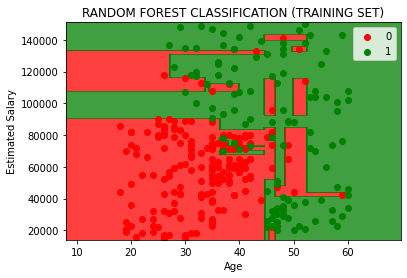

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_train), Y_train.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, DT_C.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("RANDOM FOREST CLASSIFICATION (TRAINING SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


#### VISUALIZING THE TEST SET

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


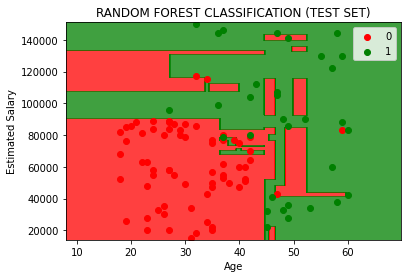

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_test), Y_test.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, DT_C.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("RANDOM FOREST CLASSIFICATION (TEST SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


### PART 16 : SUPPORT VECTOR MACHINE CLASSIFICATION

#### INTUITION

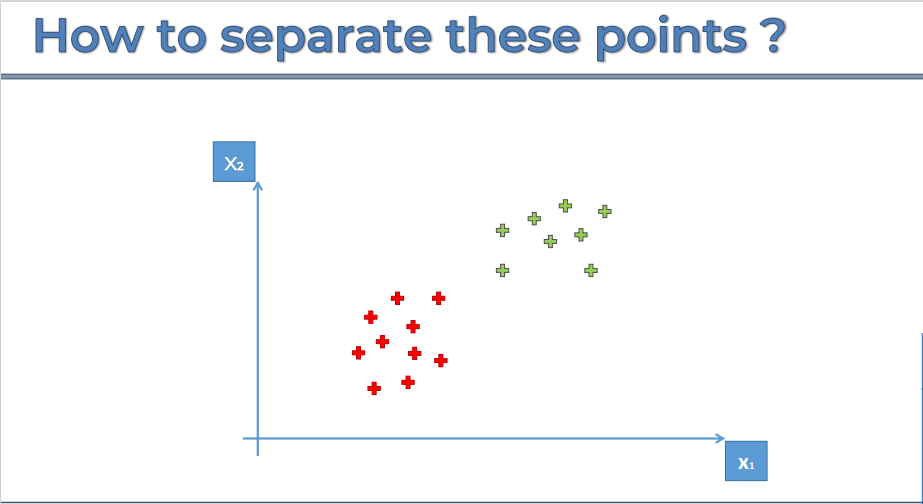

- Let's say we have **Two Class** of **Points**.
- It is almost lke **Linear Regression**, we will try to **Draw** various ** Possible Lines** between the **Class** of **Data Points**.
- So let's see how **SVM** searhed for the **Best Line** to **Serparate** the **Class** of the **Data Points**.

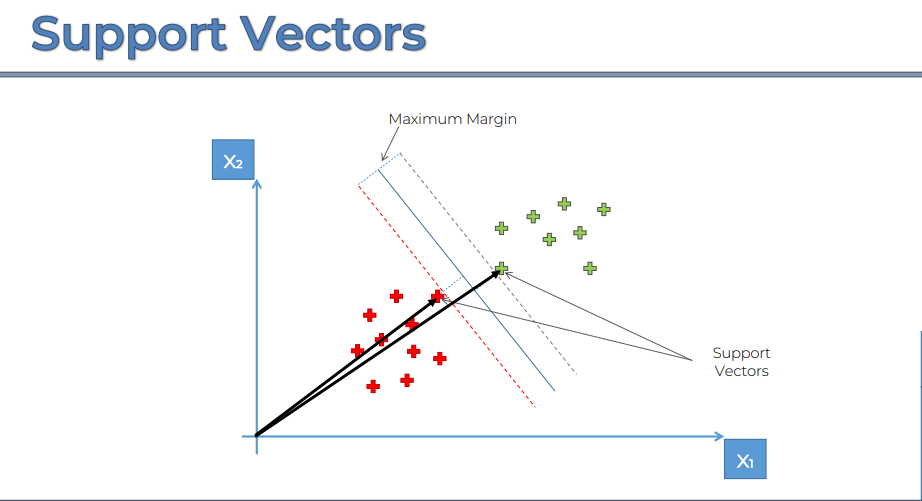

- Well the **Line** is searched through **Maximum Margin**.
- So here is the **Line** that **Separates** the **Two Class** of the **Data Points**, at the same time it has **Maximum Margin**.
- The **Line** is **Drawn** on the Basis of the **Equi-Distance** from the **Two Class** of the **points**
- These **Two Points** are called as **Support Vectors**.
- **Vector** -> Is called when the **Points** are **Mapped** at the **Higher-Dimensional Space**.

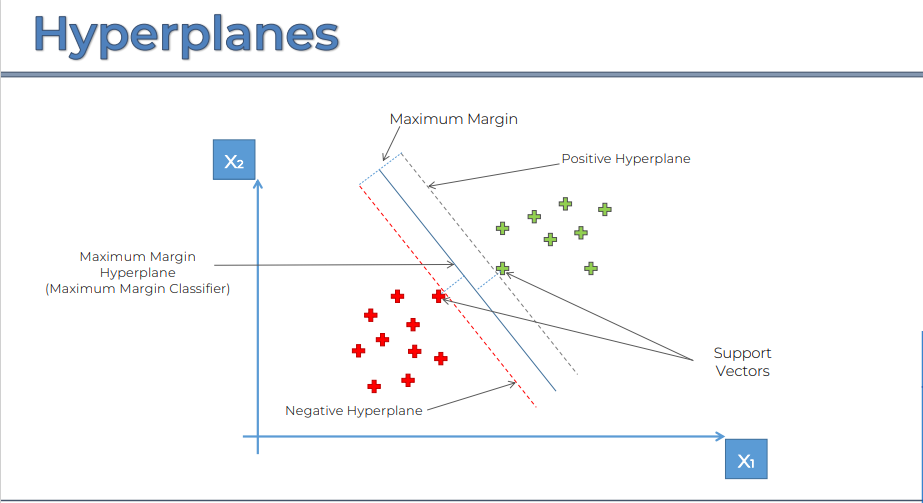

- The **Separator Line** is called **Maximum Margin Hyper-Plane**
- **Hyper-Plane** -> Is called when the **Line** is **Mapped** in the **Higher-Dimensional Space**.  

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Social_Network_Ads.csv")
data

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0
...,...,...,...
395,46,41000,1
396,51,23000,1
397,50,20000,1
398,36,33000,0


In [ ]:
X = data.iloc[:, :-1]
X

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000
...,...,...
395,46,41000
396,51,23000
397,50,20000
398,36,33000


In [ ]:
Y = data.iloc[:, -1]
Y

0      0
1      0
2      0
3      0
4      0
      ..
395    1
396    1
397    1
398    0
399    1
Name: Purchased, Length: 400, dtype: int64

#### TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [ ]:
X_train

,Age,EstimatedSalary
250,44,39000
63,32,120000
312,38,50000
159,32,135000
283,52,21000
...,...,...
323,48,30000
192,29,43000
117,36,52000
47,27,54000


In [ ]:
X_test

,Age,EstimatedSalary
132,30,87000
309,38,50000
341,35,75000
196,30,79000
246,35,50000
...,...,...
146,27,96000
135,23,63000
390,48,33000
264,48,90000


In [ ]:
Y_train

250    0
63     1
312    0
159    1
283    1
      ..
323    1
192    0
117    0
47     0
172    0
Name: Purchased, Length: 300, dtype: int64

In [ ]:
Y_test

132    0
309    0
341    0
196    0
246    0
      ..
146    1
135    0
390    1
264    1
364    1
Name: Purchased, Length: 100, dtype: int64

#### FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [ ]:
X_train = pd.DataFrame(sc.fit_transform(X_train), columns = ["Age", "Salary"])
X_train

,Age,Salary
0,0.581649,-0.886707
1,-0.606738,1.461738
2,-0.012544,-0.567782
3,-0.606738,1.896635
4,1.373907,-1.408584
...,...,...
295,0.977778,-1.147645
296,-0.903834,-0.770734
297,-0.210609,-0.509796
298,-1.101899,-0.451810


In [ ]:
X_test = pd.DataFrame(sc.transform(X_test), columns = ["Age", "Salary"])
X_test

,Age,Salary
0,-0.804802,0.504964
1,-0.012544,-0.567782
2,-0.309641,0.157046
3,-0.804802,0.273019
4,-0.309641,-0.567782
...,...,...
95,-1.101899,0.765902
96,-1.498028,-0.190872
97,0.977778,-1.060666
98,0.977778,0.591943


#### TRAINING SUPPORT VECTOR MACHINE MODEL (TRAINING SET)

In [ ]:
from sklearn.svm import SVC
SVM = SVC(kernel = 'linear', random_state = 0)

In [ ]:
SVM.fit(X_train, Y_train)

SVC(kernel='linear', random_state=0)

#### PREDICTING A NEW RESULT (FROM TEST SET)

In [ ]:
print(SVM.predict(sc.transform([[30, 87000]])))

[0]


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


#### PREDICTING TEST SET

In [ ]:
Y_pred = SVM.predict(X_test)
Y_pred

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1])

In [ ]:
Y_pred = pd.DataFrame(Y_pred, columns = ["Purchased Predicted"])
Y_pred

,Purchased Predicted
0,0
1,0
2,0
3,0
4,0
...,...
95,0
96,0
97,0
98,1


#### COMPARING PREDICTION VS ACTUAL 

In [ ]:
Test_Set = X_test.join(pd.DataFrame(np.array(Y_test)))
Test_Set

,Age,Salary,0
0,-0.804802,0.504964,0
1,-0.012544,-0.567782,0
2,-0.309641,0.157046,0
3,-0.804802,0.273019,0
4,-0.309641,-0.567782,0
...,...,...,...
95,-1.101899,0.765902,1
96,-1.498028,-0.190872,0
97,0.977778,-1.060666,1
98,0.977778,0.591943,1


In [ ]:
Compare_Data = Test_Set.join(Y_pred)
Compare_Data

,Age,Salary,0,Purchased Predicted
0,-0.804802,0.504964,0,0
1,-0.012544,-0.567782,0,0
2,-0.309641,0.157046,0,0
3,-0.804802,0.273019,0,0
4,-0.309641,-0.567782,0,0
...,...,...,...,...
95,-1.101899,0.765902,1,0
96,-1.498028,-0.190872,0,0
97,0.977778,-1.060666,1,0
98,0.977778,0.591943,1,1


#### MAKING CONFUSION MATRIX

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(Y_test, Y_pred)
cm

array([[66,  2],
       [ 8, 24]])

**VISUALIZING CONFUSION MATRIX :**

Text(33.0, 0.5, 'ACTUAL LABEL')

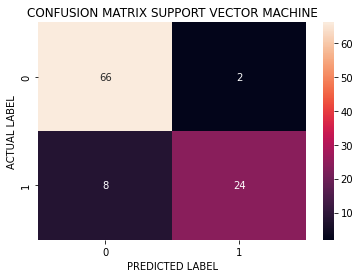

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True)
plt.title("CONFUSION MATRIX SUPPORT VECTOR MACHINE")
plt.xlabel("PREDICTED LABEL")
plt.ylabel("ACTUAL LABEL")

In [ ]:
accuracy_score(Y_test, Y_pred)

0.9

#### VISUALIZING THE TRAINING SET

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


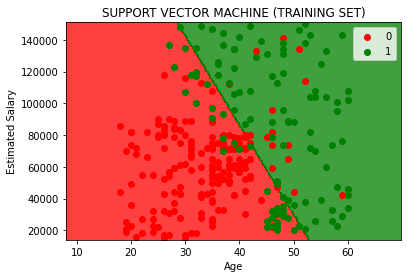

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_train), Y_train.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, SVM.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("SUPPORT VECTOR MACHINE (TRAINING SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


#### VISUALIZING THE TEST SET

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


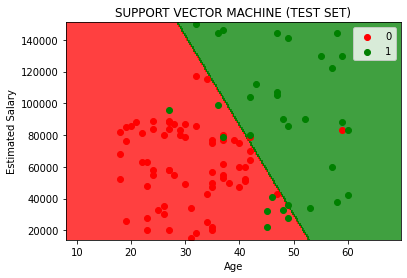

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_test), Y_test.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, SVM.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("SUPPORT VECTOR MACHINE (TEST SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


### PART 17 : KERNEL SVM CLASSIFICATION

#### INTUITION

##### KERNEL SVM BASIC

- In this **Case** we have our **Data Set** which is **Not Linearly Separable**.
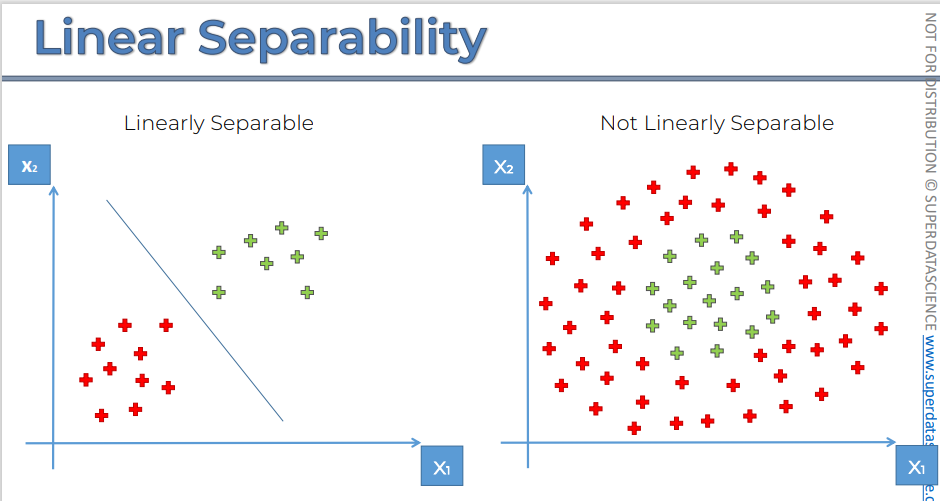

- So this can be done in the **Intuitive Metod**, So it is **DOne** by **Mapping** the **Data** into **Higher Dimensional Space** in **Step By Step**.

**STEP 1 :**
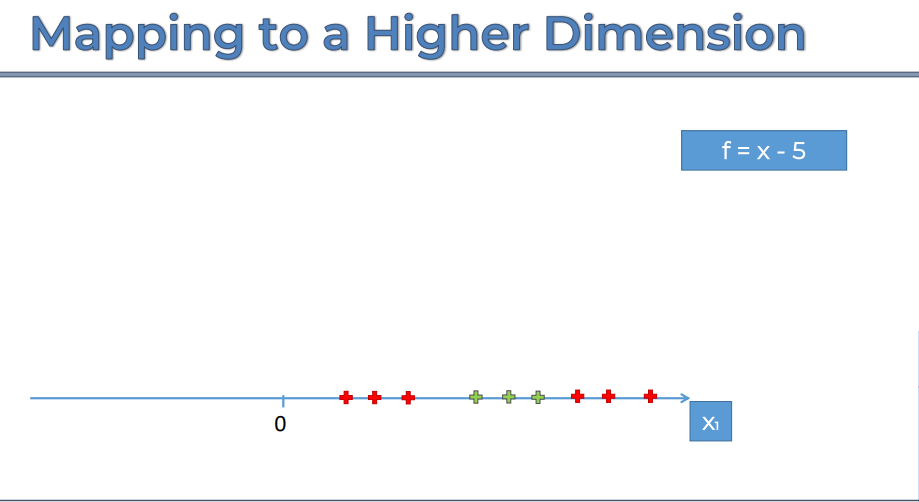

- We will **Subract** the **Data Points** with the **Function 5**.

**STEP 2 :**
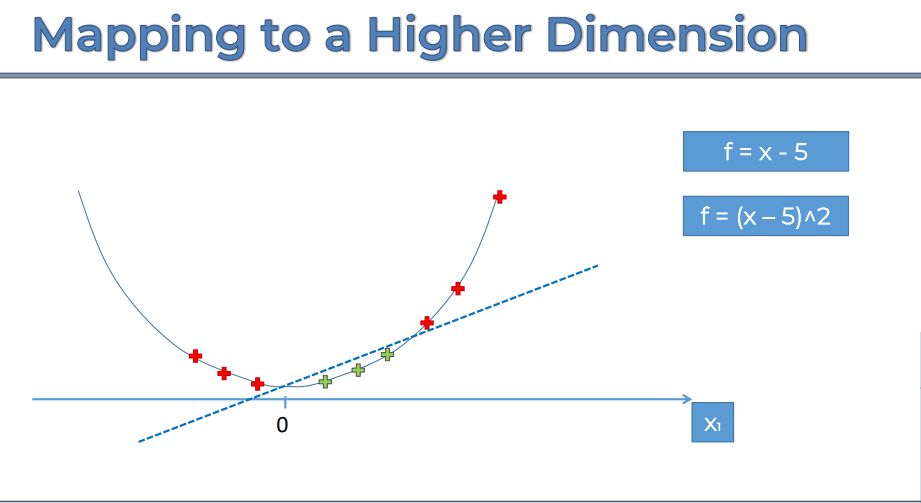

-  Now **Square** the **Terms** to **Map** them in the **Hiher Dimensional Space**.
- And Now the **Data** is **Linearly Separable**.

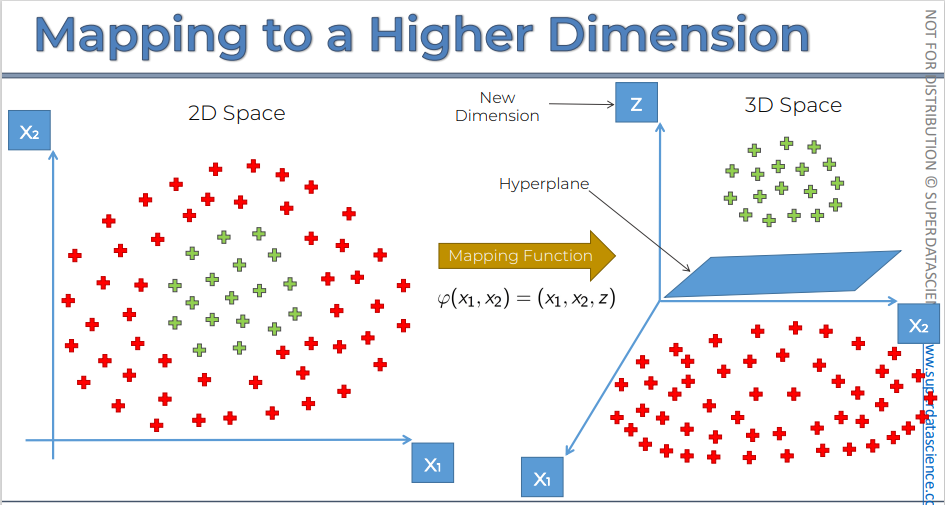

- Now we can **Apply** the same **Concept** for our **Previous Example**.
- And that looks something like this.
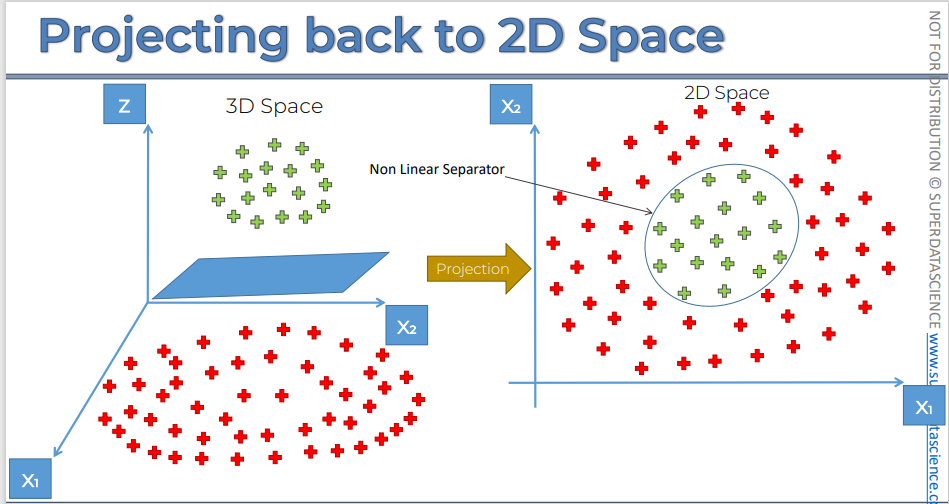

**PROBLEM OF MAPPING THE HIGHER DIMENSIONAL SPACE**
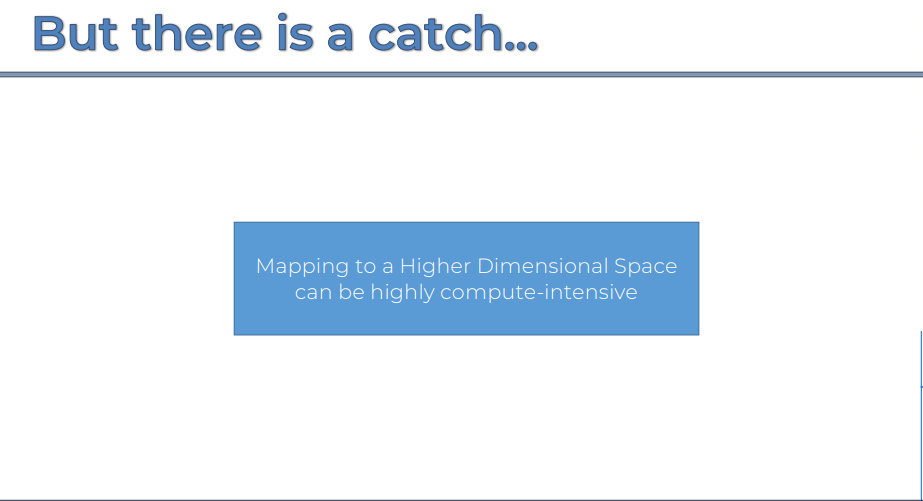

##### KERNEL TRICK

**KERNEL TRICK :**


**Mathematical Intuition :**
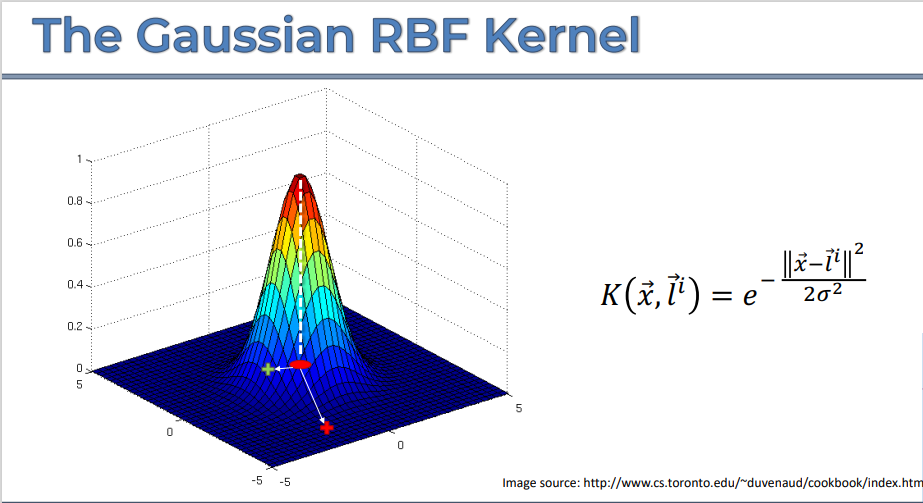

- **K - Kernel Fuction, applied to the 2 Vector (X, Li)**.
- **X - Data Point, in our Data Set**.
- **L - Landmark**
- **e - Exponential Power**
- **Sigma - Circumference**
- **||X-Li|| - Distance between the X and the Landmark**.


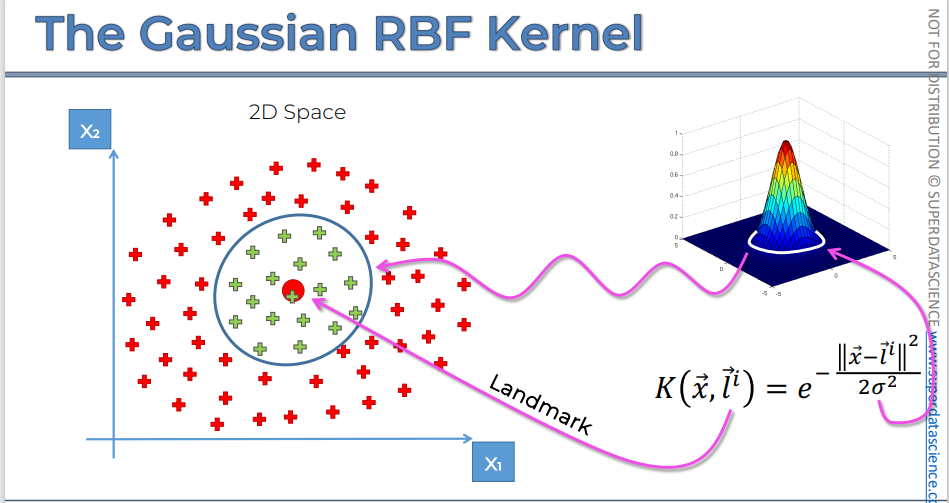

- **Landmark** is on the **middle** of the **plane**.
- So now take a **Point** and solving on the above equation, 
 - If the **e-Exponential** value gets **Larger**, then the value of **K-Kernael** function will be very close to **0**.
 - If te **e-Exponential** value gets **Smaller** to **0**, then the value of **K-Kernel** function will be almost equal to **1**.


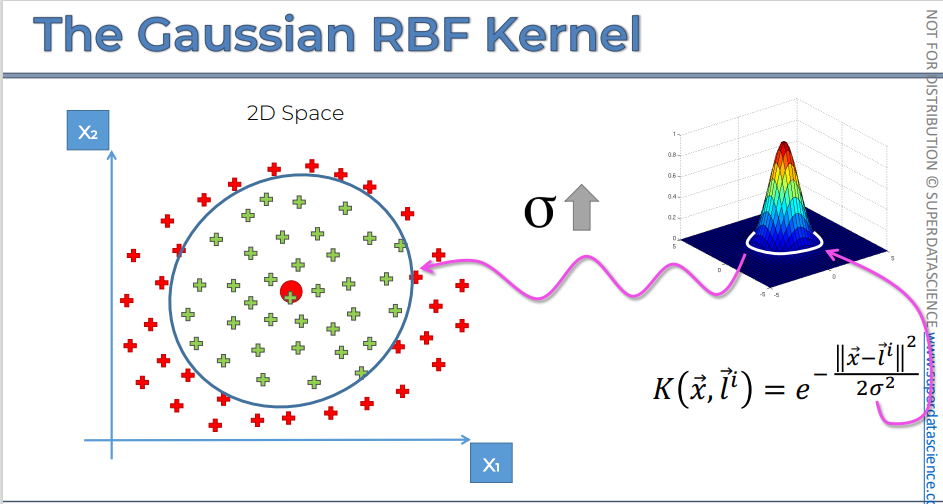

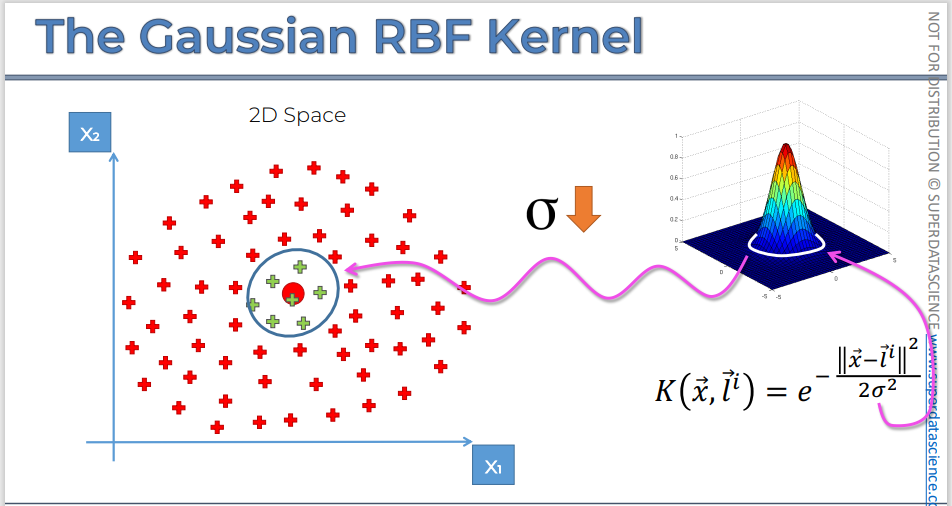

- We use **K-Kernel** function to separate ou **Dataset** to build that **Decision Boundary**.
- Therefore any **Values** that falls apart the **Circumference** will be **Assigned** as **0**.
- And the **Values** that falls within the **Circumference** will be **Assigned** as **1**.


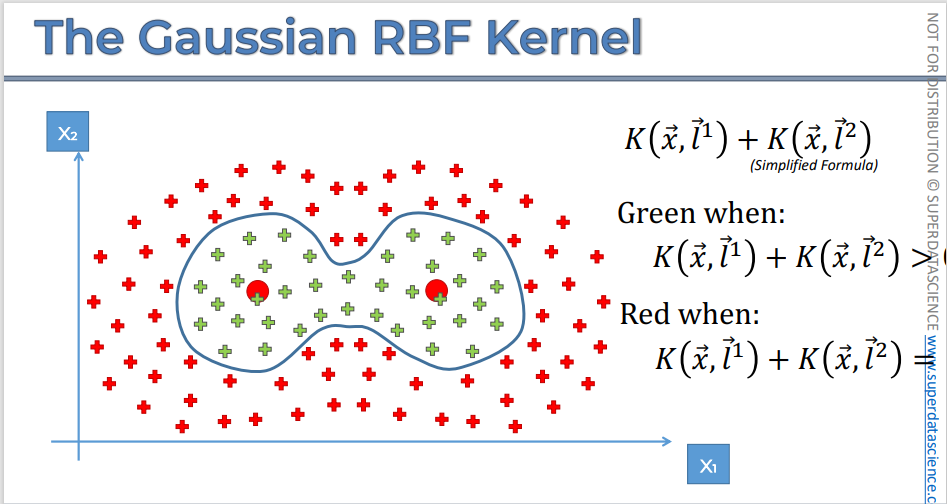

##### TYPES OF KERNEL FUNCTIONS

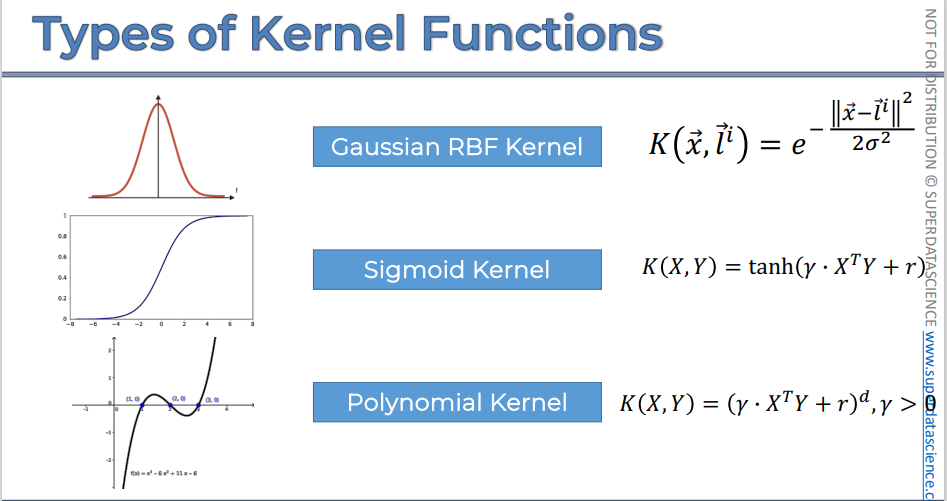

##### NON_LINEAR SVR

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Social_Network_Ads.csv")
data

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0
...,...,...,...
395,46,41000,1
396,51,23000,1
397,50,20000,1
398,36,33000,0


In [ ]:
X = data.iloc[:, :-1]
X

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000
...,...,...
395,46,41000
396,51,23000
397,50,20000
398,36,33000


In [ ]:
Y = data.iloc[:, -1]
Y

0      0
1      0
2      0
3      0
4      0
      ..
395    1
396    1
397    1
398    0
399    1
Name: Purchased, Length: 400, dtype: int64

#### TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [ ]:
X_train

,Age,EstimatedSalary
250,44,39000
63,32,120000
312,38,50000
159,32,135000
283,52,21000
...,...,...
323,48,30000
192,29,43000
117,36,52000
47,27,54000


In [ ]:
X_test

,Age,EstimatedSalary
132,30,87000
309,38,50000
341,35,75000
196,30,79000
246,35,50000
...,...,...
146,27,96000
135,23,63000
390,48,33000
264,48,90000


In [ ]:
Y_train

250    0
63     1
312    0
159    1
283    1
      ..
323    1
192    0
117    0
47     0
172    0
Name: Purchased, Length: 300, dtype: int64

In [ ]:
Y_test

132    0
309    0
341    0
196    0
246    0
      ..
146    1
135    0
390    1
264    1
364    1
Name: Purchased, Length: 100, dtype: int64

#### FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [ ]:
X_train = pd.DataFrame(sc.fit_transform(X_train), columns = ["Age", "Salary"])
X_train

,Age,Salary
0,0.581649,-0.886707
1,-0.606738,1.461738
2,-0.012544,-0.567782
3,-0.606738,1.896635
4,1.373907,-1.408584
...,...,...
295,0.977778,-1.147645
296,-0.903834,-0.770734
297,-0.210609,-0.509796
298,-1.101899,-0.451810


In [ ]:
X_test = pd.DataFrame(sc.transform(X_test), columns = ["Age", "Salary"])
X_test

,Age,Salary
0,-0.804802,0.504964
1,-0.012544,-0.567782
2,-0.309641,0.157046
3,-0.804802,0.273019
4,-0.309641,-0.567782
...,...,...
95,-1.101899,0.765902
96,-1.498028,-0.190872
97,0.977778,-1.060666
98,0.977778,0.591943


#### TRAINING KERNEL SUPPORT MACHINE MODEL (TRAINING SET)

In [ ]:
from sklearn.svm import SVC
KSVM = SVC(kernel = 'rbf', random_state = 0)

In [ ]:
KSVM.fit(X_train, Y_train)

SVC(random_state=0)

#### PREDICTING A NEW RESULT (FROM TEST SET)

In [ ]:
print(KSVM.predict(sc.transform([[30, 87000]])))

[0]


/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


#### PREDICTING TEST SET

In [ ]:
Y_pred = KSVM.predict(X_test)
Y_pred

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1])

In [ ]:
Y_pred = pd.DataFrame(Y_pred, columns = ["Purchased Predicted"])
Y_pred

,Purchased Predicted
0,0
1,0
2,0
3,0
4,0
...,...
95,0
96,0
97,1
98,1


#### COMPARING PREDICTION VS ACTUAL 

In [ ]:
Test_Set = X_test.join(pd.DataFrame(np.array(Y_test)))
Test_Set

,Age,Salary,0
0,-0.804802,0.504964,0
1,-0.012544,-0.567782,0
2,-0.309641,0.157046,0
3,-0.804802,0.273019,0
4,-0.309641,-0.567782,0
...,...,...,...
95,-1.101899,0.765902,1
96,-1.498028,-0.190872,0
97,0.977778,-1.060666,1
98,0.977778,0.591943,1


In [ ]:
Compare_Data = Test_Set.join(Y_pred)
Compare_Data

,Age,Salary,0,Purchased Predicted
0,-0.804802,0.504964,0,0
1,-0.012544,-0.567782,0,0
2,-0.309641,0.157046,0,0
3,-0.804802,0.273019,0,0
4,-0.309641,-0.567782,0,0
...,...,...,...,...
95,-1.101899,0.765902,1,0
96,-1.498028,-0.190872,0,0
97,0.977778,-1.060666,1,1
98,0.977778,0.591943,1,1


#### MAKING CONFUSION MATRIX

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(Y_test, Y_pred)
cm

array([[64,  4],
       [ 3, 29]])

**VISUALIZING CONFUSION MATRIX :**

Text(33.0, 0.5, 'ACTUAL LABEL')

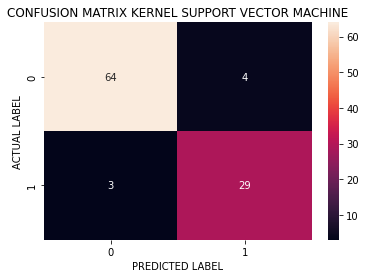

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True)
plt.title("CONFUSION MATRIX KERNEL SUPPORT VECTOR MACHINE")
plt.xlabel("PREDICTED LABEL")
plt.ylabel("ACTUAL LABEL")

In [ ]:
accuracy_score(Y_test, Y_pred)

0.93

#### VISUALIZING THE TRAINING SET

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


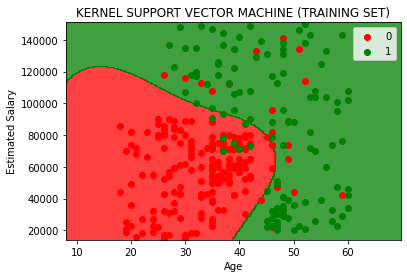

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_train), Y_train.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, KSVM.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("KERNEL SUPPORT VECTOR MACHINE (TRAINING SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


#### VISUALIZING THE TEST SET

/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


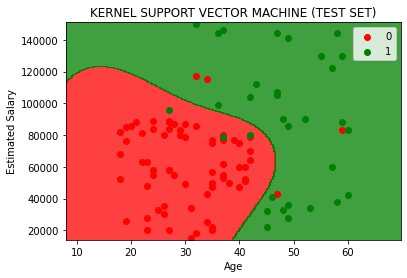

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_test), Y_test.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, KSVM.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("KERNEL SUPPORT VECTOR MACHINE (TEST SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


### PART 18 : NAIVE BAYES CLASSIFICATION

#### INTUITION

##### BAYES THEOREM

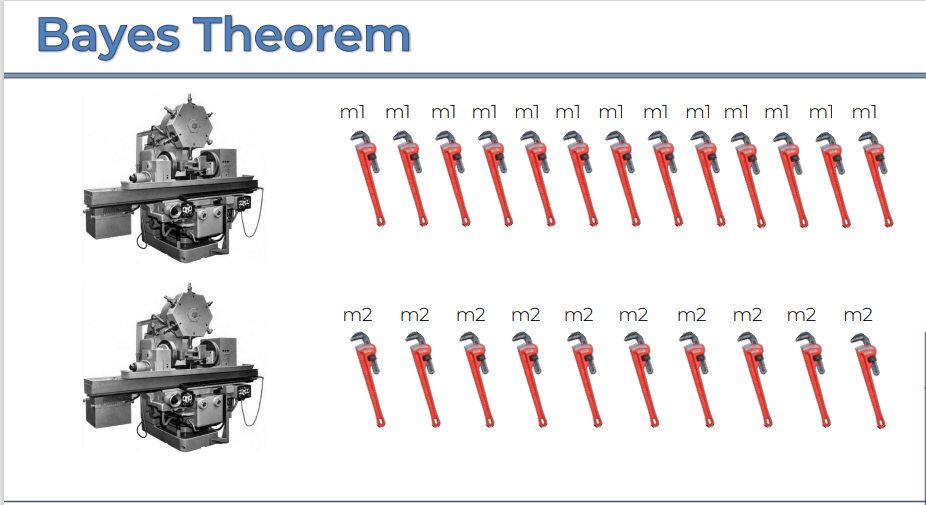

- Let's say that we have **2 machines** that produces **2** different **spanners**.
- **m1 :** are the **spanners** produced from the **machine 1**.
- **m2 :** are the **spanners** produced fom the **machine 2**.

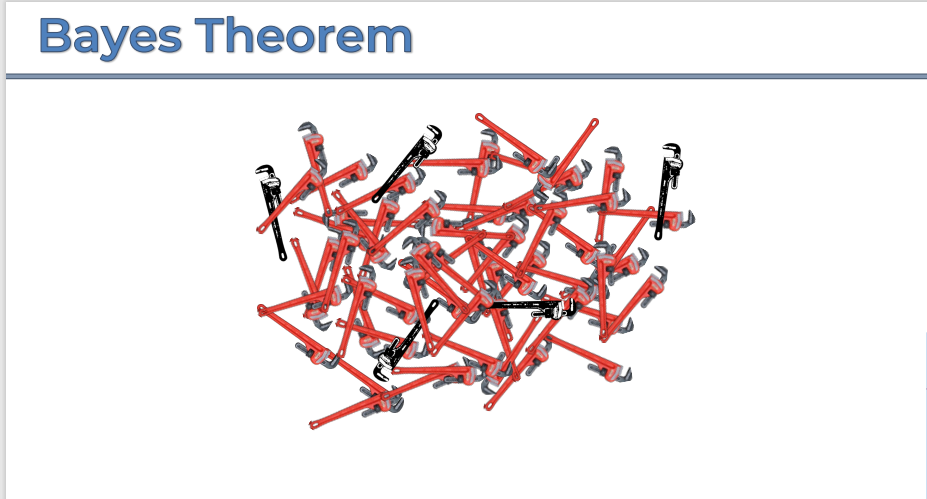

- Now we have al the **Spanner 1** and **Spanner 2** together.
- So now we want to **find** the **defective** **Spanners** among them.

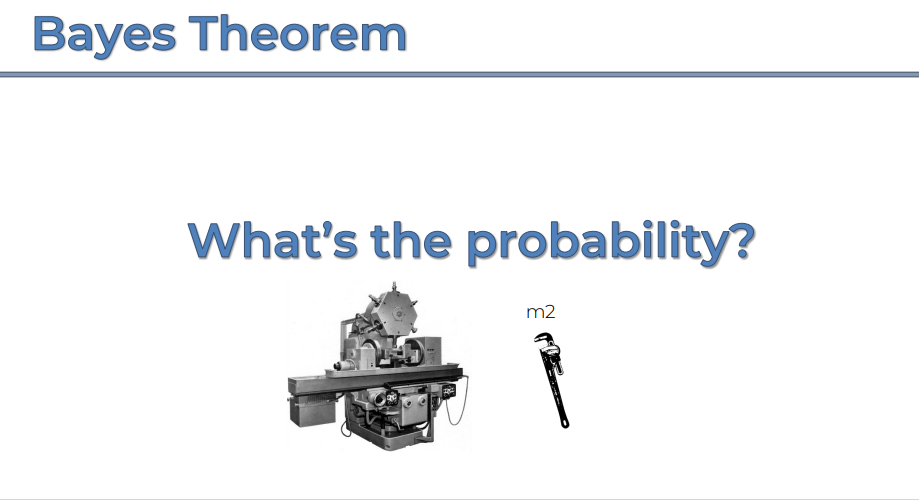

- So now **what** is the **Probability** of **Machine 2** producing a **Defective Spanner**.

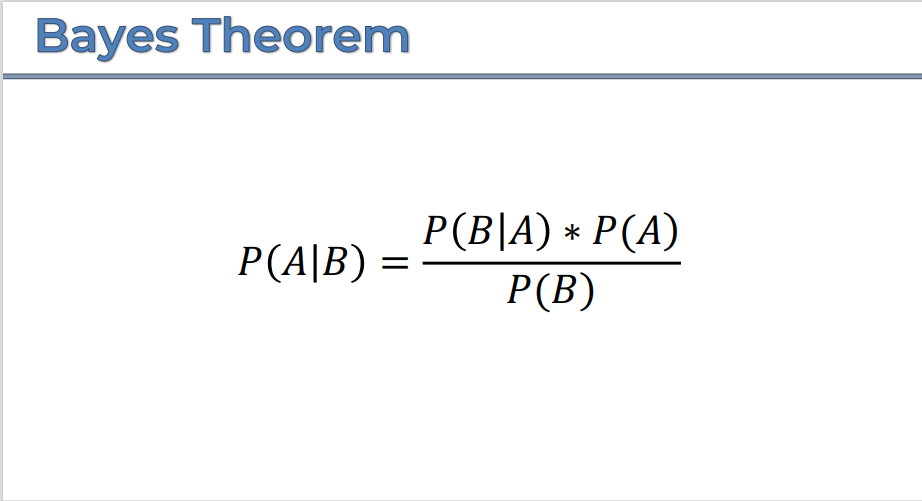

- The **Mathematical** concept of getting this **Probability** is done by using this **Formula** which is called as **Baye's Theorem**.
- And we get the **Pobability** by some iven **Information**.
- And that **Information** will be given **Already**.

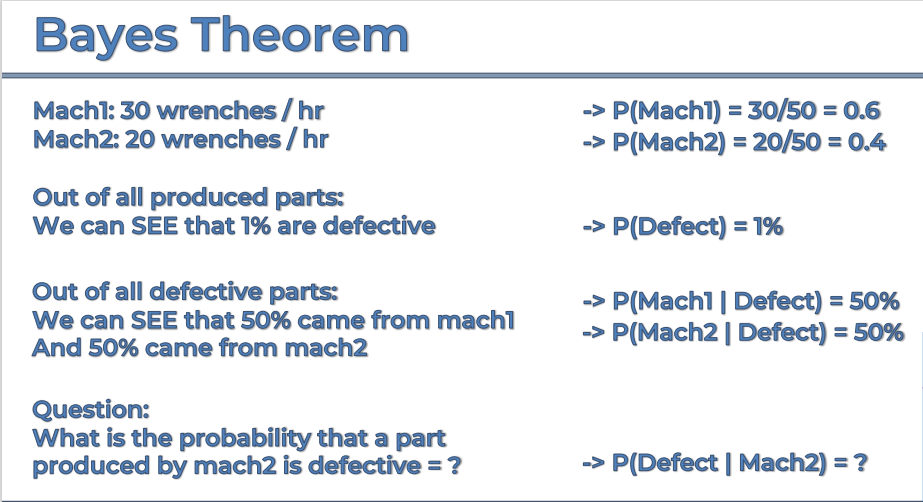

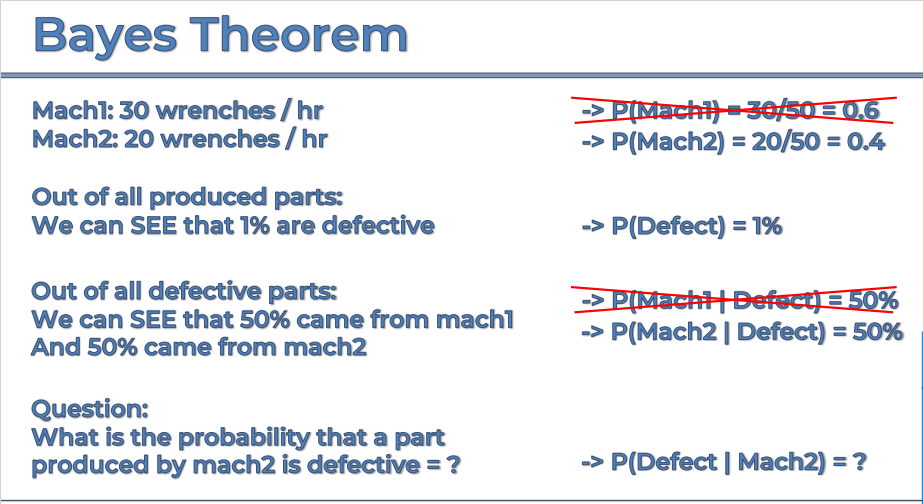

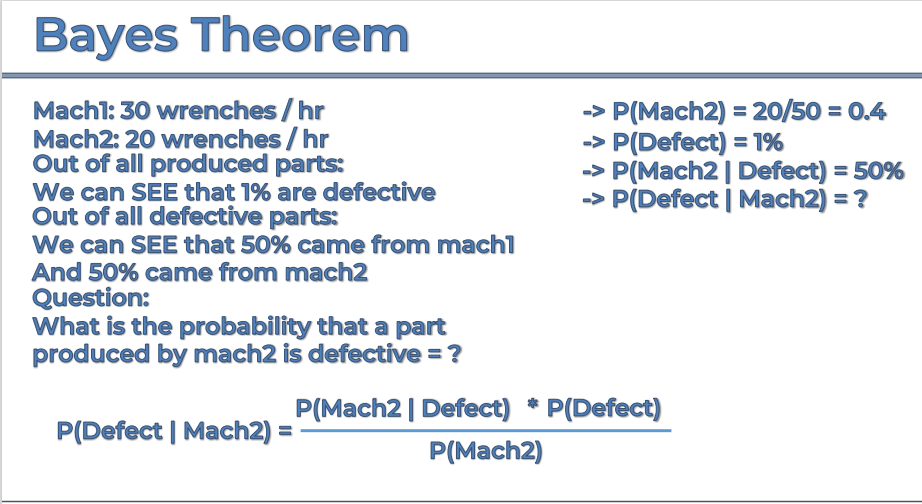

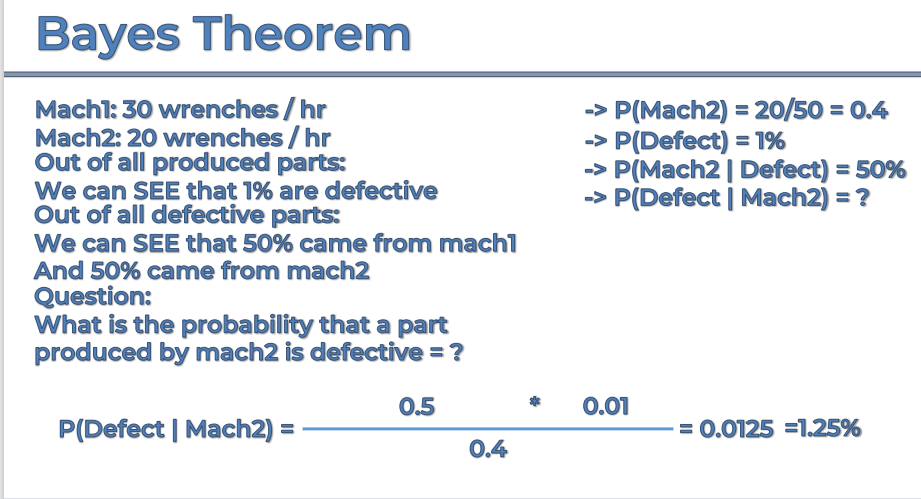

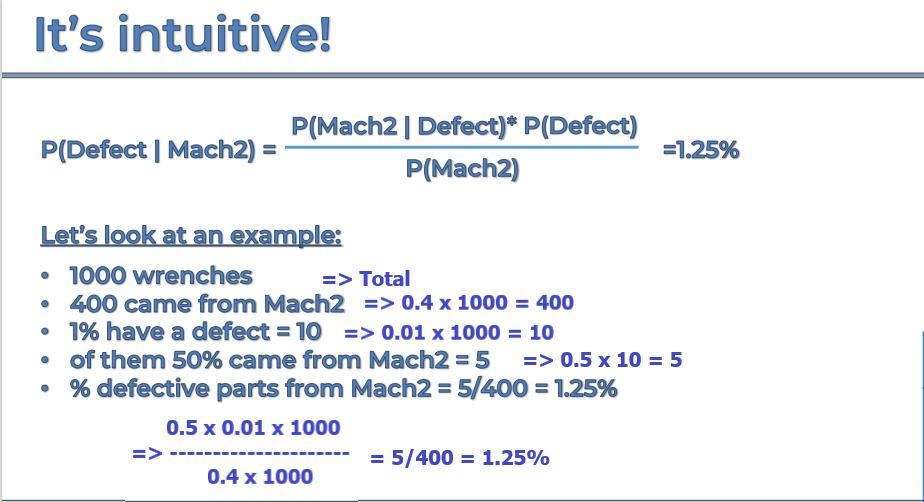

##### NAIVE BAYES CLASSIFIER INTUITION

**BASIC INTUITION :**

Here we have our **Baye's THeorem :**
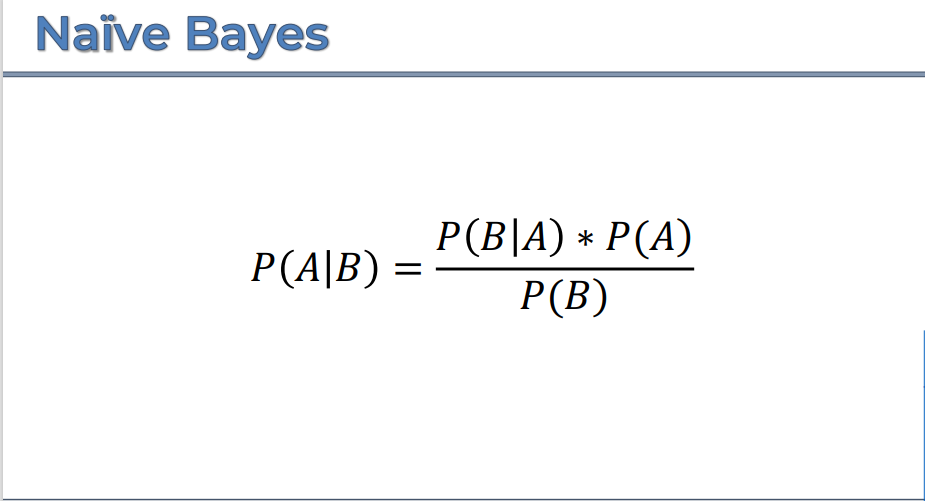

Here we have our **Dataset :**
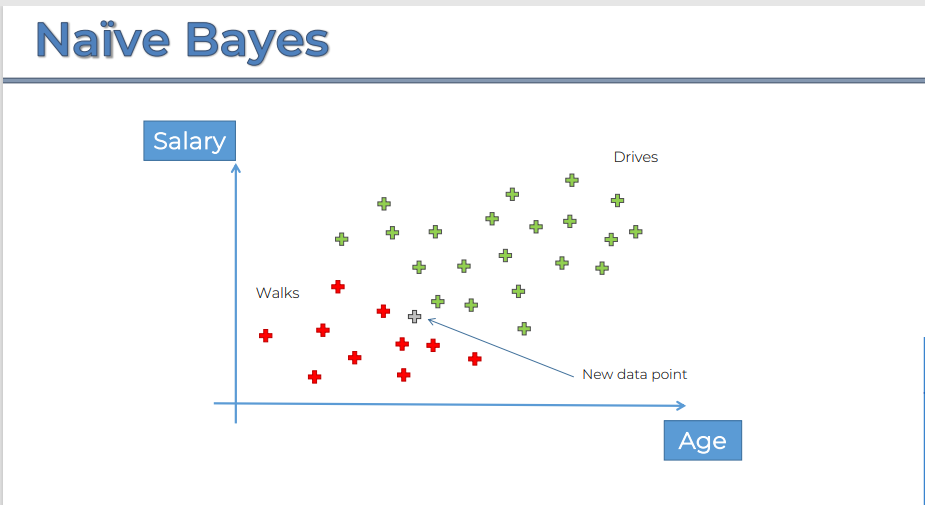

- We are going to caculate the **Bayes Theorem** for both the **Classes**, which is **Walks** and **Drives**.
- **X** is the **Features** of the **Datapoints** in each **Classes**.

**BAYE'S THEOREM FOR WALKS :**
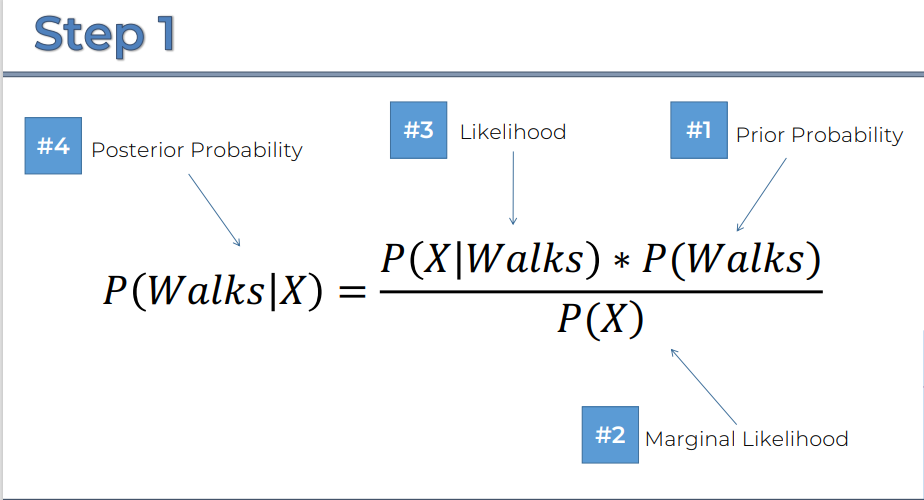

**BAYE'S THEOREM FOR DRIVES :**
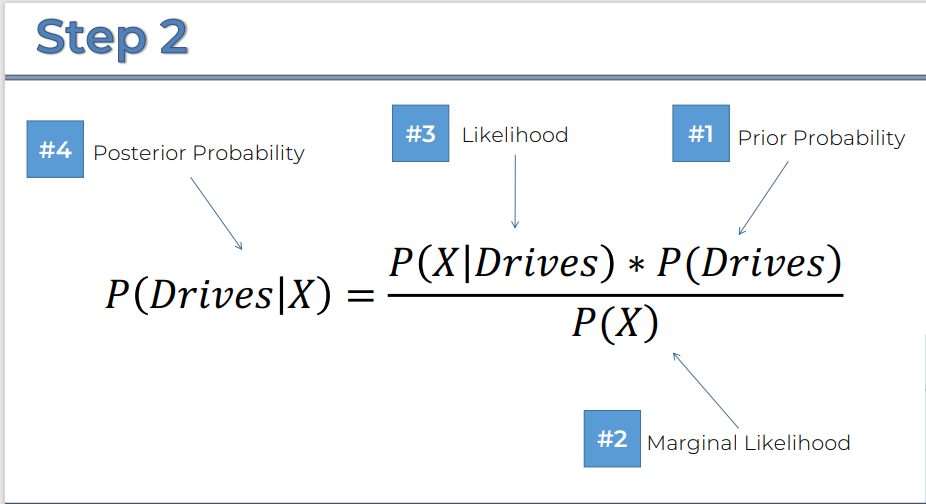

**COMPARE BOTH THE PROBABILITIES : TO DECIDE THE CLASS FOR THE NEW DATAPOINT**
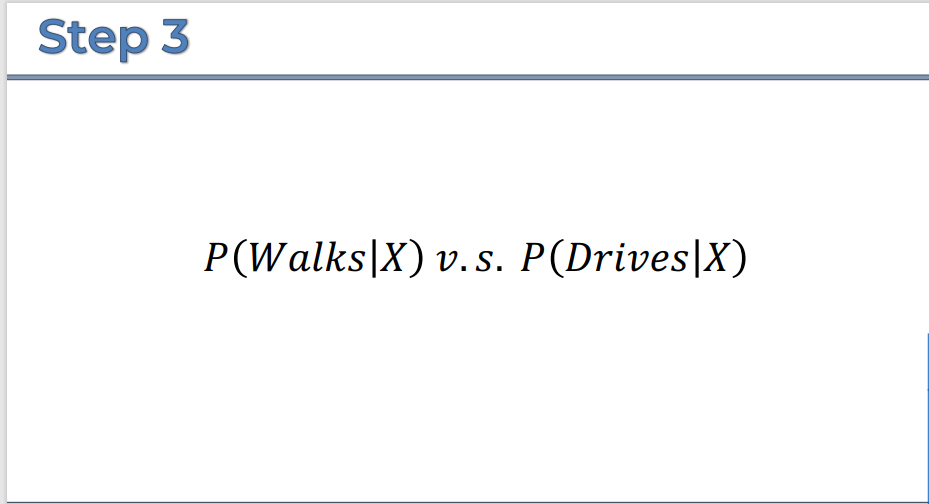


**BAYE'S THEOREM CACULATION FOR WALKS :**

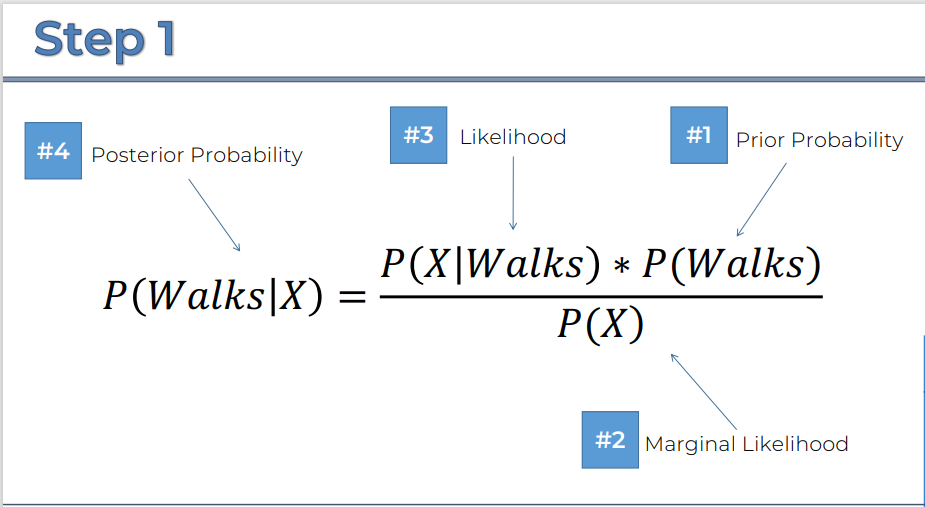

**PRIOR PROBABILITY :**
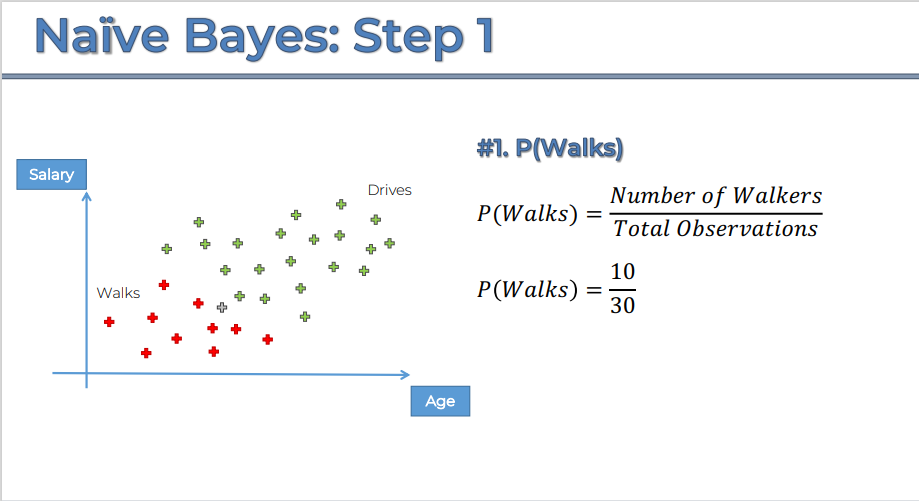

**MARGINAL LIKELIHOOD :**
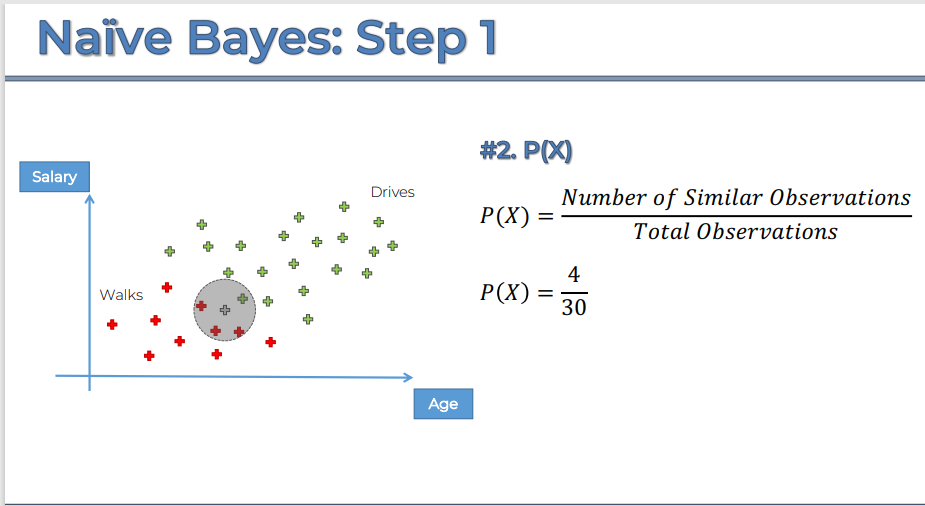

**LIKELIHOOD :**
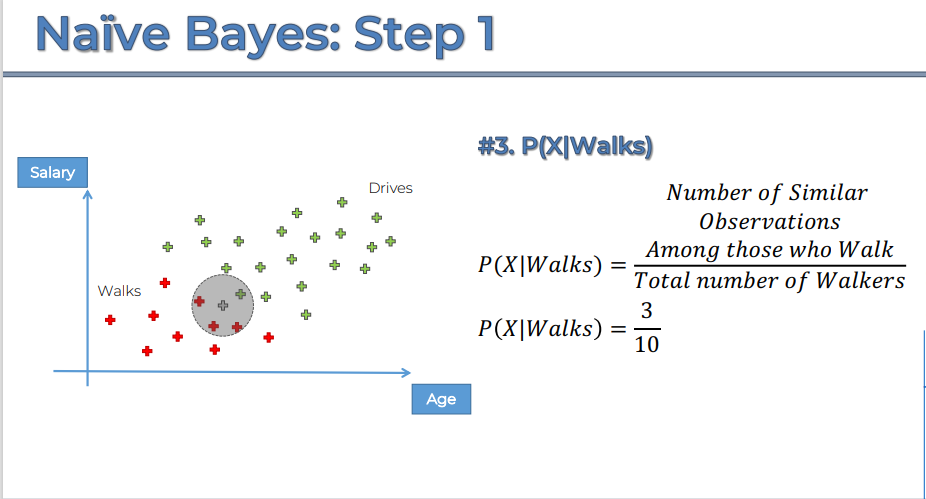

**POSTERIOR PROBABILITY ;**
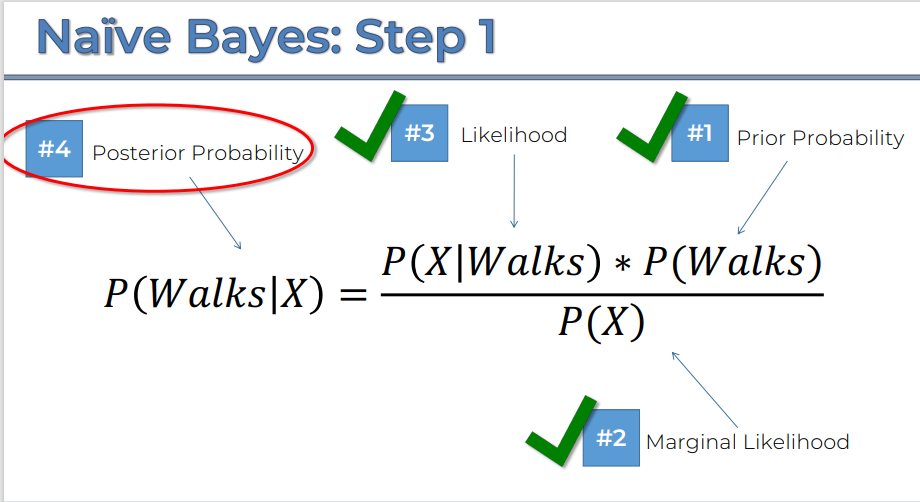

**POSTERIOR PROBABILITY :**
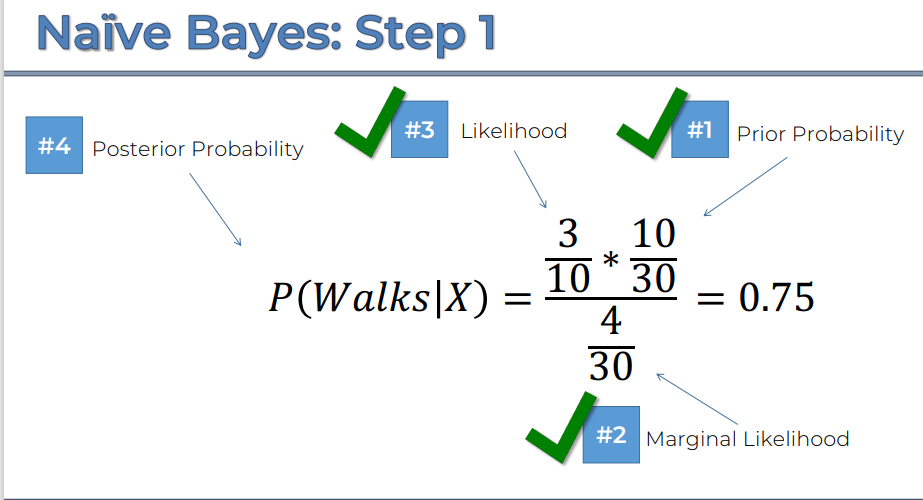

**BAYE'S THEOREM CACULATION FOR DRIVES :**

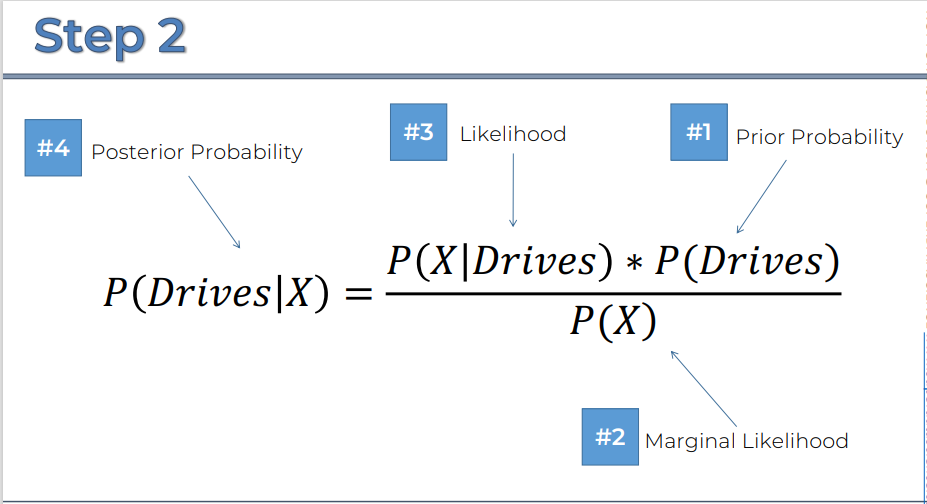

**PRIOIR PROBABILITY :**
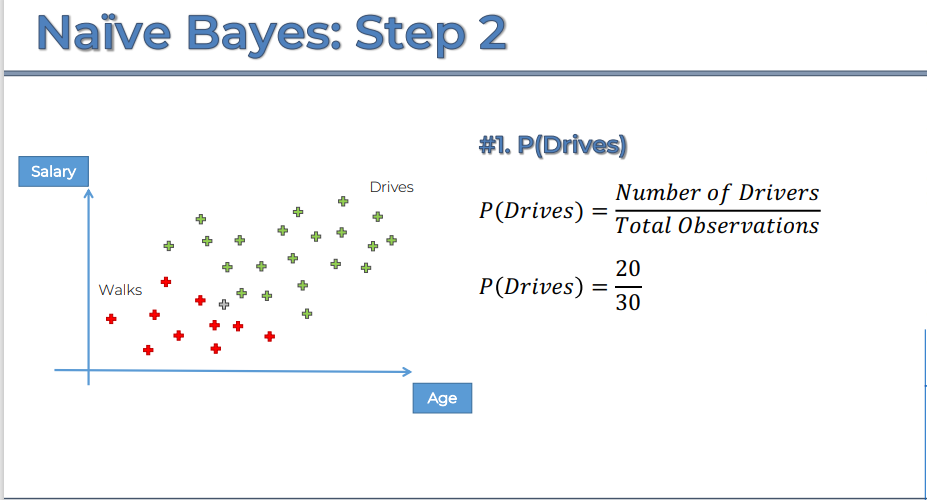

**MARGINAL LIKLIHOOD :**
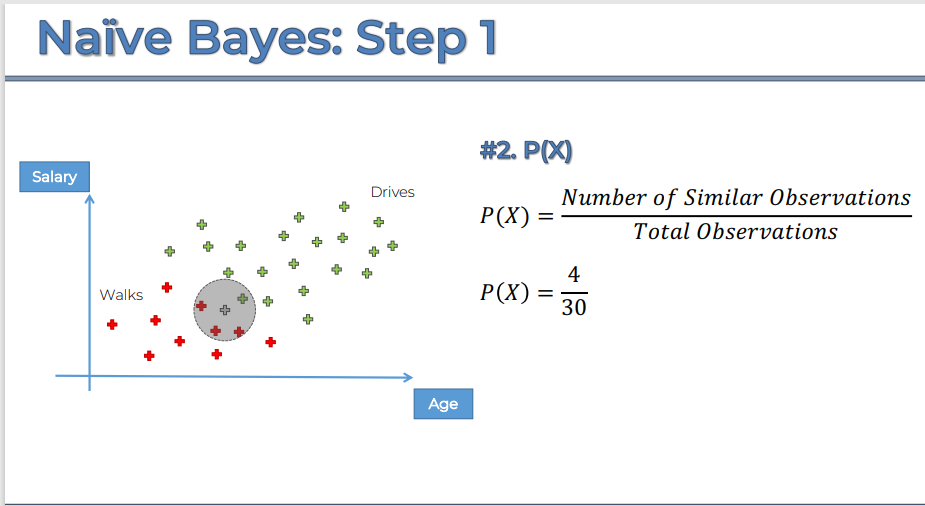

**LIKLIHOOD :**
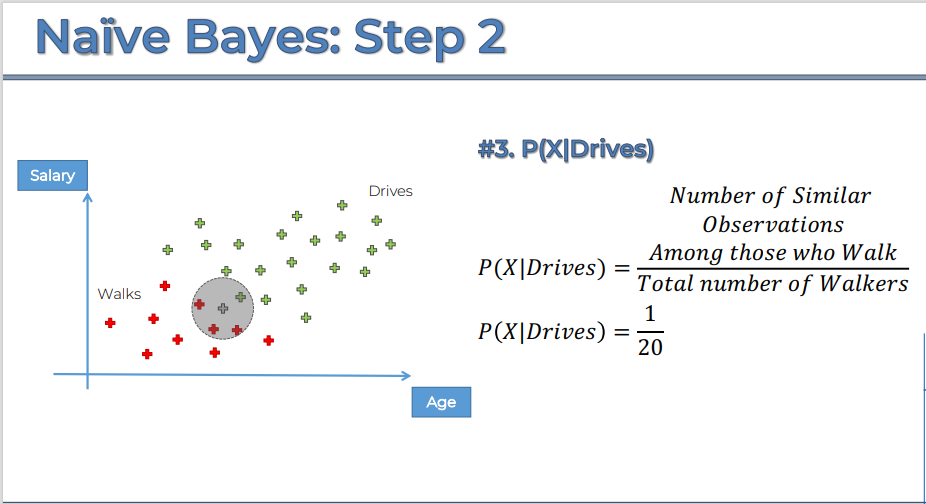

**POSTERIOR PROBABILITY :**
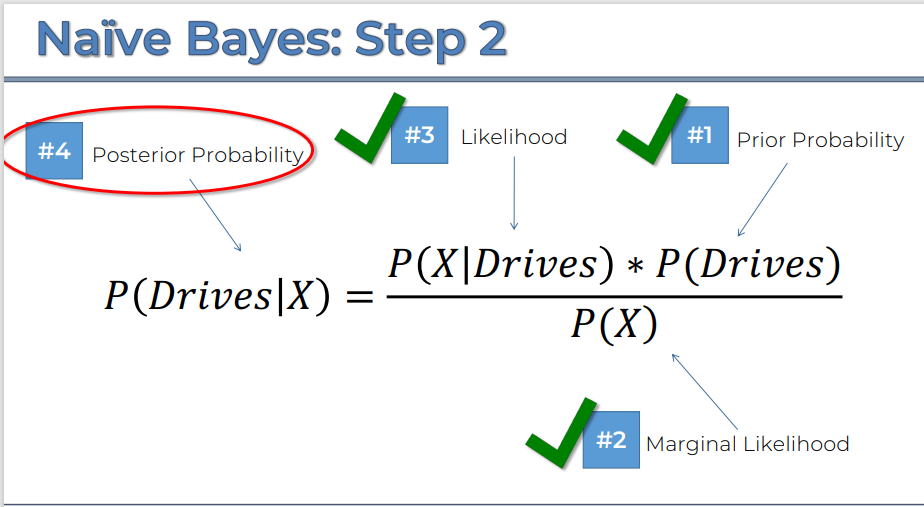

**POSTERIOR PROBABILITY :**
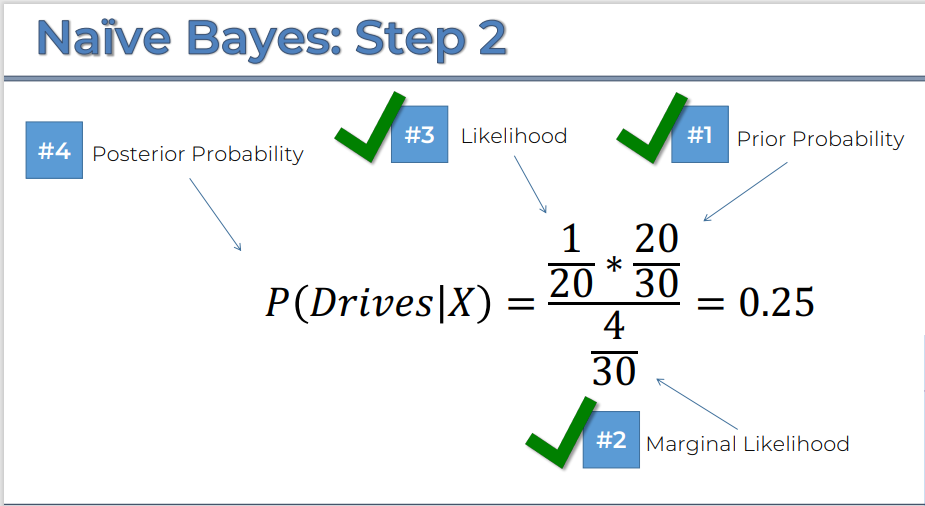

**WALKS V/S DRIVES :**
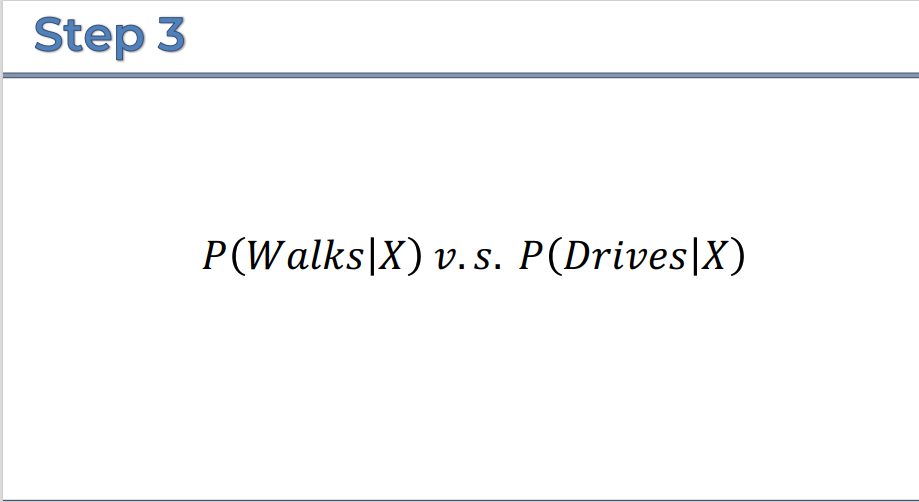

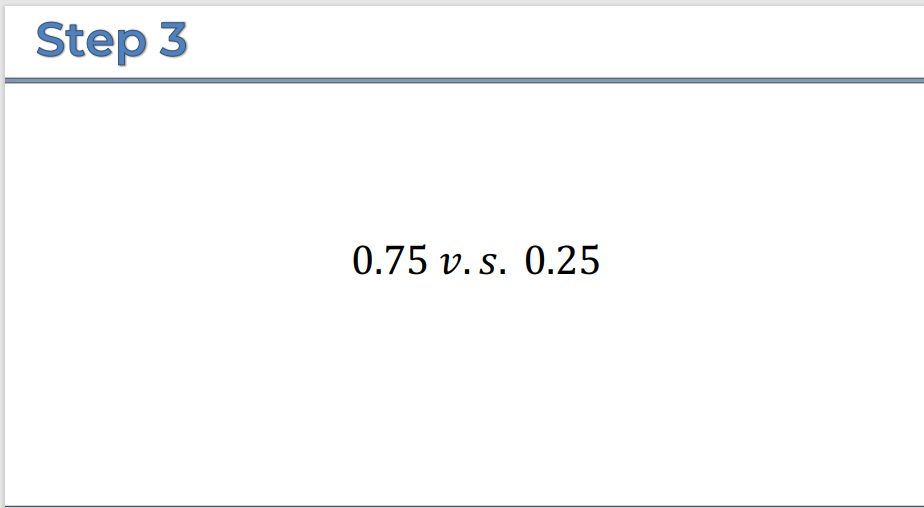

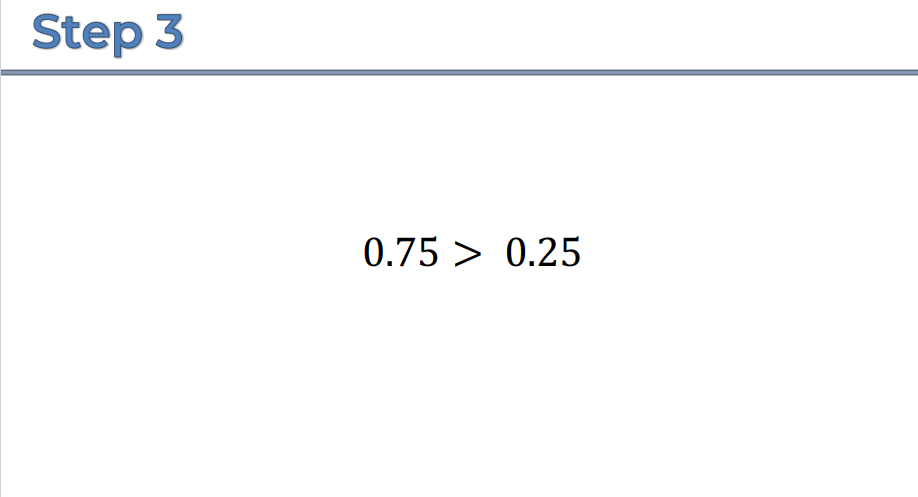

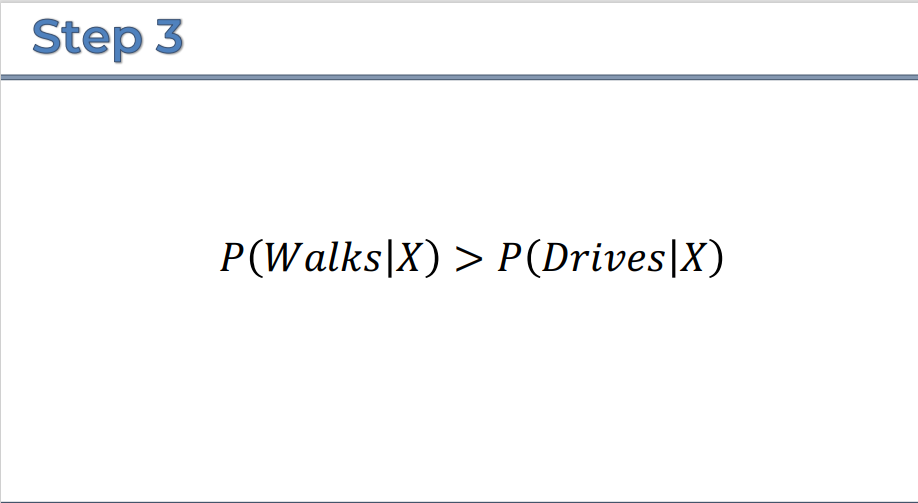

Therefore the **New Data points** will be on the **Class WALK :**
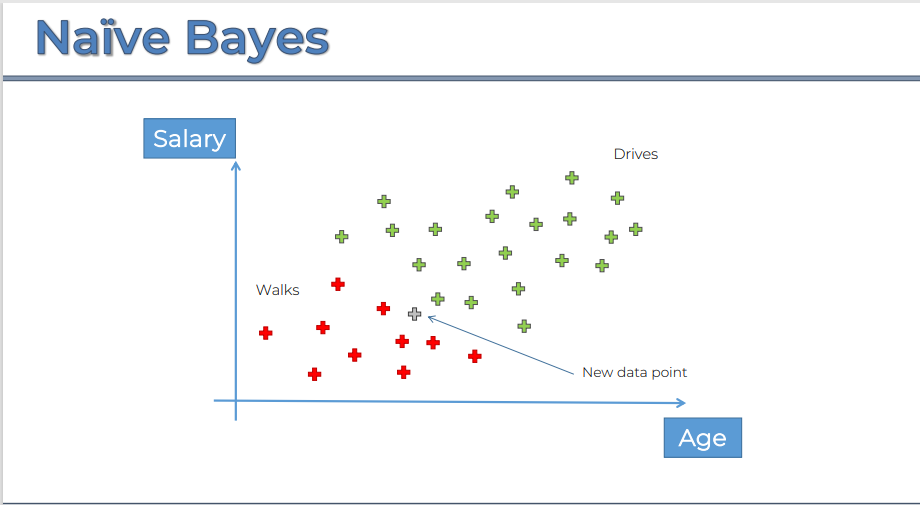

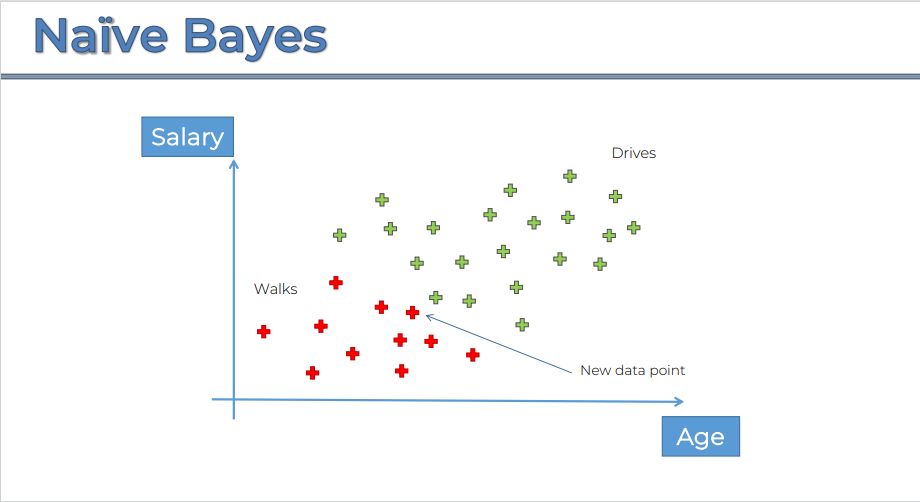

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Social_Network_Ads.csv")
data

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0
...,...,...,...
395,46,41000,1
396,51,23000,1
397,50,20000,1
398,36,33000,0


In [ ]:
X = data.iloc[:, :-1]
X

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000
...,...,...
395,46,41000
396,51,23000
397,50,20000
398,36,33000


In [ ]:
Y = data.iloc[:, -1]
Y

0      0
1      0
2      0
3      0
4      0
      ..
395    1
396    1
397    1
398    0
399    1
Name: Purchased, Length: 400, dtype: int64

#### TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [ ]:
X_train

,Age,EstimatedSalary
250,44,39000
63,32,120000
312,38,50000
159,32,135000
283,52,21000
...,...,...
323,48,30000
192,29,43000
117,36,52000
47,27,54000


In [ ]:
X_test

,Age,EstimatedSalary
132,30,87000
309,38,50000
341,35,75000
196,30,79000
246,35,50000
...,...,...
146,27,96000
135,23,63000
390,48,33000
264,48,90000


In [ ]:
Y_train

250    0
63     1
312    0
159    1
283    1
      ..
323    1
192    0
117    0
47     0
172    0
Name: Purchased, Length: 300, dtype: int64

In [ ]:
Y_test

132    0
309    0
341    0
196    0
246    0
      ..
146    1
135    0
390    1
264    1
364    1
Name: Purchased, Length: 100, dtype: int64

#### FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [ ]:
X_train = pd.DataFrame(sc.fit_transform(X_train), columns = ["Age", "Salary"])
X_train

,Age,Salary
0,0.581649,-0.886707
1,-0.606738,1.461738
2,-0.012544,-0.567782
3,-0.606738,1.896635
4,1.373907,-1.408584
...,...,...
295,0.977778,-1.147645
296,-0.903834,-0.770734
297,-0.210609,-0.509796
298,-1.101899,-0.451810


In [ ]:
X_test = pd.DataFrame(sc.transform(X_test), columns = ["Age", "Salary"])
X_test

,Age,Salary
0,-0.804802,0.504964
1,-0.012544,-0.567782
2,-0.309641,0.157046
3,-0.804802,0.273019
4,-0.309641,-0.567782
...,...,...
95,-1.101899,0.765902
96,-1.498028,-0.190872
97,0.977778,-1.060666
98,0.977778,0.591943


#### TRAINING NAIVE BAYES MODEL (TRAINING SET)

In [ ]:
from sklearn.naive_bayes import GaussianNB
NB = GaussianNB()

In [ ]:
NB.fit(X_train, Y_train)

GaussianNB()

#### PREDICTING A NEW RESULT (FROM TEST SET)

In [ ]:
print(NB.predict(sc.transform([[30, 87000]])))

[0]


/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


#### PREDICTING TEST SET

In [ ]:
Y_pred = NB.predict(X_test)
Y_pred

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1])

In [ ]:
Y_pred = pd.DataFrame(Y_pred, columns = ["Purchased Predicted"])
Y_pred

,Purchased Predicted
0,0
1,0
2,0
3,0
4,0
...,...
95,0
96,0
97,1
98,1


#### COMPARING PREDICTION VS ACTUAL 

In [ ]:
Test_Set = X_test.join(pd.DataFrame(np.array(Y_test)))
Test_Set

,Age,Salary,0
0,-0.804802,0.504964,0
1,-0.012544,-0.567782,0
2,-0.309641,0.157046,0
3,-0.804802,0.273019,0
4,-0.309641,-0.567782,0
...,...,...,...
95,-1.101899,0.765902,1
96,-1.498028,-0.190872,0
97,0.977778,-1.060666,1
98,0.977778,0.591943,1


In [ ]:
Compare_Data = Test_Set.join(Y_pred)
Compare_Data

,Age,Salary,0,Purchased Predicted
0,-0.804802,0.504964,0,0
1,-0.012544,-0.567782,0,0
2,-0.309641,0.157046,0,0
3,-0.804802,0.273019,0,0
4,-0.309641,-0.567782,0,0
...,...,...,...,...
95,-1.101899,0.765902,1,0
96,-1.498028,-0.190872,0,0
97,0.977778,-1.060666,1,1
98,0.977778,0.591943,1,1


#### MAKING CONFUSION MATRIX

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(Y_test, Y_pred)
cm

array([[65,  3],
       [ 7, 25]])

**VISUALIZING CONFUSION MATRIX :**

Text(33.0, 0.5, 'ACTUAL LABEL')

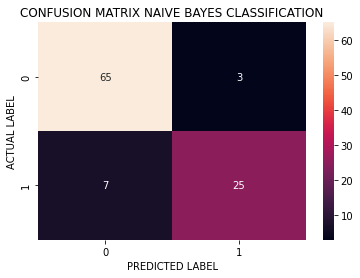

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True)
plt.title("CONFUSION MATRIX NAIVE BAYES CLASSIFICATION")
plt.xlabel("PREDICTED LABEL")
plt.ylabel("ACTUAL LABEL")

In [ ]:
accuracy_score(Y_test, Y_pred)

0.9

#### VISUALIZING THE TRAINING SET

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(
<ipython-input-26-a11e5eba87c0>:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)


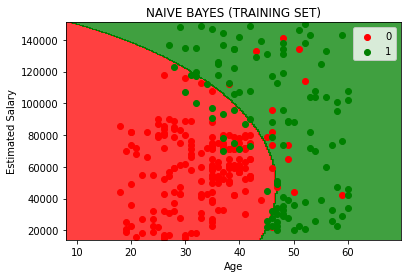

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_train), Y_train.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, NB.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("NAIVE BAYES (TRAINING SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


#### VISUALIZING THE TEST SET

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(
<ipython-input-27-99a107865e5f>:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)


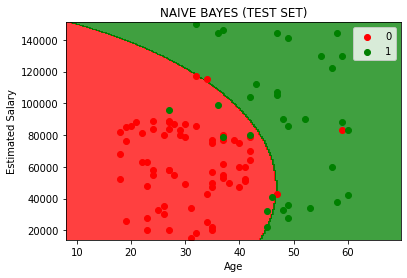

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_test), Y_test.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, NB.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("NAIVE BAYES (TEST SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


### PART 19 : CLASSIFICATION MODEL SELECTION

##### CONFUSION MATRIX

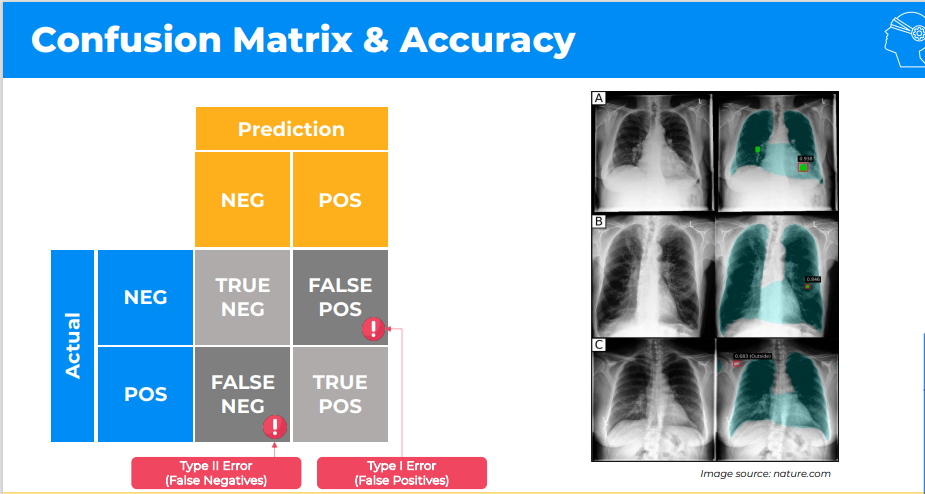

- **TYPE 2 ERROR** is far **Dagerous** than **TYPE 1 ERROR**.

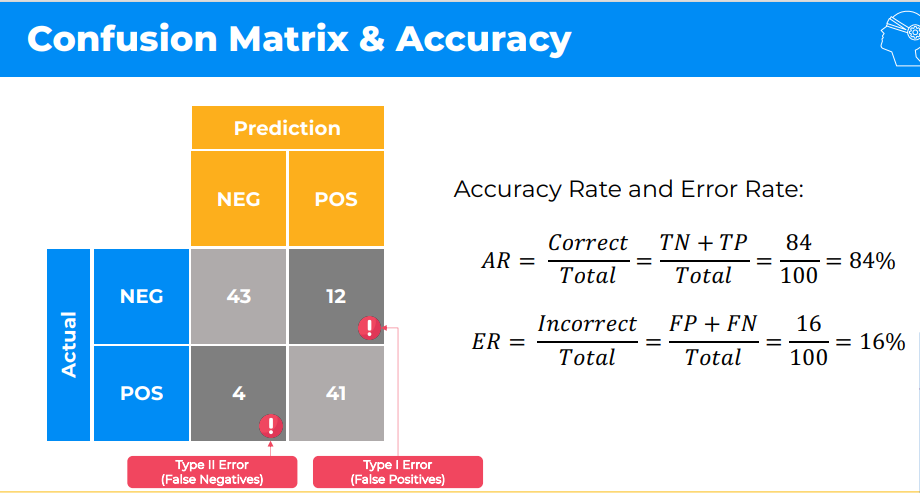

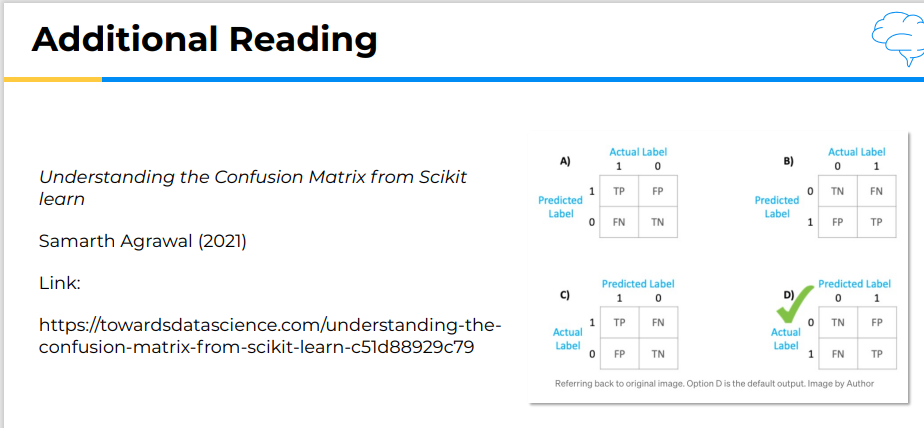

##### ACCURACY PARADOX

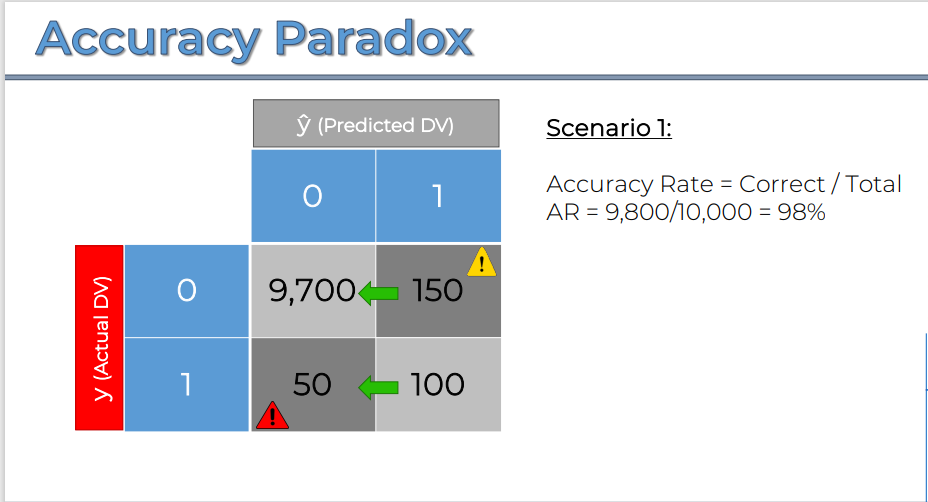

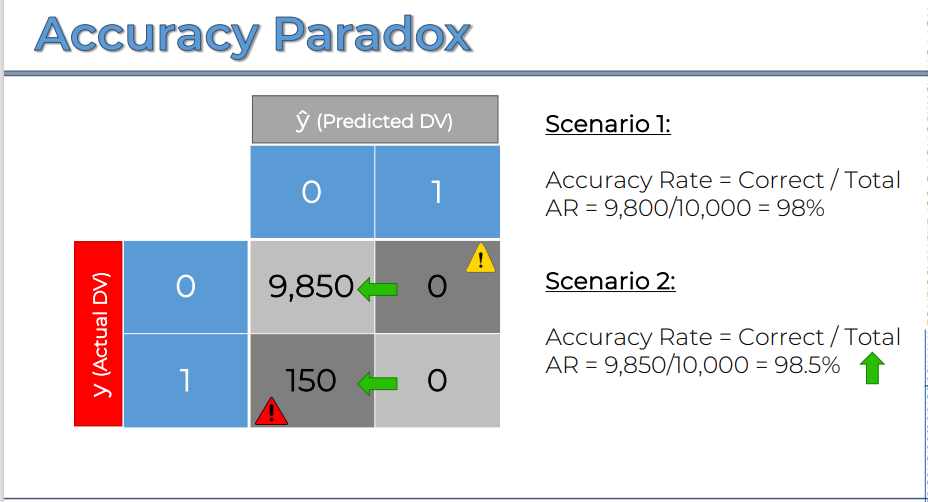

- SO if **Random Prediction** is made the **Accuracy Rate** tends to **Increase** on some **Point**.

### PART 20 : EVALUATING CLASSIFICATION MODEL PERFORMANCE

##### CAP CURVE ANALYSIS : CUMMILATIVE ACCURACY PROFILE

###### INTUTION

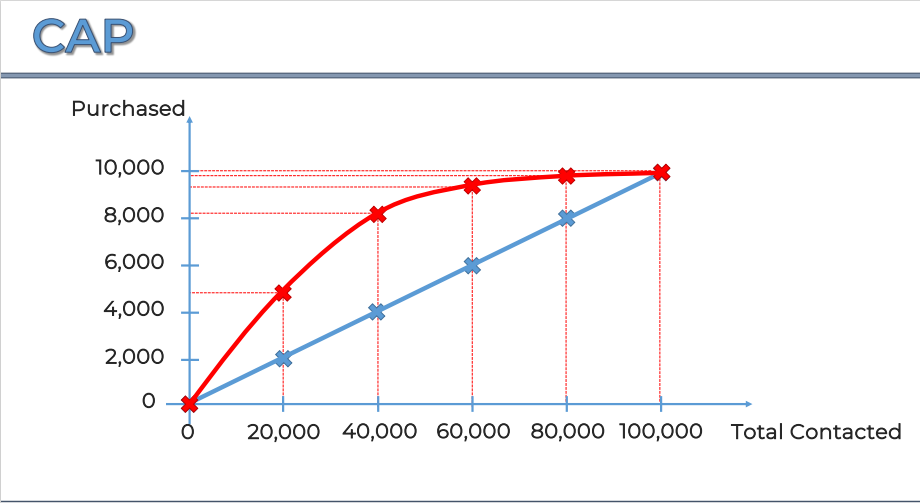

- **Blue Line :** is the **Line** generated on the basis of the **Assumptions** in **Linear Prediction** of the **Model** to the **Data Points**.
- **Red Curve :** is the **Curve** generated on the basis of the **Actual Prediction** of the **Model** to the **Data Points**.

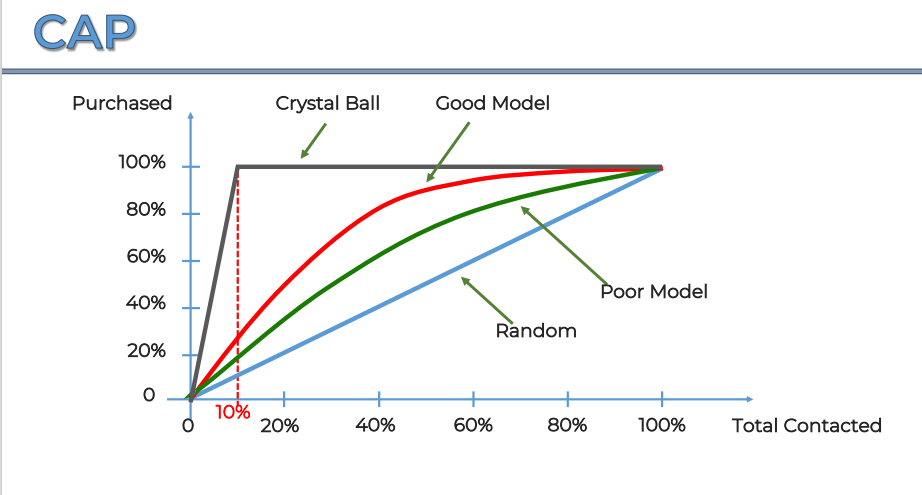

- **Random Model :** It is nothing but it is the **Blue Line** as we stated before.
- **Good Model :** As the **Increase** in the **Area** between the **Radom Model** and the **Red Curve**.
- **Poor Model :** It is the **Vice-Versa** of the **Good Model**, AS th **Decrease** in **Area** between the **Random Model** and **Red Curve**
- **Crystal Ball :** It is also called as **Perfect Model**, The **Line** is **Geerated** on the basis of the **Exact Prediction** of the **Class**.It exactly takes as many **Number** of **Tries** for the **Perfect Model** to **Identify** the exact **Number** of **Data Points** in the specific **Class**.

**CAP ANALYSIS FORMULA :**
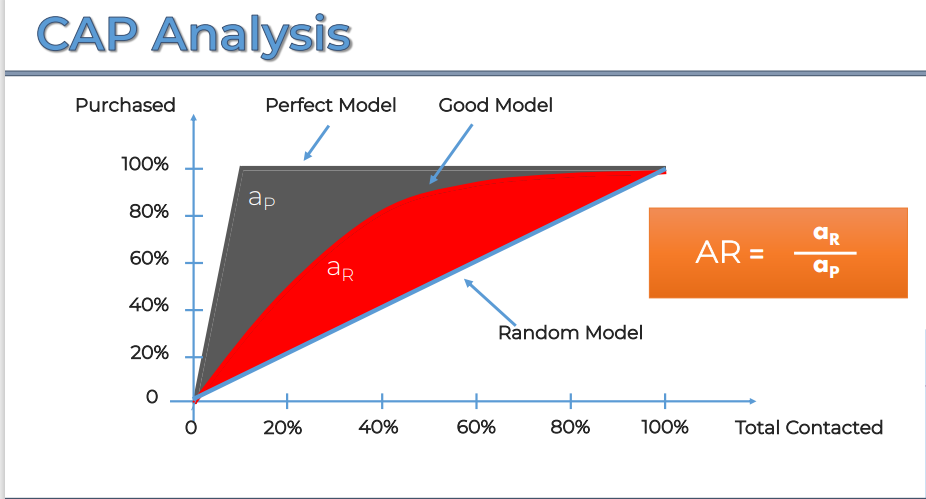

**ASSUMPTIONS OF CAP ANALYSIS :**
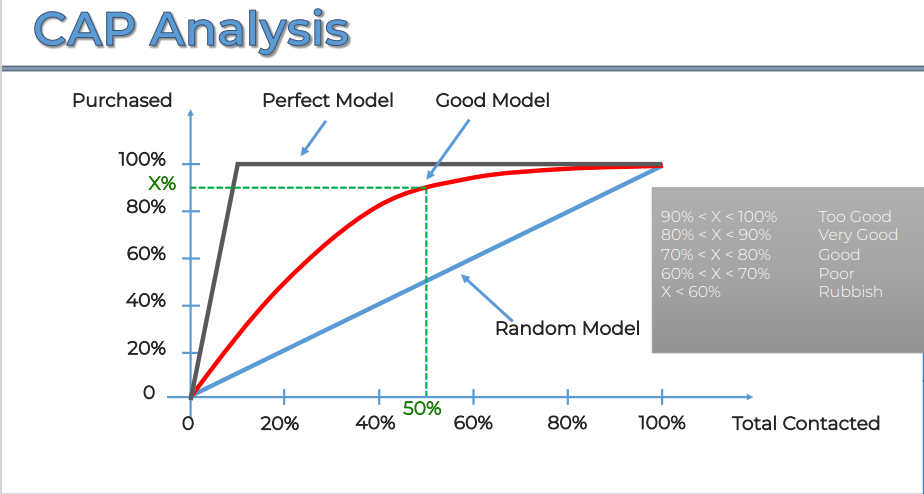

##### PROS and CONS OF CLASSIFICATION MODELS

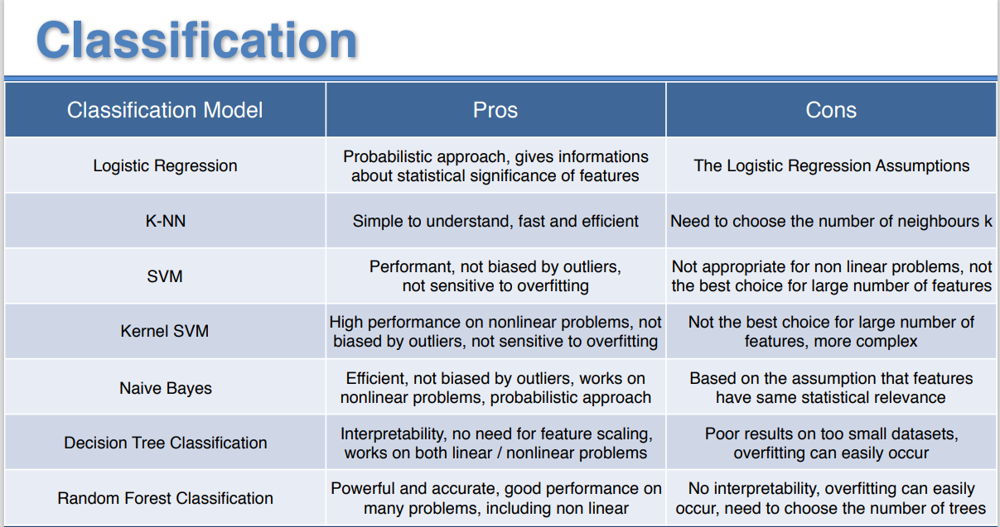

### .
----

## CLUSTERING :

### INTRODUCION

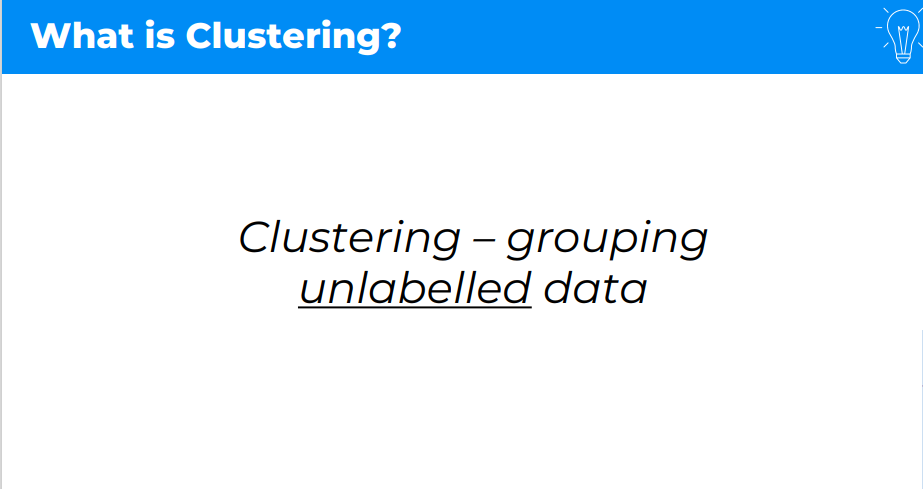

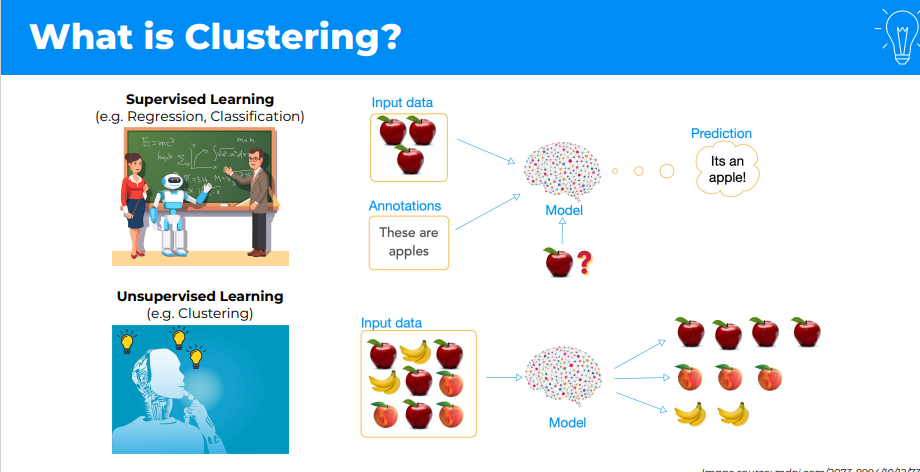

- In **Superwised Learning** we always have some **Training Data** and we will try to find out the **Answer** for the **New Data Point**.
- In **Superwised Learning**, we give a **Chance** to the **Model** to **Train** where it has **Asnwers**.
- In **Unsuperwised Learning**, here we will be having a **Bunch** of **Data** and we are **Unknown** with the **Categories** and **Classes**, We supply this to the **Model** adn it **Groups** the **Data** based on the **Similarities**.
- In **Unsuperwised Learning** we don't have **Answers** to **Train** the **Data**.

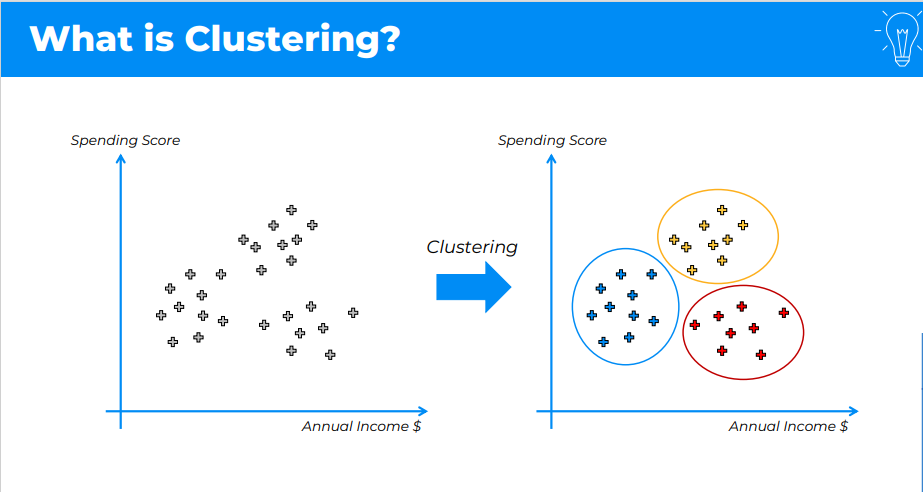

- Now we have **X** and **Y** axis.
- **X - Annual Income**
- **Y - Spending Score**
- **Scatter Plot** looks like this.
- As we dont have any pre-existing **categories** or **Classes** to Classify the **Data**.
- So by applying **Clustering**, it will show us the **Group** of **Data**, where the **Data** in the each **Clusters** are **Grouped** based on the certai **Similarities**.

### PART 21 : K-MEANS CLUSTERING

#### INTUITION

##### K-MEANS CLUSTERING WORKING BASICS

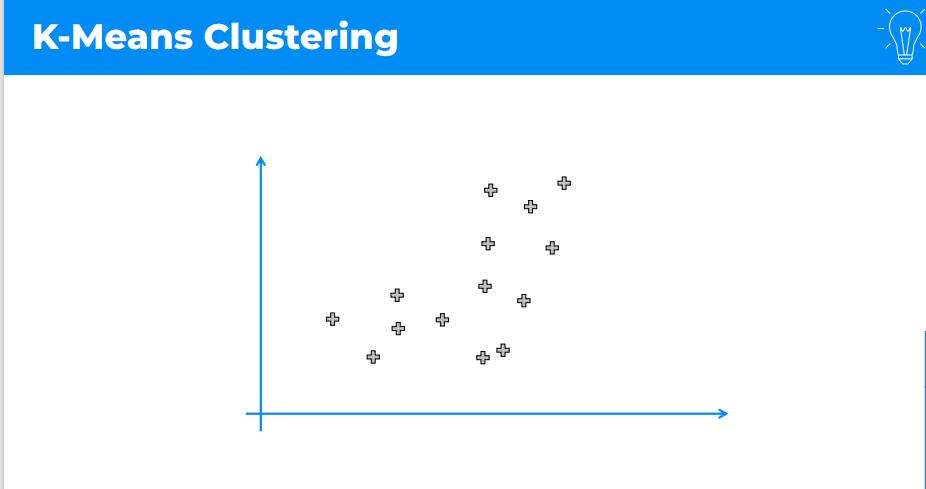

- We have **Scatter Plot** of our **Data Set**.
- We don't have the **Categories** or **Classes** of the **Dataset**.

**STEP 1 :** We have to **Decide** how many **Clusters** we want.
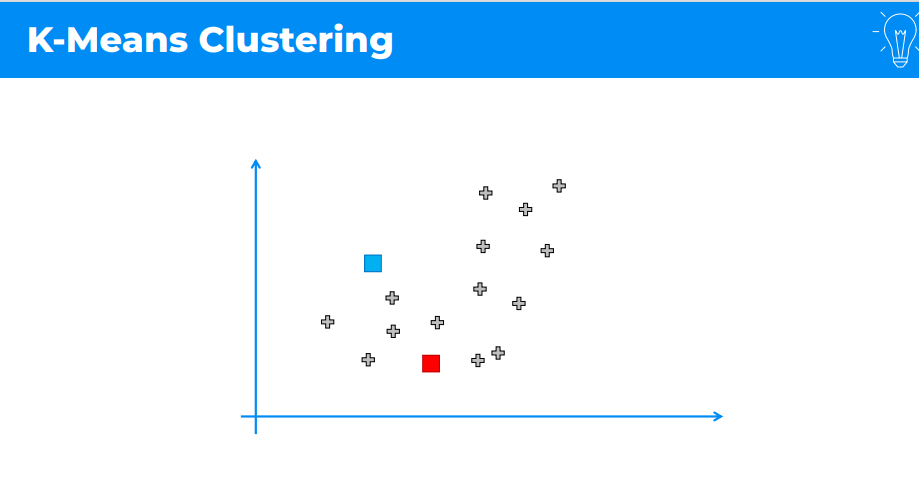

- In this case we want **2 CLusters**.
- So in each **Clusters** we will place **2 Random Cluster Centroid**.


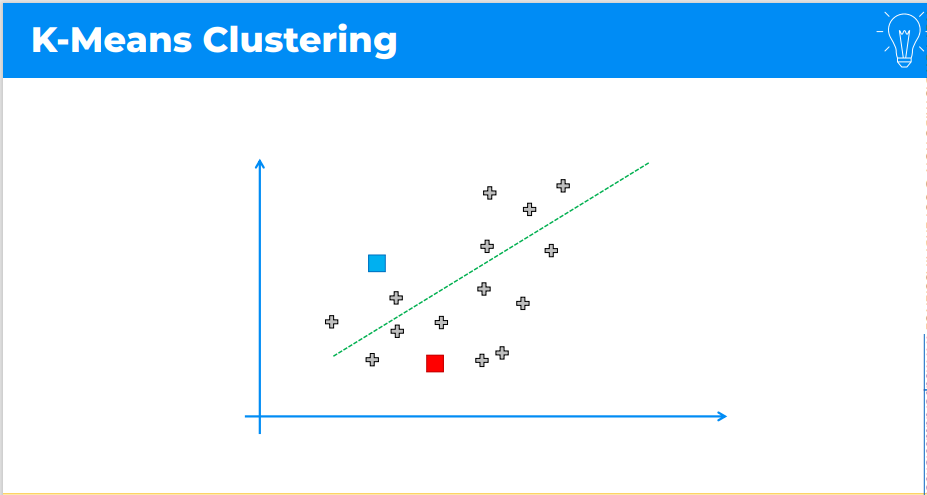

- So the **Algorithm** asssigns the **Cluster** that are closest **Centroids**.
- In this case it is easily done by drawing **Equidistant Line**.
- This line states that everything **Above** the line are **Blue Class** and everything below are **Red Class**.

**STEP 2 :** We will be **Caculating** the **Centre of Mass** or **Centre of Gravity** that we identified.
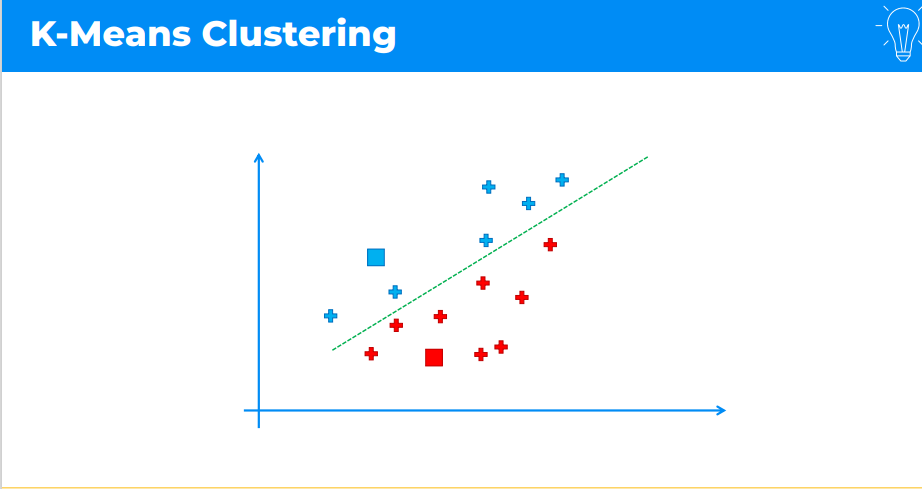

- So fo the **Blue Cluster** we will take all the **X-Coordinte** and **Average** them, Similarly we will also take all th e**Y-Coordinate** and **Average** them.
- Now this will give us the place for **Centre of Mass**.

**STEP 3:** Then we will ove the **Centroids** to those **Position**.
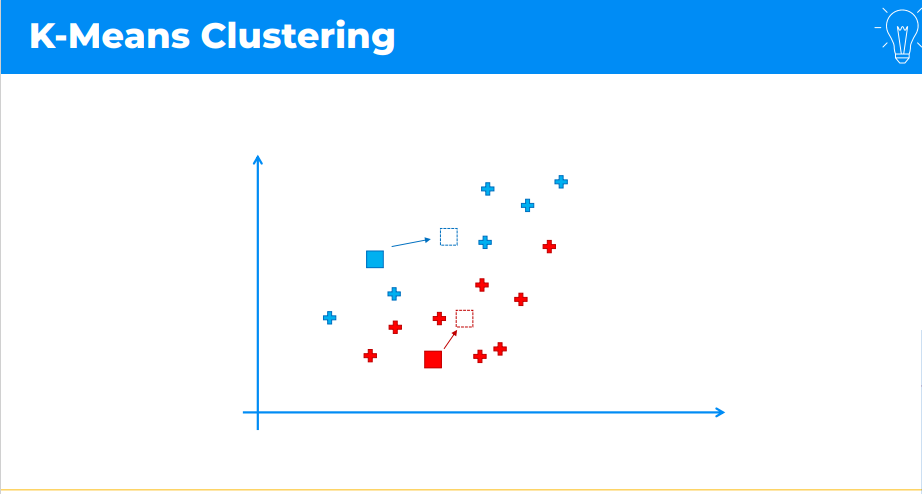

- Then it will **Re-Assign** the **Data Points** to the **New centroid**.
- New **Equidistant Line** is **Drawn** and again we **Re-Position** the **Data** and **Repeat** the steps.


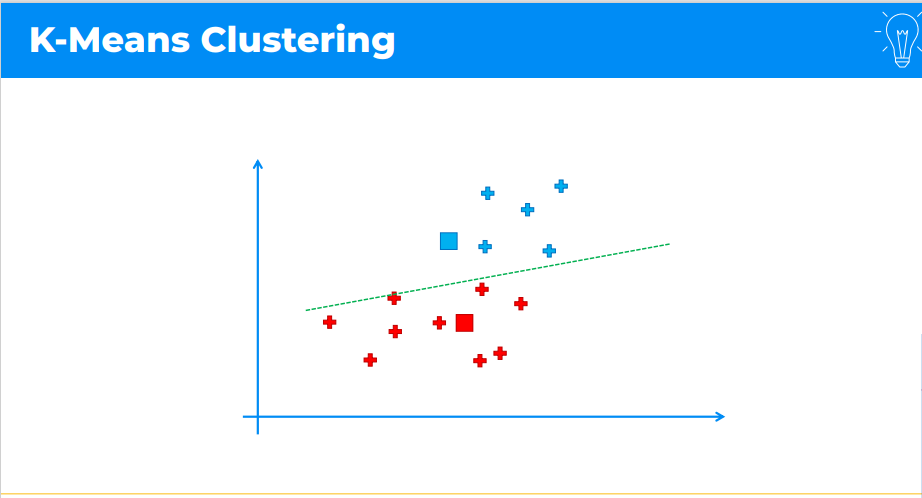

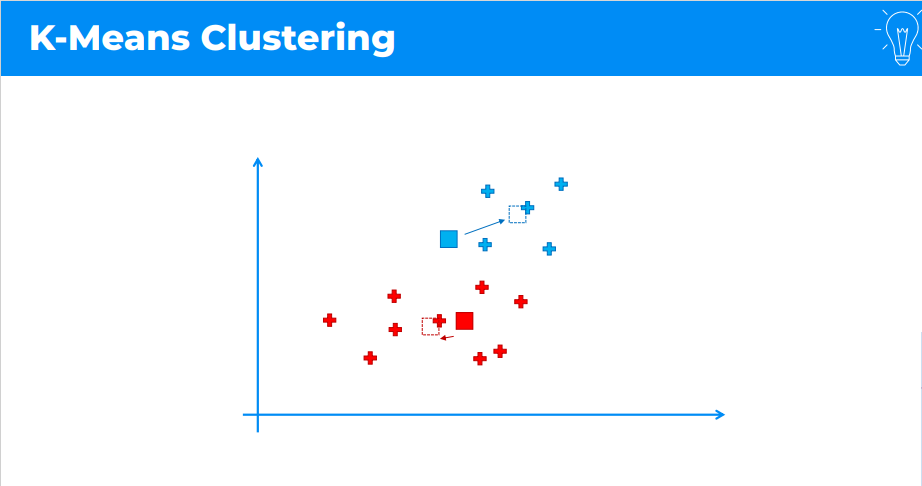

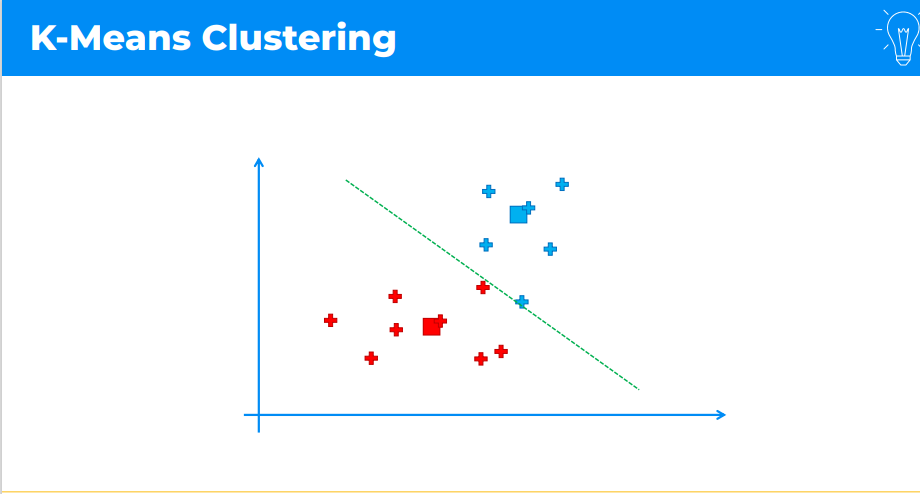

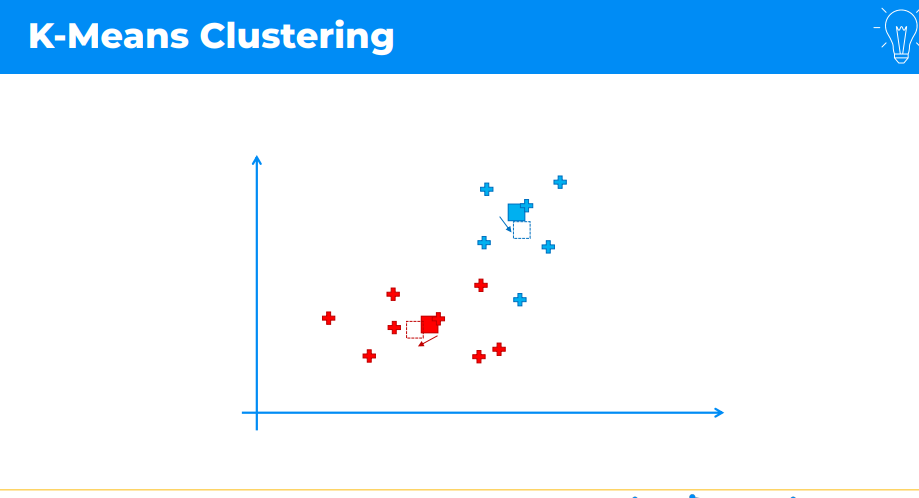

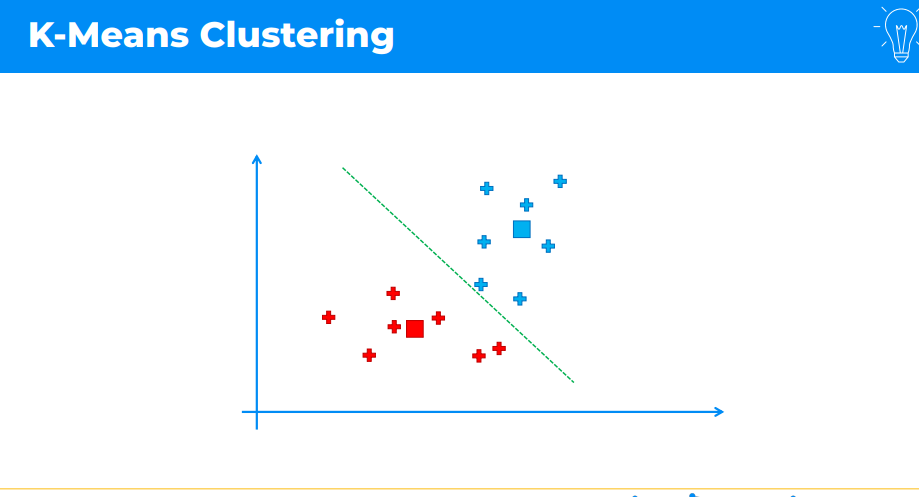

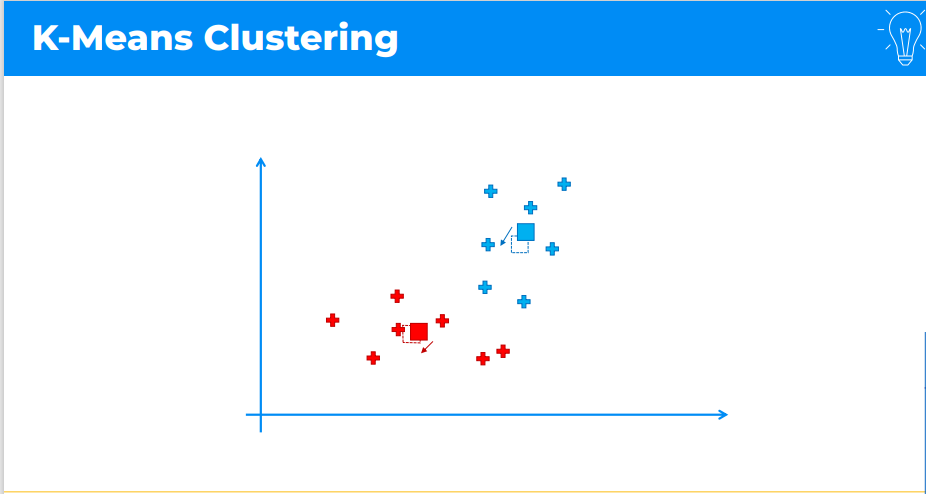

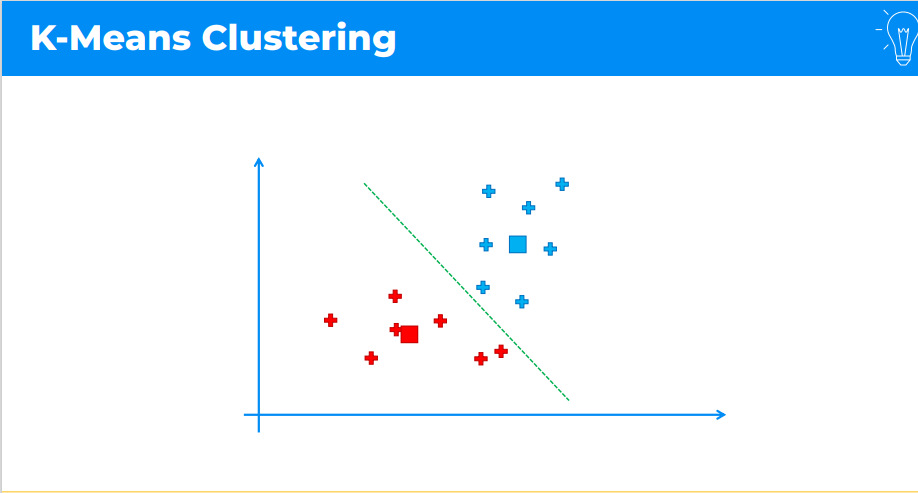

- The Process is **Repeated** until the situation where doing this process again and again won't **Change** the **Positioning** of the **Clusters**.

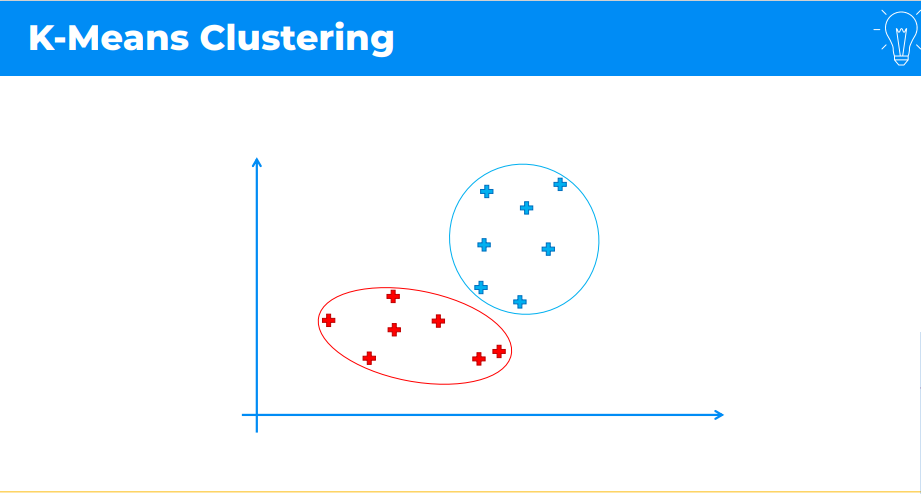

##### ELBOW METHOD

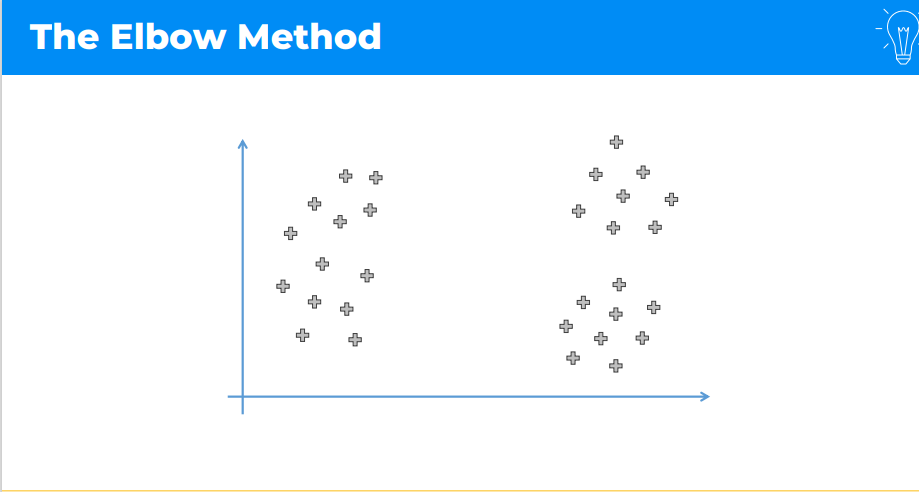

- **K-Means Clustering** works on many **Dimensions**.
- So **Elbow Method** helps us to **Decide** and **Select** the number of **Clusters**.
- And this is the **very First Step** in the **Clustering**.
- Soetimes the **Decision** is doen on the **Basis** of the **Domain Knowledge** of the **Problem**.

**EQUATION :**
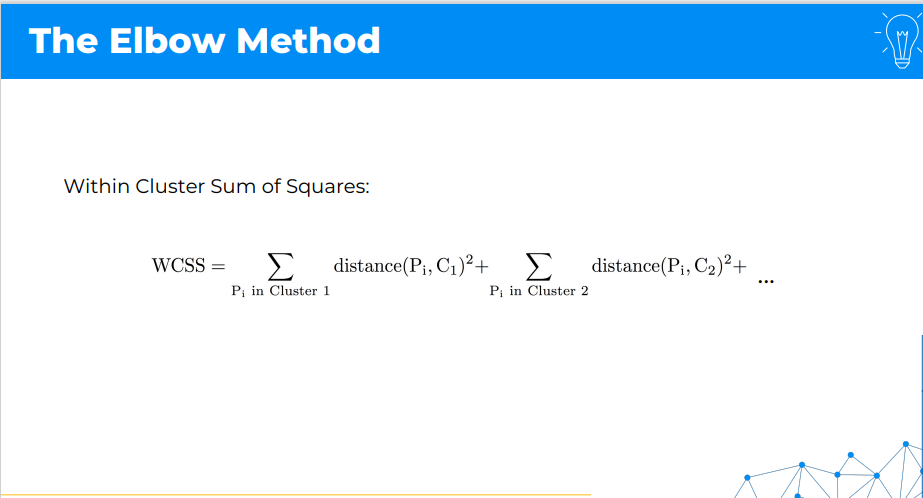

- **WCSS - Withi Cluster Sum of Square.**
- **C1 and C2 - Centroid of Clusters** (Cluster 1 and Cluster 2 in this case).
- **Pi - Data Points**.

Here are some **Visual Representations** of the **Clusters**.
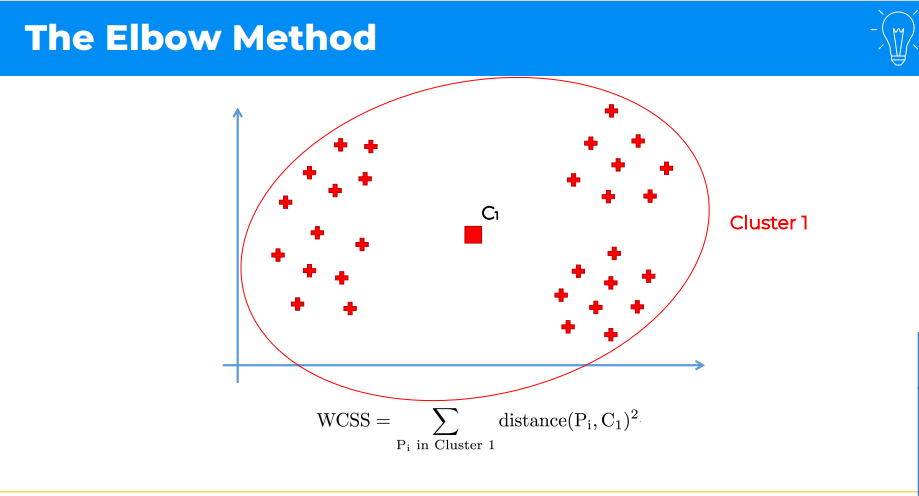

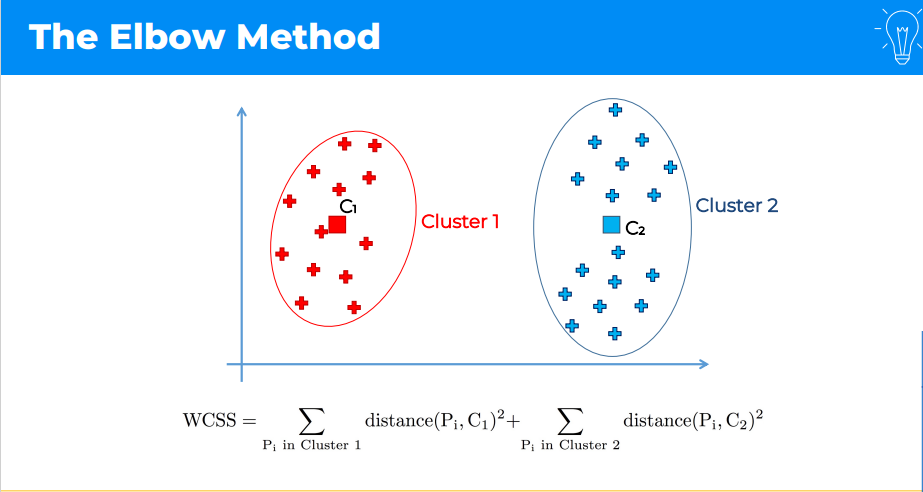

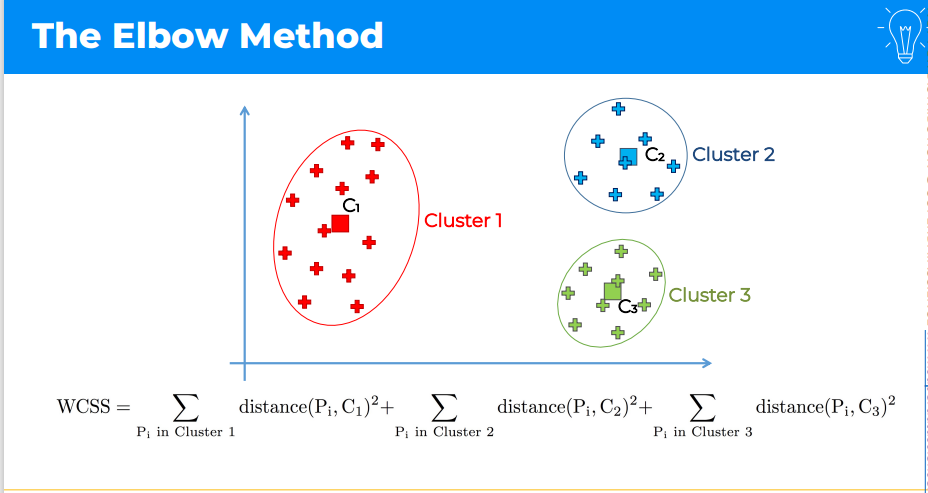

- The more **Clusters** we have **Smaller** the **Value** of the **WCSS** becomes.
- SO t **Caculate** the all the **Different** values for **WCSS**, we need **Clusters** to **Exist**.
- So **Everytime** we need to **Run** the **Clustering Algorithm** then we **Caculate** the **Value** for the **WCSS**.
- So in this **Case** it is kind of **Backward**, we don't do the **Elbow Metod** at **First** to do **Clustering** with **K-Means**.
- Instead we do **K-Means** for **Many Times** and find the **WCSS** for every **Setup**. 

** CHART FOR ELBOW METHOD :**
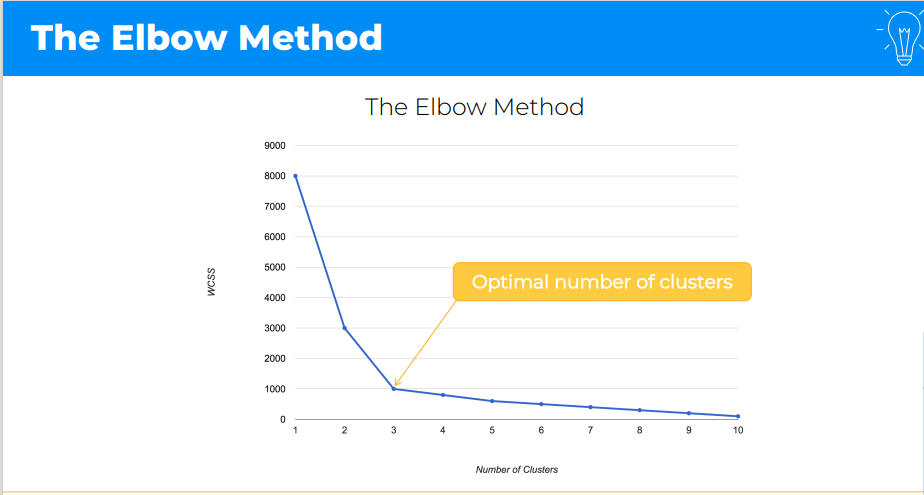

- Here is the **Chart** for the **Elbow Method**.
- **Optimal Number** is **Chosen** on the basis of **Drop** in the value of **WCSS**.

##### K-MEANS_++

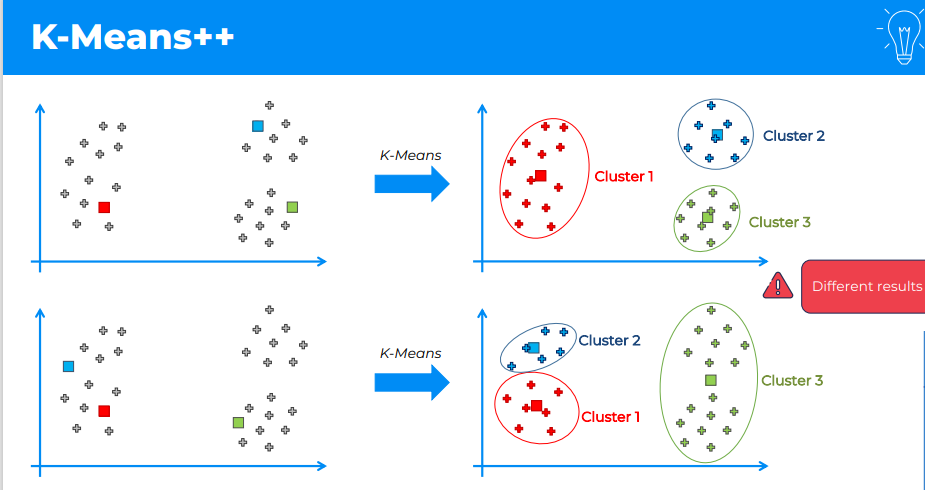

- We have a **Dataset**.
- Let's apply **K-Means Algorithm**.
- Let's **Intialize** the **Centroids** with the **RandomVariable**, and in this **Case** its **3**.
- So once the **Algorithm** is applied, we will end up with **3 Clusters**.
- But the **Problem** of **Initializing** wit the **Random Variable(3)** is that, There might be **Possibilities** that we might get **Different Centroid Positions**.
- So if we see the **Above Image**, we can clearl say **Both** the **Clustering Methods** are not **Same**.
- This is called **Random Intialization Trap**.

**RANDOM INTIALIZATION TRAP :**
- It is a **Bad Sign**.
- Because the **Model** is **Meant** to **Tell** us something about the **Business**.
-  So the **Insights** are not **Dependent** on the **Random Initialization**.
- So to **Avoid** this **Trap** design of been **K-Means ++** is made.

**STEPS FOR K-MEANS ++ INITIALIZING :**
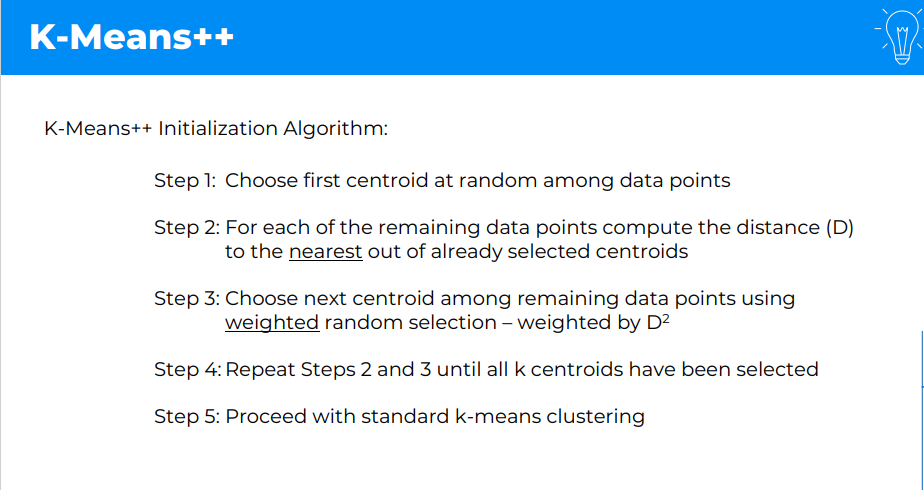

**STEP BY STEP INITIALIZATION PROCESS :**
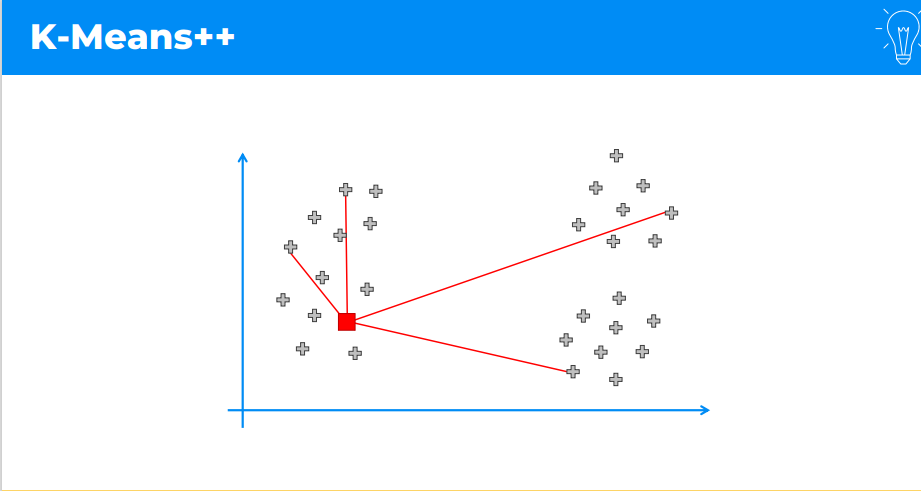

- **K-Means** will do the **Measuring** the **Distance** from **Every** remaining **Data Points** to the **Centoid**.
- Now it will take the **Value** of the **Distance** and **Square** them.
- Next **Centroid** will be the **Random Selection**. But will be **Based** on the **Value** of the **Weighted Squared Distance**.

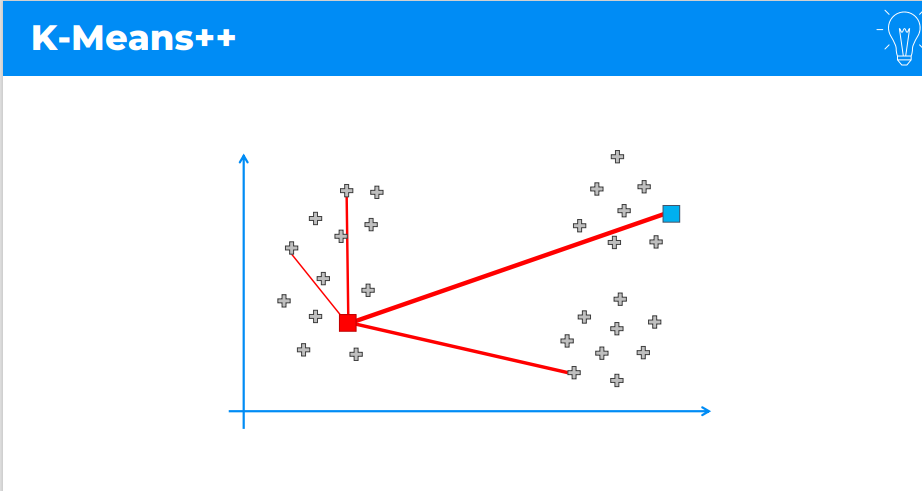

- Similarly this happens for **New Centroid Point**.

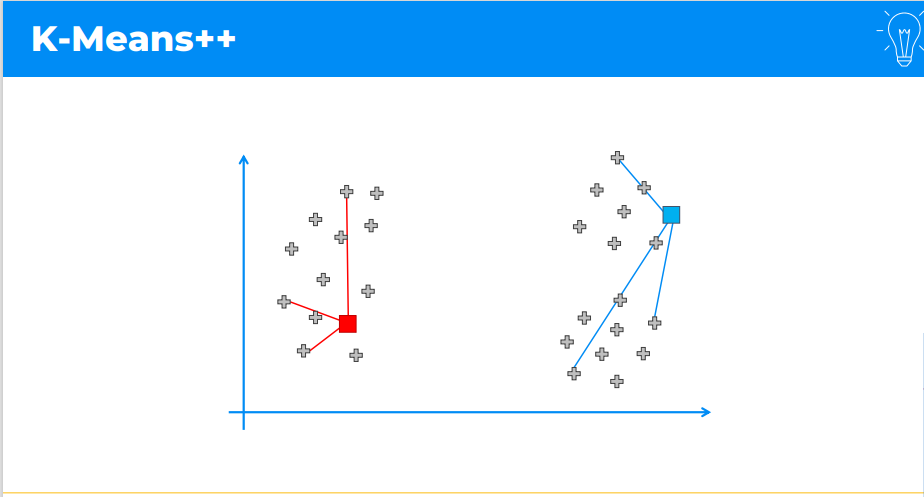

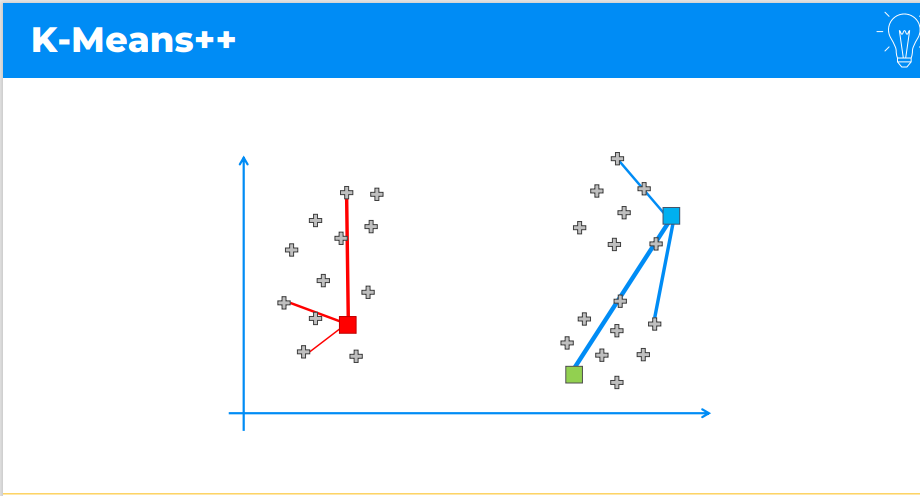

- So after finding the **Centroids** through te **Process** we will be able to get the **Clusters** for our **Datat**.

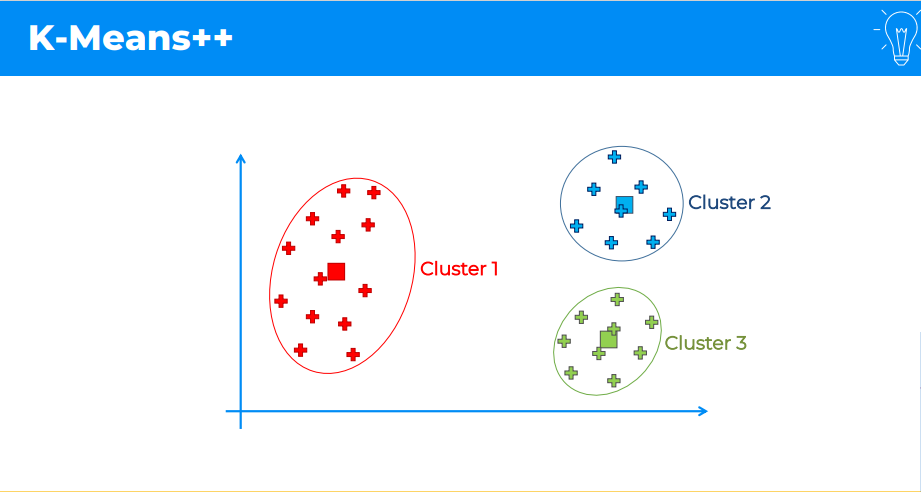

**ADD ON POINTS FOR K-MEANS CLUSTERING :**
- **K-Means** does not **Gaurantee** that there will be **Accurate**.
- Because in **Terms** of **Initializing** it does at **Random**.
- But still it is **Done** at **Weihted Random Fasion** in the method of **K-Means++**, So the **Chance** might be **Less**.

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT THE DATASET

In [ ]:
Data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Mall_Customers.csv")
Data

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
...,...,...,...,...,...
195,196,Female,35,120,79
196,197,Female,45,126,28
197,198,Male,32,126,74
198,199,Male,32,137,18


In [ ]:
X = Data.iloc[:, [3, 4]]
X

,Annual Income (k$),Spending Score (1-100)
0,15,39
1,15,81
2,16,6
3,16,77
4,17,40
...,...,...
195,120,79
196,126,28
197,126,74
198,137,18


In [ ]:
X_Array = Data.iloc[:, [3, 4]].values

#### USING ELBOW METHOD TO FIND THE OPTIMAL NUMBER OF CLUSTERS

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: F

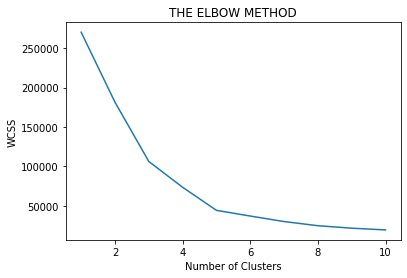

In [ ]:
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
  KM_CL = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
  KM_CL.fit(X)

  wcss.append(KM_CL.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('THE ELBOW METHOD')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

The **Optimal Number** seems to be **5**

#### TRAINING THE K-MEANS MODEL ON THE DATASET

In [ ]:
KM_CL = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
Y_KMeans = KM_CL.fit_predict(X_Array)

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
print(Y_KMeans)

[2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2 3 2
 3 2 3 2 3 2 0 2 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 4 1 4 0 4 1 4 1 4 0 4 1 4 1 4 1 4 1 4 0 4 1 4 1 4
 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4 1
 4 1 4 1 4 1 4 1 4 1 4 1 4 1 4]


#### JOINING THE CLUSTER VARIABLE TO THE DATASET

- We will create **5** different **Dependent Variable** for our **Clusters**.

In [ ]:
Y_K_Means = pd.DataFrame(Y_KMeans, columns = ["Predicted Cluster Class"])
Y_K_Means

,Predicted Cluster Class
0,2
1,3
2,2
3,3
4,2
...,...
195,4
196,1
197,4
198,1


In [ ]:
Predicted_Data = X.join(Y_K_Means)
Predicted_Data

,Annual Income (k$),Spending Score (1-100),Predicted Cluster Class
0,15,39,2
1,15,81,3
2,16,6,2
3,16,77,3
4,17,40,2
...,...,...,...
195,120,79,4
196,126,28,1
197,126,74,4
198,137,18,1


#### VISUALIZING THE CLUSTERS

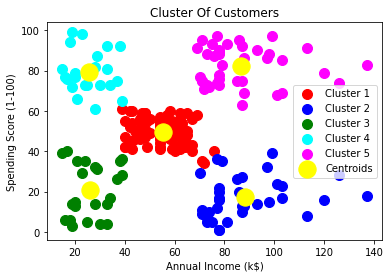

In [ ]:
plt.scatter(X_Array[Y_KMeans == 0, 0], X_Array[Y_KMeans == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X_Array[Y_KMeans == 1, 0], X_Array[Y_KMeans == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X_Array[Y_KMeans == 2, 0], X_Array[Y_KMeans == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(X_Array[Y_KMeans == 3, 0], X_Array[Y_KMeans == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4')
plt.scatter(X_Array[Y_KMeans == 4, 0], X_Array[Y_KMeans == 4, 1], s = 100, c = 'magenta', label = 'Cluster 5')
plt.scatter(KM_CL.cluster_centers_[:, 0], KM_CL.cluster_centers_[:, 1], s = 300, c = 'yellow', label = 'Centroids')
plt.title('Cluster Of Customers')
plt.xlabel('Annual Income (k$)')
plt.ylabel('Spending Score (1-100)')
plt.legend()
plt.show()

### PART 22 : HIERARCHICAL CLUSTERING

#### INTUITION

##### INTRODUCTION :

**Hierarchical Clustering** will be **Called** in the **Short Form** as **HC**.
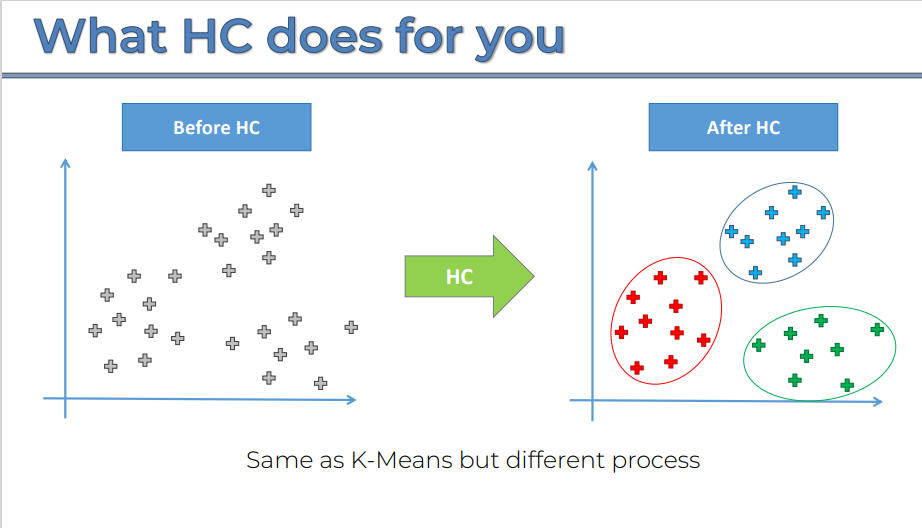

- So **HC** works similarly to the **K-Means Clustering**.
- But the **Process** is somewhat **Different**.

There are **2 Types** of **Hierarcical Clustering**.

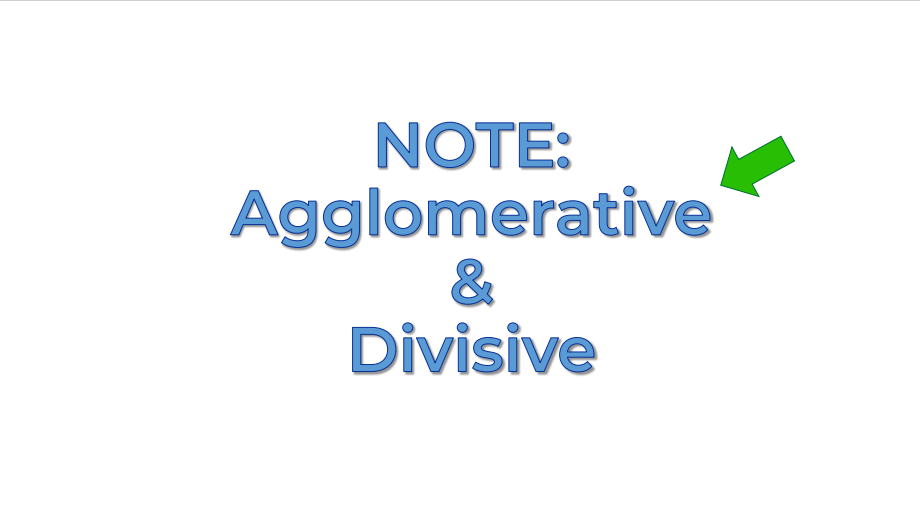

##### AGGLOMERATIVE HIERARCHICAL CLUSTERING

**STEPS FOR BUILDING AGGLOMERATIVE HC :**
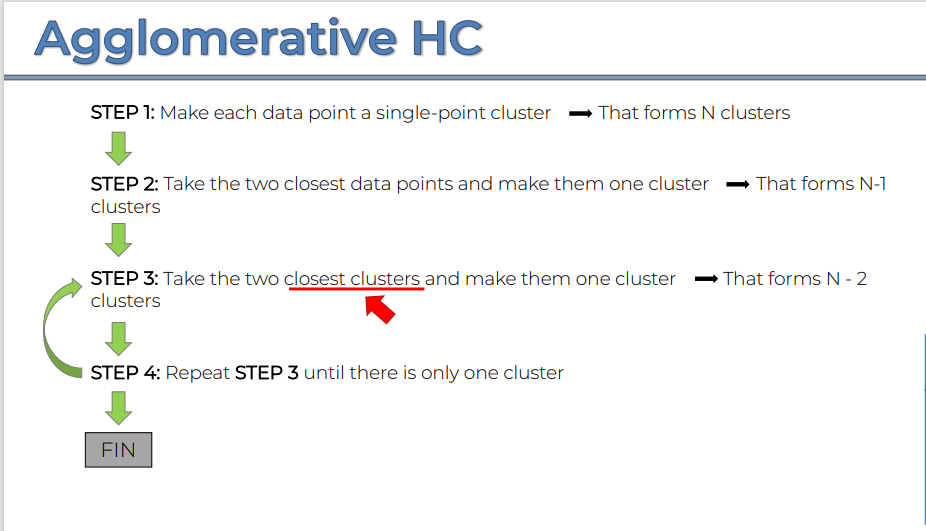

**DISTANCE BETWEEN DATA POINT : DISTANCE FORMULA**
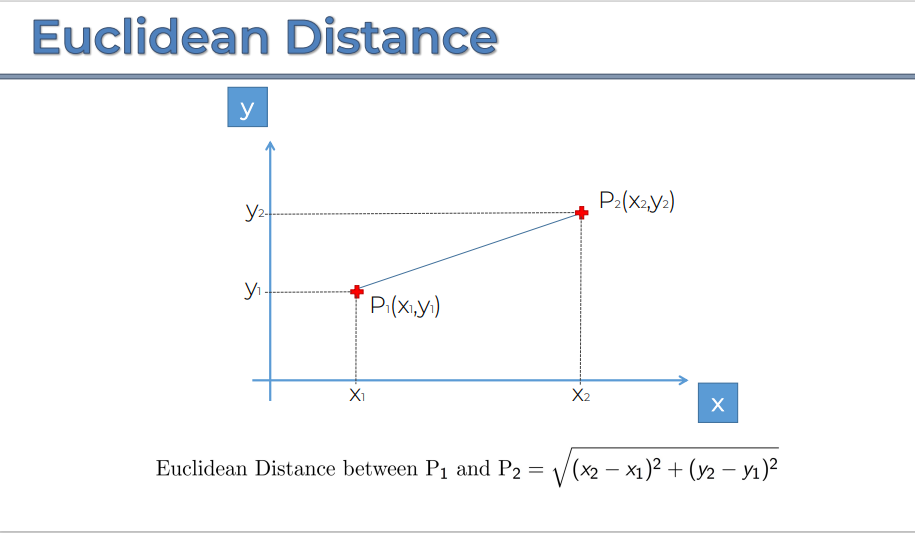

**DISTCANCE BETWEEN CLUSTERS : OPTIONS**
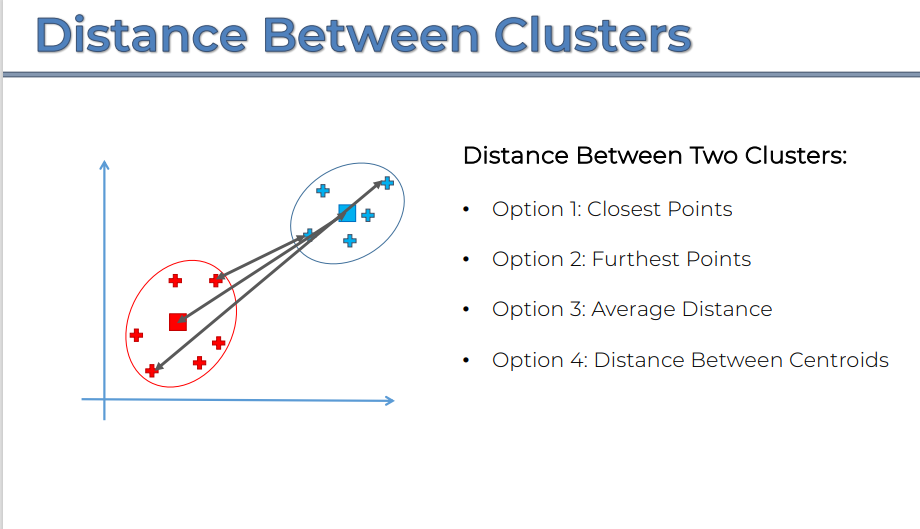

**STEP BY STEP APPROACH ON WORKING OF AGGLOMERATIVE HIERARCHICAL CLUSTERING :**


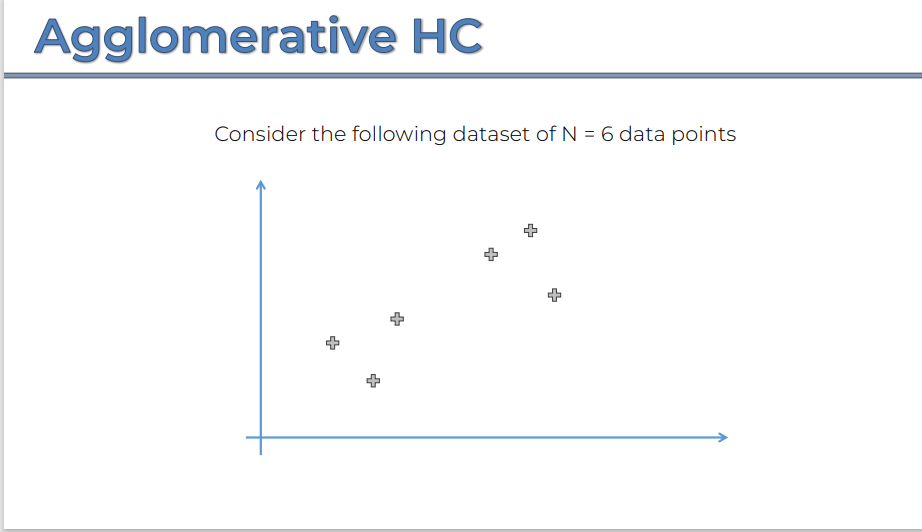
- Take a **DataSet**.
- Now This **DataSet** has **6 Data Points**.

**STEP 1 :**
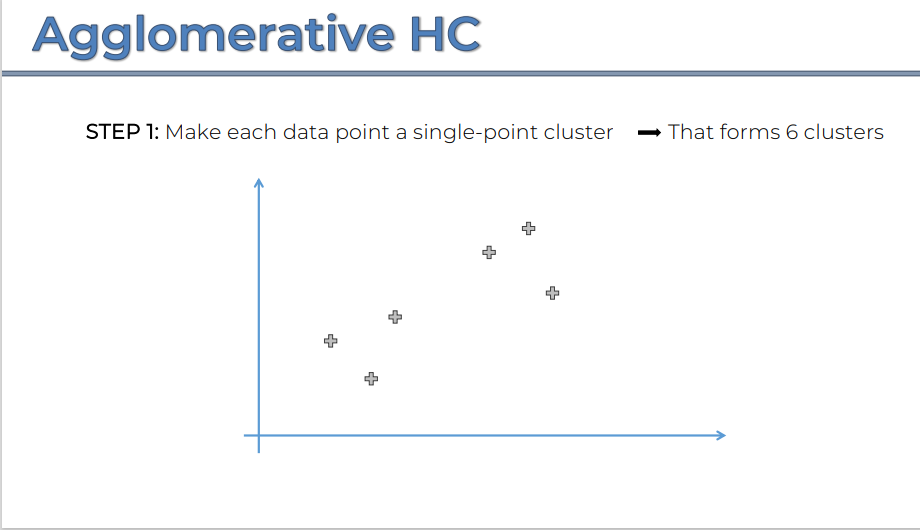
- Make **Each Data Point** as a **Single Point Clusters**.
- As we stated earlier, we have **6 Data Points**.
- So it is on the **Form** of **N = 6, Clusters**.

**STEP 2 :**
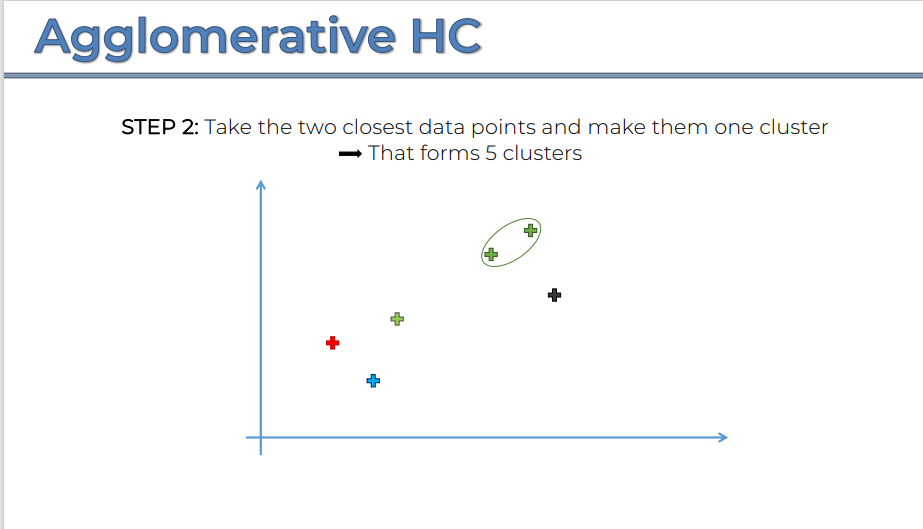
- Take **2 Closest Data Points** and make them as **One Clusters**.
- So the **Custering** is done on the basis of **Closest Distant Point**.
- So now this **Transforms** as **N - 1, Clusters**.
- Inthis **Case** it is **6 - 1 = 5, Clusters**.

**STEP 3 :**
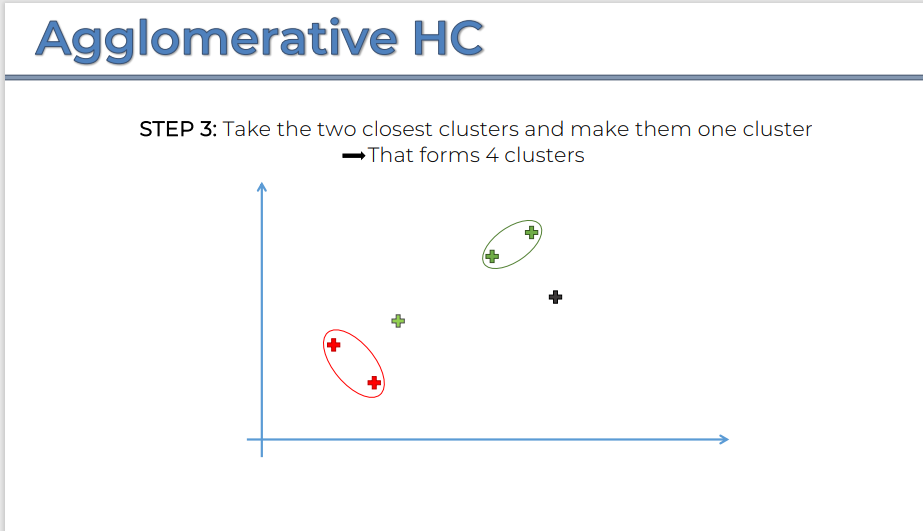
- take the **Closest Clusters** and mae them **One Single Cluster**.
- So this **Transforms** the **Cluster** into **N-2, Clusters**.
- So **Cluster = 6 - 2 => 4, Clusters**.

**STEP 4 :**
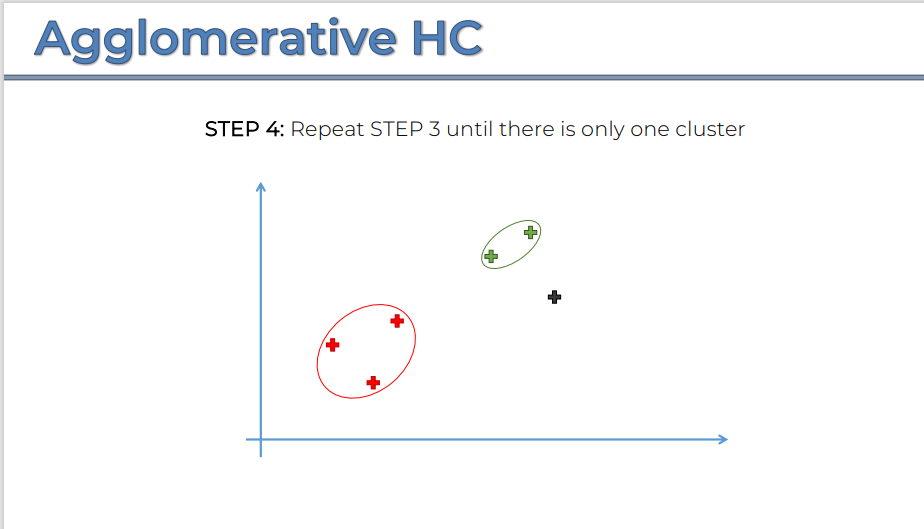
- Repeat the **Step 3** until we get **One Single Cluster**.

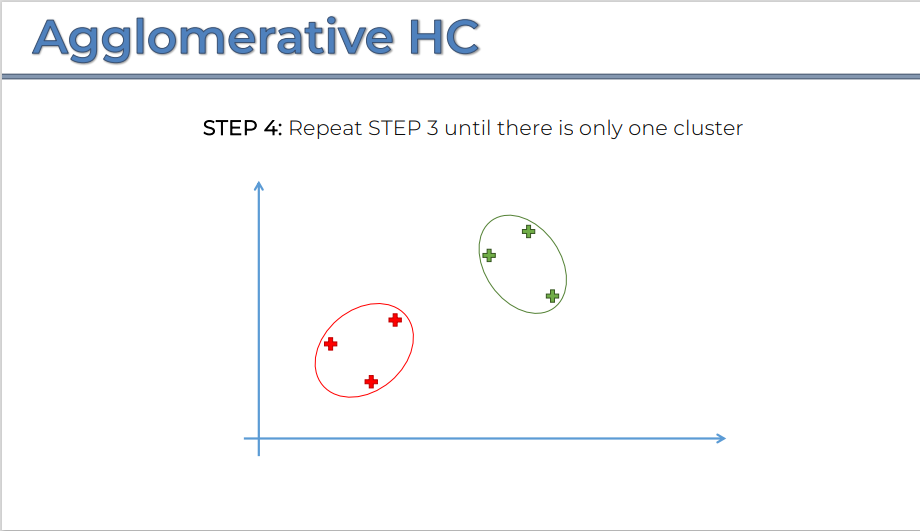

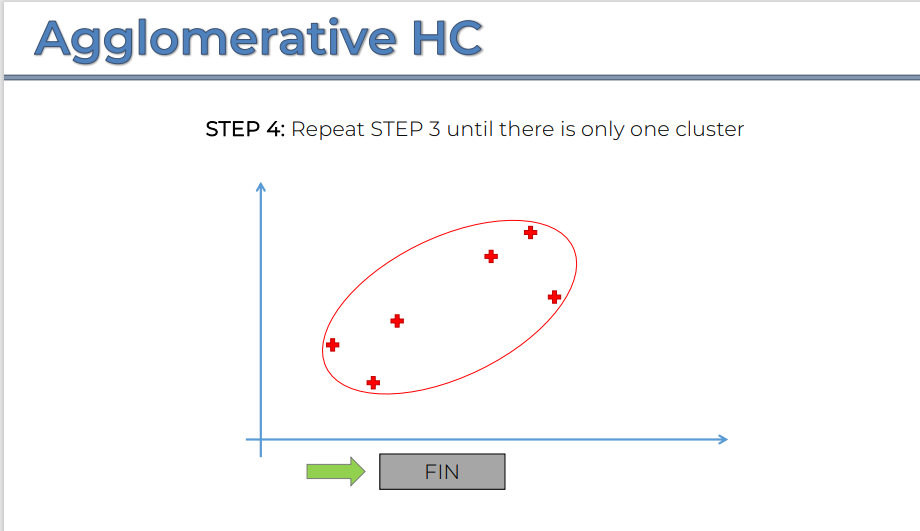

- The way that **Hierarchical Clustering** works is that it maintains a **Memory** of how we went through it.
- That **Memory** is stored in the **Dendrograms**.

##### WORKING OF DENDROGRAMS IN HC

**STEP 1 :**
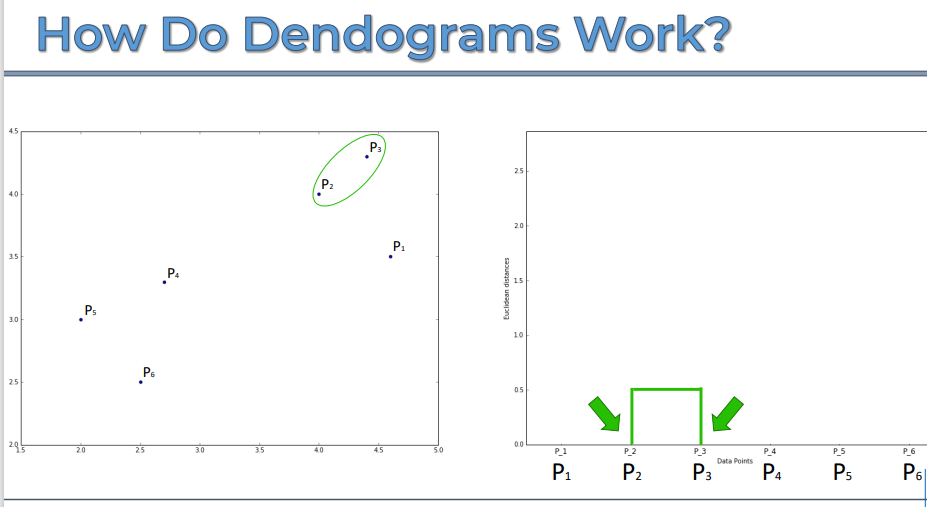

**STEP 2 :**
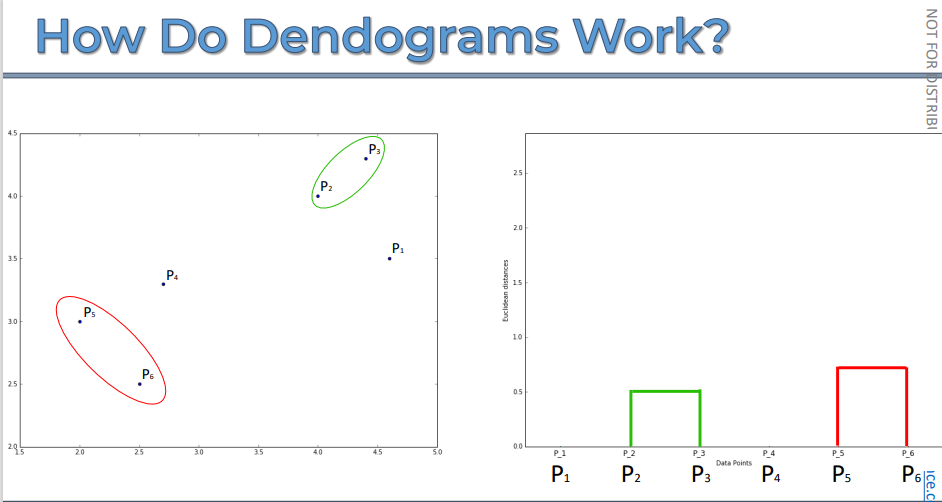

**STEP 3 :**
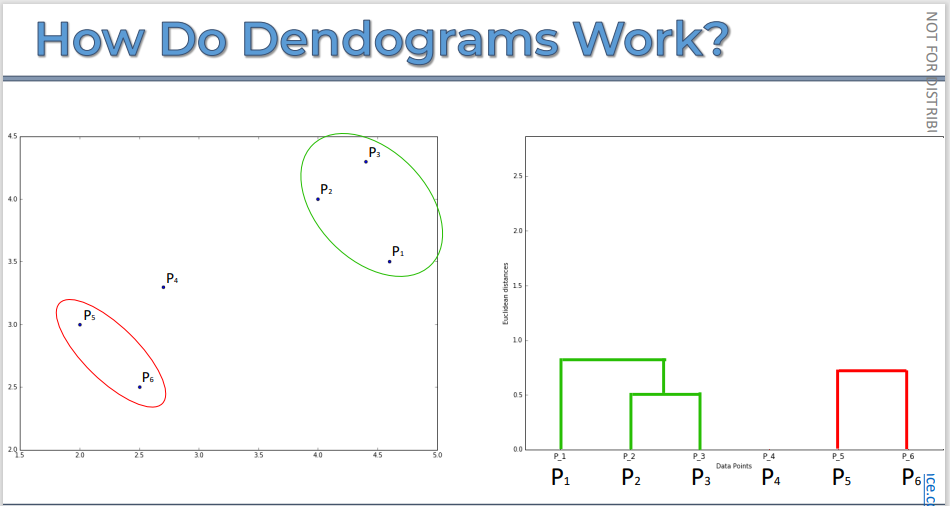

- The **Intersection** between the the **Cluster P1** and the **Cluster P1|P2** is called the **Dissimilarity**.

**STEP 4 :**
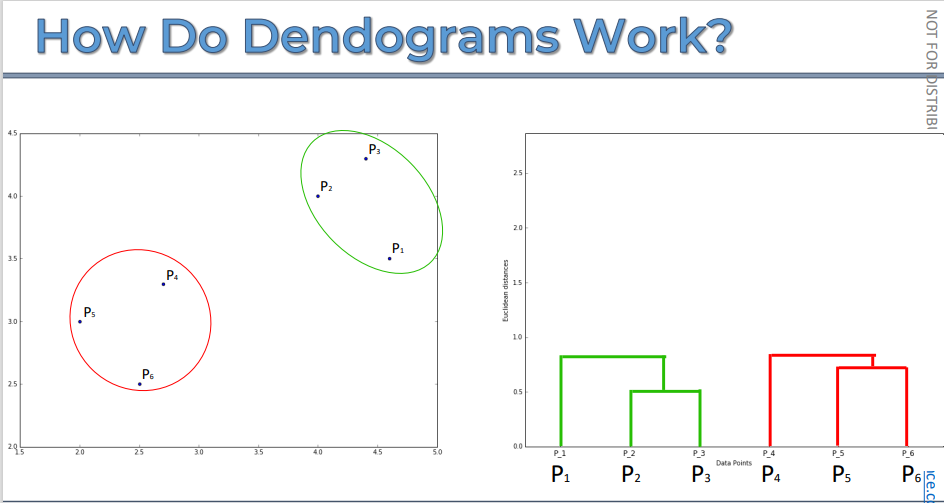

**STEP 5 :**
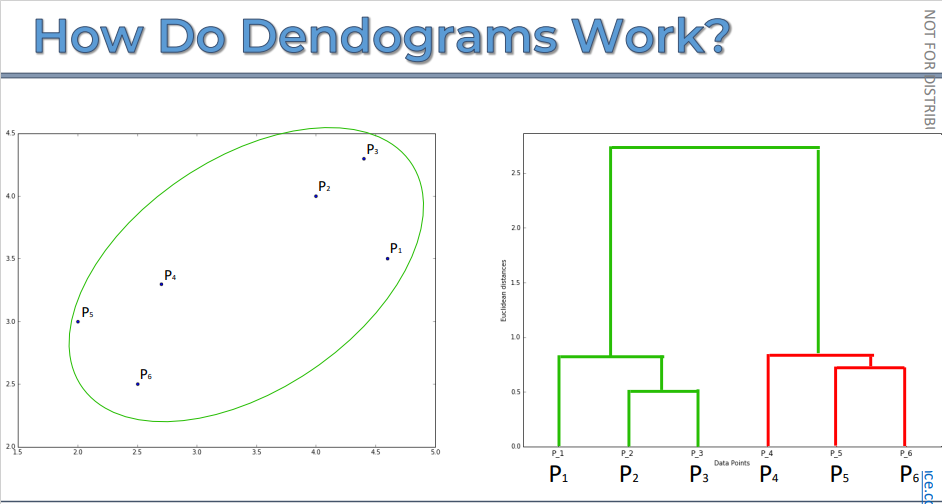

**DENDROGRAMS REPRESENTATION OF HIERARCHICAL CLUSTERING :**
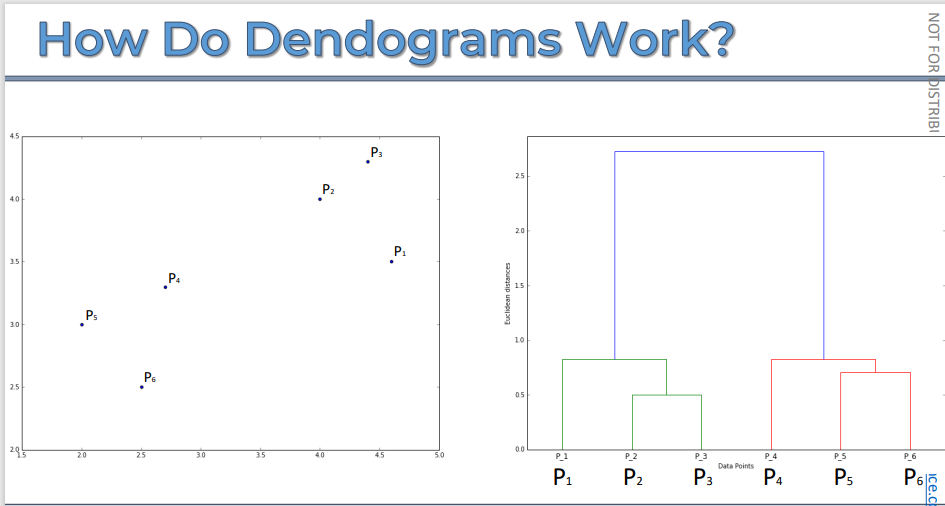

##### HIERARCHICAL CLUSTERING USING DENDROGRAMS

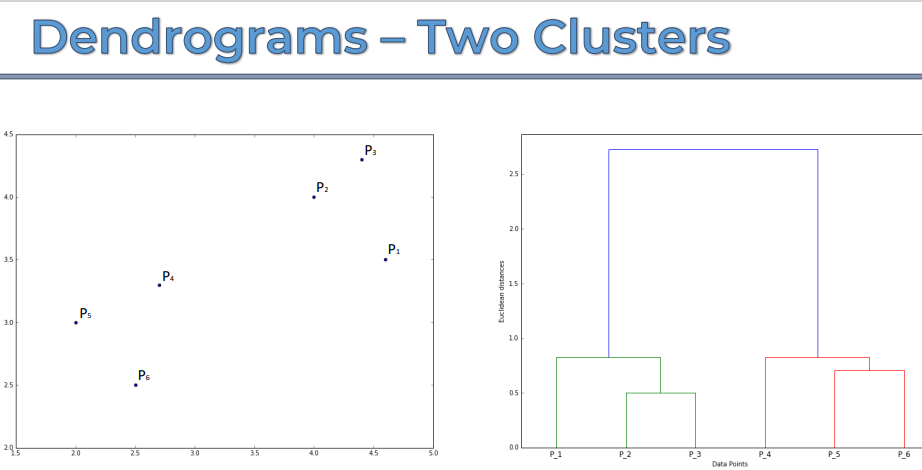
- In the **Previous Slides** we have seen the the working of **Dendrograms**.
- Now lets look at how to select the **Optimal Number** for the **Clusters** to **Form**.

**CASE 1 :**
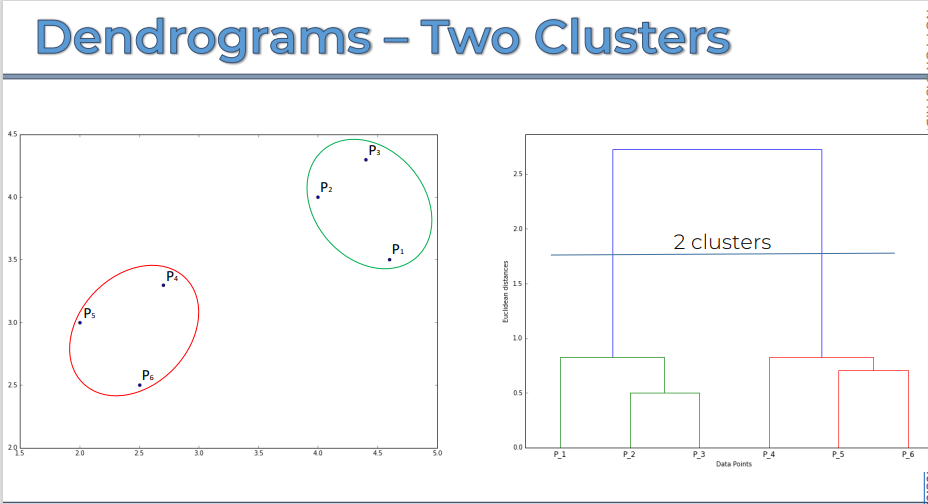
- So let's take a **Treshold Value** by drawing a **Horizontal Line**.
- This is Called as **Dissimilarity Treshold**.
- So in this case we are considering the **Value** to be **1.7**.
- Hence this is going to give us the **2 Clusters**.
- So anything **Above** the **Treshold Value** of **1.7** won't be considered.

**CASE 2 :**
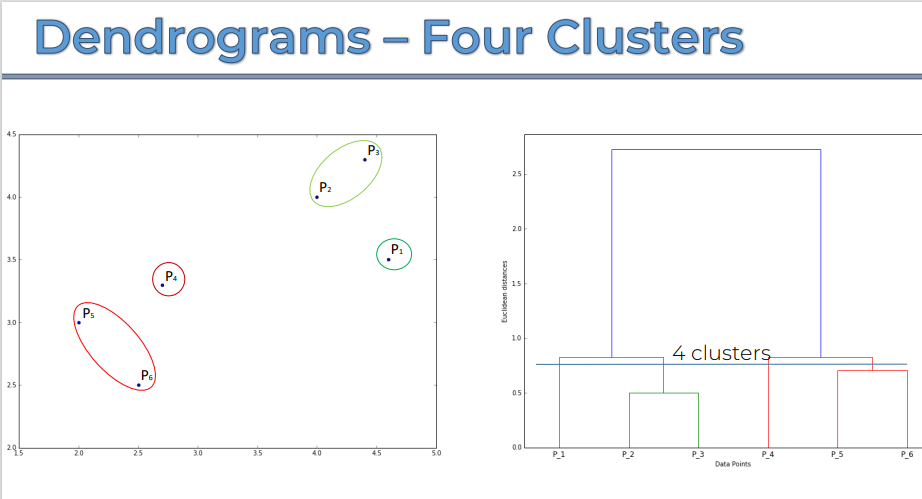
- Similarly if we consider the **Dissimilarity Treshold Value** to be **0.7**, then it is going to give us **4 Clusters**.
- So anything above that **Value** won't be considered.

**CASE 3 :**
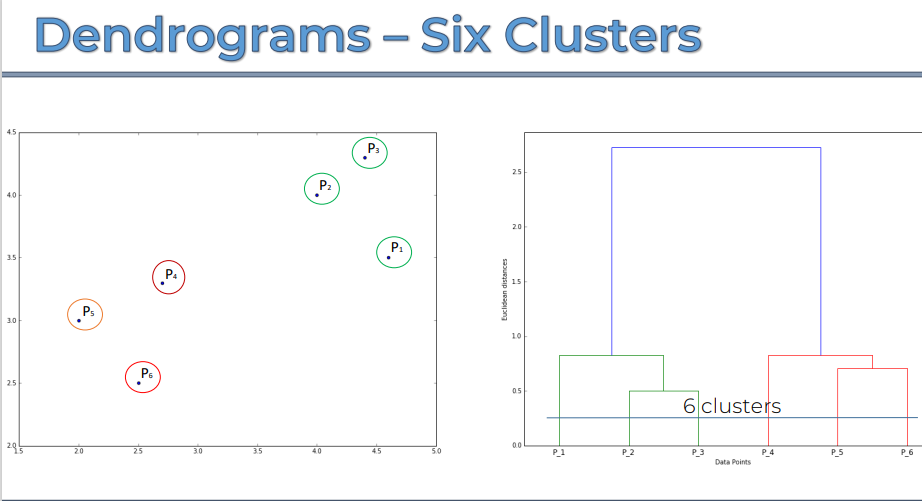
- So now in this case if we consider the **Dissimilarity Treshold Value** to be **0.3**, then we are going to get total **6 Clusters** out of the **^6 Data Points**.
- So anything above the **Value** of the **0.3** won't be considered.

**OPTIMAL VALUE SELECTION :**
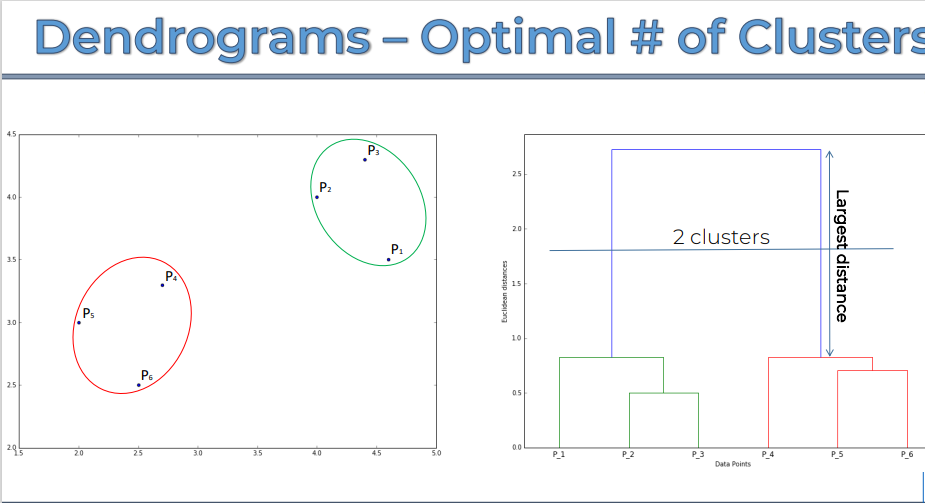
- So to **Select** the **Optimal Value** for the **Dissimilarity Treshold** is based on the **Vertical Largest Distance** of the **Dedrograms**.
- So as we saw in the previous **3 Cases** the **Optimal Value** for the **Dissimilarity Treshold** is **1.7** and that forms **2 Clusters**.

**NEW CASE STUDY :**
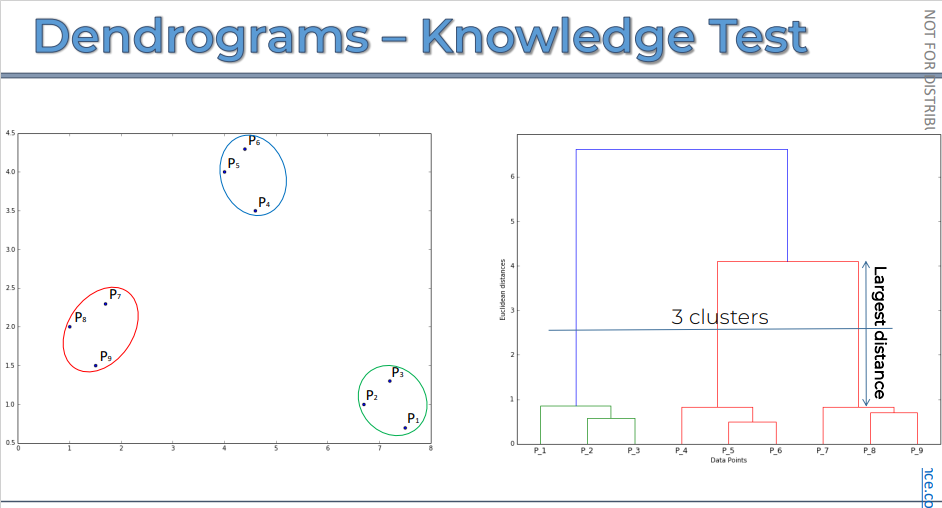
- So in this **Case** the **Dissimilarity Treshold Value** is **Selected** on the basis of the **Vertical Largest Distance** of the **Dendrograms**.
- So here it forms **3 Clusters**. 

#### IMPORT LIRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
Data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Mall_Customers.csv")
Data

,CustomerID,Genre,Age,Annual Income (k$),Spending Score (1-100)
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40
...,...,...,...,...,...
195,196,Female,35,120,79
196,197,Female,45,126,28
197,198,Male,32,126,74
198,199,Male,32,137,18


In [ ]:
X = Data.iloc[:, [3, 4]]

In [ ]:
X_Array = X.values

#### USING DENDROGRAM TO FIND THE OPTIMAL NUMBER OF CLUSTERS

In [ ]:
import scipy.cluster.hierarchy as sch

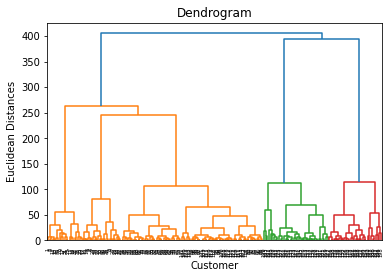

In [ ]:
dendrogram = sch.dendrogram(sch.linkage(X, method = 'ward'))  # ward = minimum variance method
plt.title('Dendrogram')
plt.xlabel('Customer')
plt.ylabel('Euclidean Distances')
plt.show()

- From here we could take the **Vertical Distance** of the **Dendrogram**.
- And that gives us the **Best Value** by comparing the **Vertical Distance** of **Dendrogramnss**.

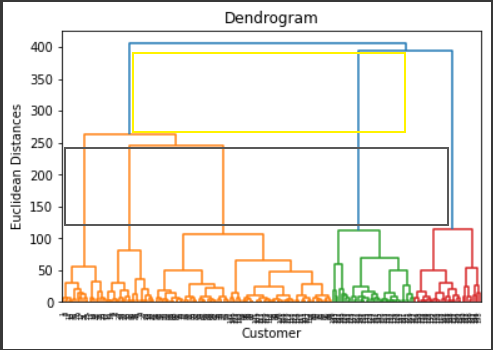

- Seeing the **Both** of the **Vertical Distance**, they seems to be almost **Similar**.
- So let's Try the **Clustering** in the **Both Cases**.
- **CASE 1 : CLUSTERS = 5, VERTICAL_DISTANCE = "BLACK".**
- **CASE 2 : CLUSTERS = 3, VERTICAL_DISTANCE = "YELLOW".** 

#### TRAINING HIERACHIEL CLUSTERING O THE DATASET

In [ ]:
from sklearn.cluster import AgglomerativeClustering 
HC = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage = 'ward')

In [ ]:
Y_HC = HC.fit_predict(X)

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [ ]:
print(Y_HC)

[4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4 3 4
 3 4 3 4 3 4 1 4 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 1 2 0 2 0 2 1 2 0 2 0 2 0 2 0 2 1 2 0 2 1 2
 0 2 0 2 0 2 0 2 0 2 0 2 1 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2 0
 2 0 2 0 2 0 2 0 2 0 2 0 2 0 2]


#### JOINING THE CLUSTER VARIABLE TO THE DATASET

In [ ]:
Y_HC_Data = pd.DataFrame(Y_HC, columns = ["Predicted Class"])

In [ ]:
Predicted_Data = X.join(Y_HC_Data)
Predicted_Data

,Annual Income (k$),Spending Score (1-100),Predicted Class
0,15,39,4
1,15,81,3
2,16,6,4
3,16,77,3
4,17,40,4
...,...,...,...
195,120,79,2
196,126,28,0
197,126,74,2
198,137,18,0


#### VISUALIZING THE CLUSTERS

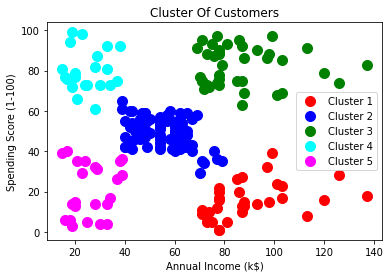

In [ ]:
plt.scatter(X_Array[Y_HC == 0, 0], X_Array[Y_HC == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X_Array[Y_HC == 1, 0], X_Array[Y_HC == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X_Array[Y_HC == 2, 0], X_Array[Y_HC == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.scatter(X_Array[Y_HC == 3, 0], X_Array[Y_HC == 3, 1], s = 100, c = 'cyan', label = 'Cluster 4')
plt.scatter(X_Array[Y_HC == 4, 0], X_Array[Y_HC == 4, 1], s = 100, c = 'magenta', label = 'Cluster 5')
plt.title('Cluster Of Customers')
plt.xlabel('Annual Income (k$)')
plt.ylabel('Spending Score (1-100)')
plt.legend()
plt.show()

#### 3 CLUSTERS :

##### TRAINING CLUSTERS TO 3

In [ ]:
from sklearn.cluster import AgglomerativeClustering
HC_2 = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')

In [ ]:
Y_2_HC = HC_2.fit_predict(X)
print(Y_2_HC)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 2 0 2 0 2 1 2 1 2 0 2 1 2 1 2 1 2 1 2 0 2 1 2 0 2
 1 2 1 2 1 2 1 2 1 2 1 2 0 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2 1
 2 1 2 1 2 1 2 1 2 1 2 1 2 1 2]


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


##### VISUALIZING CLUSTERS

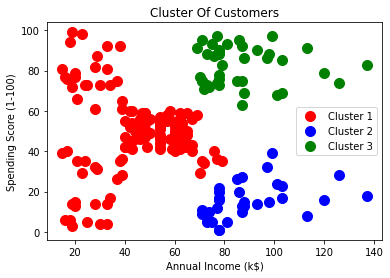

In [ ]:
plt.scatter(X_Array[Y_2_HC == 0, 0], X_Array[Y_2_HC == 0, 1], s = 100, c = 'red', label = 'Cluster 1')
plt.scatter(X_Array[Y_2_HC == 1, 0], X_Array[Y_2_HC == 1, 1], s = 100, c = 'blue', label = 'Cluster 2')
plt.scatter(X_Array[Y_2_HC == 2, 0], X_Array[Y_2_HC == 2, 1], s = 100, c = 'green', label = 'Cluster 3')
plt.title('Cluster Of Customers')
plt.xlabel('Annual Income (k$)')
plt.ylabel('Spending Score (1-100)')
plt.legend()
plt.show()

### PROS | CONS OF CLUSTERING :

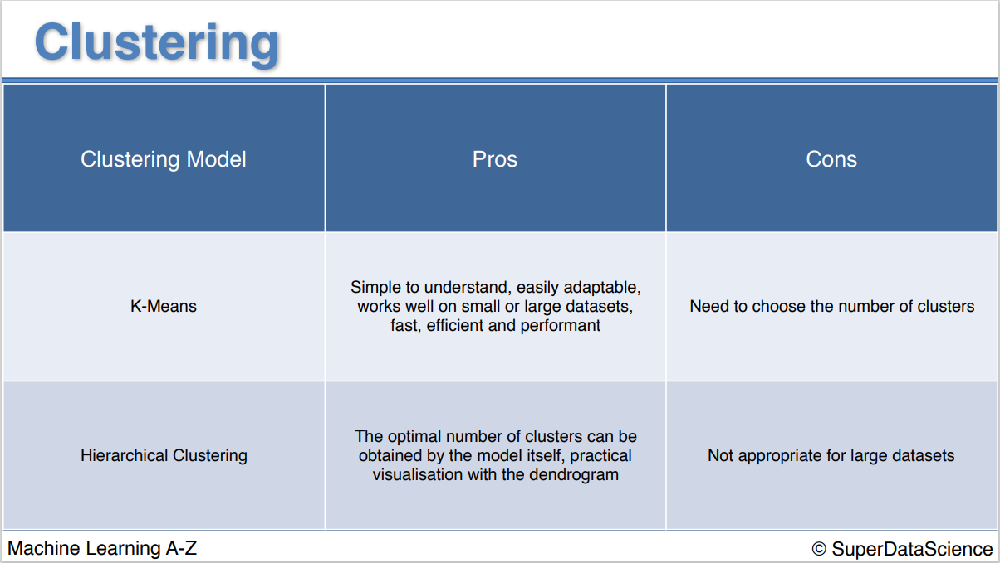

## ASSOCIATION RULE LEARNING : 

### PART 23 : APRIORI

### PART 24 : ECLAT

## DIMENSIONALITY REDUCTION:

### PART 25 : PRINCIPAL COMPONENT ANALYSIS (PCA)

#### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Wine.csv")
data

,Alcohol,Malic_Acid,Ash,Ash_Alcanity,Magnesium,Total_Phenols,Flavanoids,Nonflavanoid_Phenols,Proanthocyanins,Color_Intensity,Hue,OD280,Proline,Customer_Segment
0,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065,1
1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050,1
2,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185,1
3,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480,1
4,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740,3
174,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750,3
175,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835,3
176,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840,3


In [ ]:
X = data.iloc[:, :-1].values
Y = data.iloc[:, -1].values

#### TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0)

#### FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

#### APPLYING PCA (PRINCIPLE COMPOUND ANALYSIS)

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 2)
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)

#### TRAINING LOGISTIC REGRESSION MODEL ON TRAINING SET

In [ ]:
from sklearn.linear_model import LogisticRegression
LC = LogisticRegression(random_state = 0)
LC.fit(X_train, Y_train)

LogisticRegression(random_state=0)

#### CONFUSION MATRIX

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
Y_pred = LC.predict(X_test)
cm = confusion_matrix(Y_test, Y_pred)
print(cm)
print(accuracy_score(Y_test, Y_pred))

[[14  0  0]
 [ 1 15  0]
 [ 0  0  6]]
0.9722222222222222


**CONFUSION MATRIX VISUALIZATION :**

Text(33.0, 0.5, 'ACTUAL LABEL')

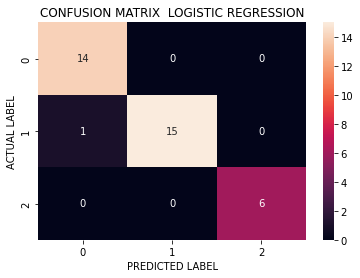

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True)
plt.title("CONFUSION MATRIX  LOGISTIC REGRESSION")
plt.xlabel("PREDICTED LABEL")
plt.ylabel("ACTUAL LABEL")

#### VISUALIZING TRAINING SET RESULT

<ipython-input-58-7df0d8886e1a>:10: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],


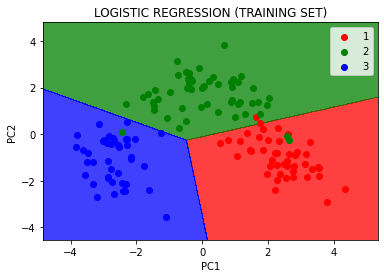

In [ ]:
from matplotlib.colors import ListedColormap
X_set, y_set = X_train, Y_train
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 0.01), 
                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 0.01))
plt.contourf(X1, X2, LC.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green', 'blue')))
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
for i, j in enumerate(np.unique(y_set)):
  plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1], 
              c = ListedColormap(('red', 'green', 'blue'))(i), label = j)
plt.title("LOGISTIC REGRESSION (TRAINING SET)")
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

#### VISUALIZING TEST SET RESULT

<ipython-input-59-1a4f1c3f5452>:10: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],


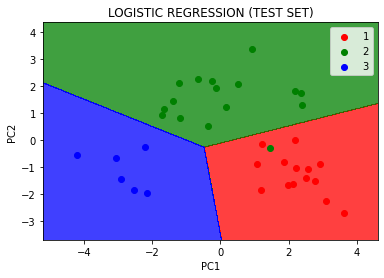

In [ ]:
from matplotlib.colors import ListedColormap
X_set, y_set = X_test, Y_test
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 0.01), 
                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 0.01))
plt.contourf(X1, X2, LC.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green', 'blue')))
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
for i, j in enumerate(np.unique(y_set)):
  plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1], 
              c = ListedColormap(('red', 'green', 'blue'))(i), label = j)
plt.title("LOGISTIC REGRESSION (TEST SET)")
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()
plt.show()

### PART 26 : LINEAR DISCRIMINANT ANALYSIS (LDA) 

### PART 27 : KERNEL **PCA**

----

## NATURAL LANGUAGE PROCESSING

### PART 26 : NATURAL LANGUAGE PROCESSING

----

## DEEP LEARNING

### PART 27 : ARTIFICIAL NEUTRAL NETWORKS

### PART 28 : CONVOLUTIONAL NEUTRAL NETWORKS

----

## MODEL SELECTION AND BOOSTING

### PART 29 : MODEL SELECTION

#### PART A : K-FOLD CROSS VALIDATION

##### SUPPORT VECTOR MACHINE CLASSIFICATION (K-FOLD CROSS VALIDATION METHOD)

###### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

###### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Social_Network_Ads.csv")
data

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0
...,...,...,...
395,46,41000,1
396,51,23000,1
397,50,20000,1
398,36,33000,0


In [ ]:
X = data.iloc[:, :-1]
X

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000
...,...,...
395,46,41000
396,51,23000
397,50,20000
398,36,33000


In [ ]:
Y = data.iloc[:, -1]
Y

0      0
1      0
2      0
3      0
4      0
      ..
395    1
396    1
397    1
398    0
399    1
Name: Purchased, Length: 400, dtype: int64

###### TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [ ]:
X_train

,Age,EstimatedSalary
250,44,39000
63,32,120000
312,38,50000
159,32,135000
283,52,21000
...,...,...
323,48,30000
192,29,43000
117,36,52000
47,27,54000


In [ ]:
X_test

,Age,EstimatedSalary
132,30,87000
309,38,50000
341,35,75000
196,30,79000
246,35,50000
...,...,...
146,27,96000
135,23,63000
390,48,33000
264,48,90000


In [ ]:
Y_train

250    0
63     1
312    0
159    1
283    1
      ..
323    1
192    0
117    0
47     0
172    0
Name: Purchased, Length: 300, dtype: int64

In [ ]:
Y_test

132    0
309    0
341    0
196    0
246    0
      ..
146    1
135    0
390    1
264    1
364    1
Name: Purchased, Length: 100, dtype: int64

###### FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [ ]:
X_train = pd.DataFrame(sc.fit_transform(X_train), columns = ["Age", "Salary"])
X_train

,Age,Salary
0,0.581649,-0.886707
1,-0.606738,1.461738
2,-0.012544,-0.567782
3,-0.606738,1.896635
4,1.373907,-1.408584
...,...,...
295,0.977778,-1.147645
296,-0.903834,-0.770734
297,-0.210609,-0.509796
298,-1.101899,-0.451810


In [ ]:
X_test = pd.DataFrame(sc.transform(X_test), columns = ["Age", "Salary"])
X_test

,Age,Salary
0,-0.804802,0.504964
1,-0.012544,-0.567782
2,-0.309641,0.157046
3,-0.804802,0.273019
4,-0.309641,-0.567782
...,...,...
95,-1.101899,0.765902
96,-1.498028,-0.190872
97,0.977778,-1.060666
98,0.977778,0.591943


###### TRAINING SUPPORT VECTOR MACHINE MODEL (TRAINING SET)

In [ ]:
from sklearn.svm import SVC
SVM = SVC(kernel = 'rbf', random_state = 0)

In [ ]:
SVM.fit(X_train, Y_train)

SVC(random_state=0)

###### PREDICTING A NEW RESULT (FROM TEST SET)

In [ ]:
print(SVM.predict(sc.transform([[30, 87000]])))

[0]


/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


###### PREDICTING TEST SET

In [ ]:
Y_pred = SVM.predict(X_test)
Y_pred

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1])

In [ ]:
Y_pred = pd.DataFrame(Y_pred, columns = ["Purchased Predicted"])
Y_pred

,Purchased Predicted
0,0
1,0
2,0
3,0
4,0
...,...
95,0
96,0
97,1
98,1


###### COMPARING PREDICTION VS ACTUAL 

In [ ]:
Test_Set = X_test.join(pd.DataFrame(np.array(Y_test)))
Test_Set

,Age,Salary,0
0,-0.804802,0.504964,0
1,-0.012544,-0.567782,0
2,-0.309641,0.157046,0
3,-0.804802,0.273019,0
4,-0.309641,-0.567782,0
...,...,...,...
95,-1.101899,0.765902,1
96,-1.498028,-0.190872,0
97,0.977778,-1.060666,1
98,0.977778,0.591943,1


In [ ]:
Compare_Data = Test_Set.join(Y_pred)
Compare_Data

,Age,Salary,0,Purchased Predicted
0,-0.804802,0.504964,0,0
1,-0.012544,-0.567782,0,0
2,-0.309641,0.157046,0,0
3,-0.804802,0.273019,0,0
4,-0.309641,-0.567782,0,0
...,...,...,...,...
95,-1.101899,0.765902,1,0
96,-1.498028,-0.190872,0,0
97,0.977778,-1.060666,1,1
98,0.977778,0.591943,1,1


###### MAKING CONFUSION MATRIX

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(Y_test, Y_pred)
cm

array([[64,  4],
       [ 3, 29]])

**VISUALIZING CONFUSION MATRIX :**

Text(33.0, 0.5, 'ACTUAL LABEL')

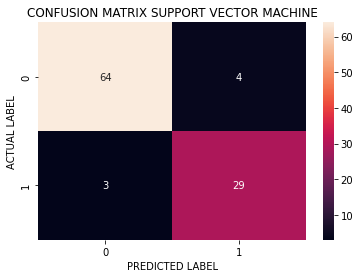

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True)
plt.title("CONFUSION MATRIX SUPPORT VECTOR MACHINE")
plt.xlabel("PREDICTED LABEL")
plt.ylabel("ACTUAL LABEL")

In [ ]:
accuracy_score(Y_test, Y_pred)

0.93

###### K-FOLD CROSS VALIDATION

In [ ]:
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = SVM, X = X_train, y = Y_train, cv = 10)
print("Accuracy : {:.2f} %".format(accuracies.mean()*100))
print("Standard_Deviation : {:.2f} %".format(accuracies.std()*100))

Accuracy : 90.33 %
Standard_Deviation : 6.57 %


###### VISUALIZING THE TRAINING SET

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
<ipython-input-29-2b60c7f1656c>:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)


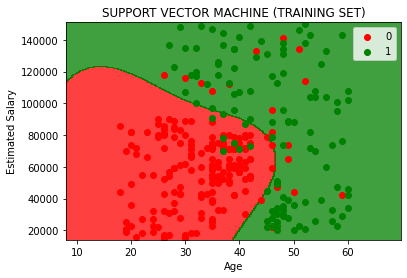

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_train), Y_train.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, SVM.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("SUPPORT VECTOR MACHINE (TRAINING SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


###### VISUALIZING THE TEST SET

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
<ipython-input-30-6a6ee35c40fc>:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)


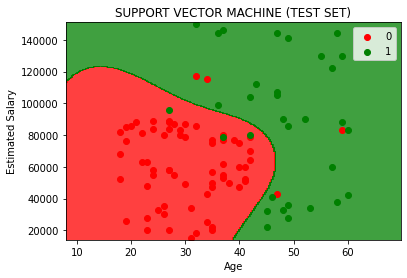

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_test), Y_test.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 10, stop = X_set[:, 0].max() + 10, step = 0.25), 
                     np.arange(start = X_set[:, 1].min() - 1000, stop = X_set[:, 1].max() + 1000, step = 0.25))
plt.contourf(X1, X2, SVM.predict(sc.transform(np.array([X1.ravel(), X2.ravel()]).T)).reshape(X1.shape), 
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(Y_set)):
  plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1], c = ListedColormap(('red', 'green'))(i), label = j)

plt.title("SUPPORT VECTOR MACHINE (TEST SET)")
plt.xlabel("Age")
plt.ylabel("Estimated Salary")
plt.legend()
plt.show()


#### PART B : GRID SEARCH 

##### SUPPORT VECTOR MACHINE CLASSIFICATION (GRID SEARCH CV METHOD)

###### IMPORT LIBRARIES

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

###### IMPORT DATASET

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Machine Learning A-Z Datasets/Social_Network_Ads.csv")
data

,Age,EstimatedSalary,Purchased
0,19,19000,0
1,35,20000,0
2,26,43000,0
3,27,57000,0
4,19,76000,0
...,...,...,...
395,46,41000,1
396,51,23000,1
397,50,20000,1
398,36,33000,0


In [ ]:
X = data.iloc[:, :-1]
X

,Age,EstimatedSalary
0,19,19000
1,35,20000
2,26,43000
3,27,57000
4,19,76000
...,...,...
395,46,41000
396,51,23000
397,50,20000
398,36,33000


In [ ]:
Y = data.iloc[:, -1]
Y

0      0
1      0
2      0
3      0
4      0
      ..
395    1
396    1
397    1
398    0
399    1
Name: Purchased, Length: 400, dtype: int64

###### TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [ ]:
X_train

,Age,EstimatedSalary
250,44,39000
63,32,120000
312,38,50000
159,32,135000
283,52,21000
...,...,...
323,48,30000
192,29,43000
117,36,52000
47,27,54000


In [ ]:
X_test

,Age,EstimatedSalary
132,30,87000
309,38,50000
341,35,75000
196,30,79000
246,35,50000
...,...,...
146,27,96000
135,23,63000
390,48,33000
264,48,90000


In [ ]:
Y_train

250    0
63     1
312    0
159    1
283    1
      ..
323    1
192    0
117    0
47     0
172    0
Name: Purchased, Length: 300, dtype: int64

In [ ]:
Y_test

132    0
309    0
341    0
196    0
246    0
      ..
146    1
135    0
390    1
264    1
364    1
Name: Purchased, Length: 100, dtype: int64

###### FEATURE SCALING

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [ ]:
X_train = pd.DataFrame(sc.fit_transform(X_train), columns = ["Age", "Salary"])
X_train

,Age,Salary
0,0.581649,-0.886707
1,-0.606738,1.461738
2,-0.012544,-0.567782
3,-0.606738,1.896635
4,1.373907,-1.408584
...,...,...
295,0.977778,-1.147645
296,-0.903834,-0.770734
297,-0.210609,-0.509796
298,-1.101899,-0.451810


In [ ]:
X_test = pd.DataFrame(sc.transform(X_test), columns = ["Age", "Salary"])
X_test

,Age,Salary
0,-0.804802,0.504964
1,-0.012544,-0.567782
2,-0.309641,0.157046
3,-0.804802,0.273019
4,-0.309641,-0.567782
...,...,...
95,-1.101899,0.765902
96,-1.498028,-0.190872
97,0.977778,-1.060666
98,0.977778,0.591943


###### TRAINING SUPPORT VECTOR MACHINE MODEL (TRAINING SET)

In [ ]:
from sklearn.svm import SVC
SVM = SVC(kernel = 'rbf', random_state = 0)

In [ ]:
SVM.fit(X_train, Y_train)

SVC(random_state=0)

###### PREDICTING A NEW RESULT (FROM TEST SET)

In [ ]:
print(SVM.predict(sc.transform([[30, 87000]])))

[0]


/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


###### PREDICTING TEST SET

In [ ]:
Y_pred = SVM.predict(X_test)
Y_pred

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1])

In [ ]:
Y_pred = pd.DataFrame(Y_pred, columns = ["Purchased Predicted"])
Y_pred

,Purchased Predicted
0,0
1,0
2,0
3,0
4,0
...,...
95,0
96,0
97,1
98,1


###### COMPARING PREDICTION VS ACTUAL 

In [ ]:
Test_Set = X_test.join(pd.DataFrame(np.array(Y_test)))
Test_Set

,Age,Salary,0
0,-0.804802,0.504964,0
1,-0.012544,-0.567782,0
2,-0.309641,0.157046,0
3,-0.804802,0.273019,0
4,-0.309641,-0.567782,0
...,...,...,...
95,-1.101899,0.765902,1
96,-1.498028,-0.190872,0
97,0.977778,-1.060666,1
98,0.977778,0.591943,1


In [ ]:
Compare_Data = Test_Set.join(Y_pred)
Compare_Data

,Age,Salary,0,Purchased Predicted
0,-0.804802,0.504964,0,0
1,-0.012544,-0.567782,0,0
2,-0.309641,0.157046,0,0
3,-0.804802,0.273019,0,0
4,-0.309641,-0.567782,0,0
...,...,...,...,...
95,-1.101899,0.765902,1,0
96,-1.498028,-0.190872,0,0
97,0.977778,-1.060666,1,1
98,0.977778,0.591943,1,1


###### MAKING CONFUSION MATRIX

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(Y_test, Y_pred)
cm

array([[64,  4],
       [ 3, 29]])

**VISUALIZING CONFUSION MATRIX :**

Text(50.722222222222214, 0.5, 'ACTUAL LABEL')

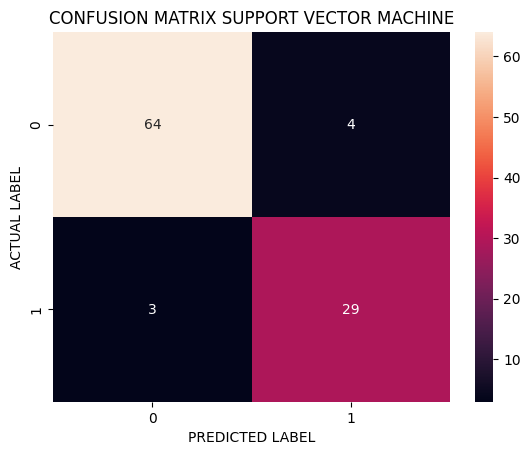

In [ ]:
import seaborn as sns
sns.heatmap(cm, annot=True)
plt.title("CONFUSION MATRIX SUPPORT VECTOR MACHINE")
plt.xlabel("PREDICTED LABEL")
plt.ylabel("ACTUAL LABEL")

In [ ]:
accuracy_score(Y_test, Y_pred)

0.93

###### K-FOLD CROSS VALIDATION

In [ ]:
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = SVM, X = X_train, y = Y_train, cv = 10)
print("Accuracy : {:.2f} %".format(accuracies.mean()*100))
print("Standard_Deviation : {:.2f} %".format(accuracies.std()*100))

Accuracy : 90.33 %
Standard_Deviation : 6.57 %


###### APPLYING GRID SEARCH CV

In [ ]:
from sklearn.model_selection import GridSearchCV
parameters = [{'C' : [1, 10, 100, 1000], 'kernel' : ['linear']}, 
              {'C' : [1, 10, 100, 1000], 'kernel' : ['rbf'], 'gamma' : [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]}]
grid_search = GridSearchCV(estimator = SVM, 
                           param_grid = parameters, 
                           scoring = 'accuracy', 
                           cv = 10, 
                           n_jobs = -1)
grid_search = grid_search.fit(X = X_train, y = Y_train)
    

###### VISUALIZING THE TRAINING SET

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_train), Y_train.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 0.01))
plt.contourf(X1, X2, SVM.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
for i, j in enumerate(np.unique(y_set)):
    plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1],
                c = ListedColormap(('red', 'green'))(i), label = j)
plt.title('Kernel SVM (Training set)')
plt.xlabel('Age')
plt.ylabel('Estimated Salary')
plt.legend()
plt.show()


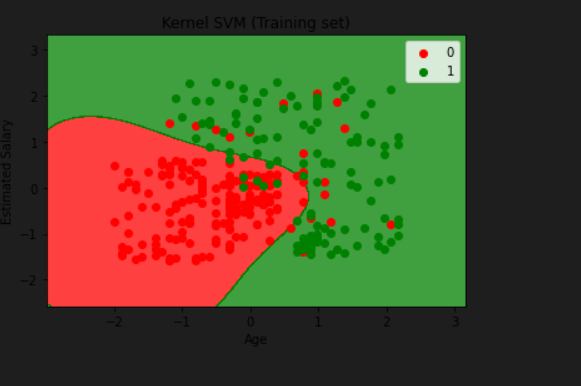

###### VISUALIZING THE TEST SET

In [ ]:
from matplotlib.colors import ListedColormap
X_set, Y_set = sc.inverse_transform(X_test), Y_test.values
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 0.01),
                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 0.01))
plt.contourf(X1, X2, SVM.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),
             alpha = 0.75, cmap = ListedColormap(('red', 'green')))
plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())
for i, j in enumerate(np.unique(y_set)):
    plt.scatter(X_set[Y_set == j, 0], X_set[Y_set == j, 1],
                c = ListedColormap(('red', 'green'))(i), label = j)
plt.title('Kernel SVM (Test set)')
plt.xlabel('Age')
plt.ylabel('Estimated Salary')
plt.legend()
plt.show()
plt.show()

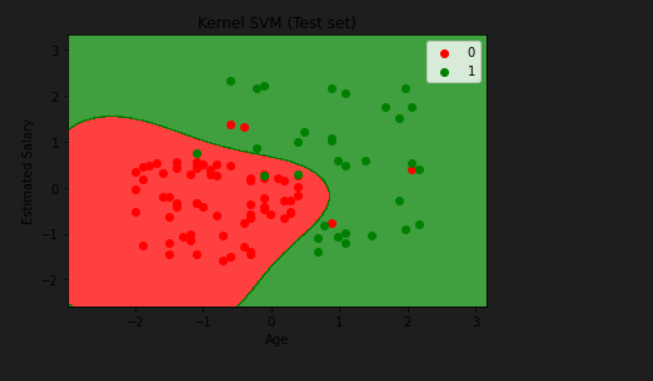

### PART 30 : XG BOOST

## END
----